In [2]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase
# %load_ext autoreload
# %autoreload 2
import os
from archetypes import *
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd
import matplotlib.colors as mcolors

In [1]:
# RGB values for each region
region_color = {
    "Ocean": (0.2154516905067, 0.295, 0.5078367867510504),
    "Desert": (0.78, 0.51, 0.1892045842),
    "Biogenic": (0.12071162840208301, 0.4357915995132193, 0.2463679091477368),
    "Urban": (0.7, 0.7, 0.65),
    "Almost Polar": (0.5184891135337089, 0.7194769933793438, 0.7518803726887796),
    "Polar": (0.5632111255041908, 0.758620966612444, 0.7764634182455044)
}

# Region for each location
location_to_region = {
    'Amazon': 'Biogenic',
    'AtlanticOcean': 'Ocean',
    'Beijing': 'Urban',
    'Borneo': 'Biogenic',
    'CapeGrim': 'Polar',
    'Congo': 'Biogenic',
    'ElDjouf': 'Desert',
    'Graciosa': 'Ocean',
    'IndianOcean': 'Ocean',
    'Kinshasa': 'Urban',
    'LosAngeles': 'Urban',
    'McMurdo': 'Polar',
    'Ozarks': 'Biogenic',
    'PacificOcean': 'Ocean',
    'Paris': 'Urban',
    'Utqiagvik': 'Almost Polar'
}

In [61]:
#For categorical
# categorical = True, legend_color = dictionary with keys as labels and values as colors
# For continuous
# categorical = False, legend_color = array of values according to which to color and cmap as name of color map to use

def plot_simplex(n_archetypes, alfa, color_vertex, plot_args={}, grid_on=True, cmap='viridis', categorical=True, legend_color=None, label = True):
    vertex_colors = ['red', 'blue', 'green', 'yellow']
    labels = ('A'+str(i + 1) for i in range(n_archetypes))
    rotate_labels = True
    label_offset = 0.10
    data = alfa.T
    scaling = False
    sides = n_archetypes
    basis = np.array(
        [
            [
                np.cos(2*_*pi/sides + 90*pi/180),
                np.sin(2*_*pi/sides + 90*pi/180)
            ] 
            for _ in range(sides)
        ]
    )     

    print(basis)
    # If data is Nxsides, newdata is Nx2.
    if scaling:
        # Scales data for you.
        newdata = np.dot((data.T / data.sum(-1)).T, basis)
    else:
        # Assumes data already sums to 1.
        newdata = np.dot(data, basis)

    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111)

    for i, l in enumerate(labels):
        if i >= sides:
            break
        x = basis[i, 0]
        y = basis[i, 1]
        if rotate_labels:
            angle = 180*np.arctan(y/x)/pi + 90
            if angle > 90 and angle <= 270:
                angle = (angle + 180) % 360
        else:
            angle = 0
        ax.text(
            x*(1 + label_offset),
            y*(1 + label_offset),
            l,
            horizontalalignment='center',
            verticalalignment='center',
            rotation=angle
        )

    # Clear normal matplotlib axes graphics.
    ax.set_xticks(())
    ax.set_yticks(())
    ax.set_frame_on(False)

    # Plot border
    lst_ax_0 = []
    lst_ax_1 = []
    for _ in range(sides):
        lst_ax_0.append(basis[_, 0])
        lst_ax_1.append(basis[_, 1])

    lst_ax_0.append(basis[0, 0])
    lst_ax_1.append(basis[0, 1])

    ax.plot(lst_ax_0, lst_ax_1, linewidth=1, zorder=2) 
    
    # Plot vertices
    if color_vertex:
        for i in range(len(color_vertex)):
            v = color_vertex[i]
            ax.scatter(basis[v, 0], basis[v, 1], color=vertex_colors[i], s=200, zorder=4)

    if len(plot_args) == 0:
        ax.scatter(newdata[:, 0], newdata[:, 1], color='black', zorder=3, alpha=0.5)
    else:
        if ('marker' in plot_args):   
            marker_vals = plot_args['marker'].values
            marker_unq = np.unique(marker_vals)                
            
            for marker in marker_unq:
                row_idx = np.where(marker_vals == marker)
                tmp_arg = {}
                for keys in plot_args:
                    if (keys!= 'marker'):
                        tmp_arg[keys] = plot_args[keys].values[row_idx]
                
                ax.scatter(newdata[row_idx,0],newdata[row_idx,1], **tmp_arg, marker =  marker, alpha=0.5, zorder=3)
        else:
            if categorical:
                ax.scatter(newdata[:, 0], newdata[:, 1], **plot_args, marker='s', zorder=3, alpha=0.5)
            else:
                values = legend_color
                # Normalize the values
                norm = Normalize(vmin=min(values), vmax=max(values))
                # Choose a colormap
                cmap = cm.get_cmap(cmap)
                # Map each normalized value to a color
                colors = [cmap(norm(value)) for value in values]
                plot_args['color'] = colors
                
                ax.scatter(newdata[:, 0], newdata[:, 1], **plot_args, marker='s', zorder=3, alpha=0.5)
                
        
    if label:    
        # Add color bar if numerical data
        if not categorical:

            values = legend_color
            # Normalize the values
            norm = Normalize(vmin=min(values), vmax=max(values))

            # Create a ScalarMappable object using a colormap and the normalized values
            scalar_map = cm.ScalarMappable(norm=norm, cmap=cmap)

            # Create an inset axis for the colorbar
            cb_ax = ax.inset_axes([1.15, 0.5, 0.05, 0.4])  # Adjust the position and size as needed

            # Add the colorbar to the inset axis
            colorbar = plt.colorbar(scalar_map, cax=cb_ax, orientation='vertical', label=label)

            # Adjust colorbar properties
            colorbar.minorticks_on()  # Show minor ticks
            colorbar.alpha = 0.5  # Set transparency


        else:
            legend_labels =  legend_color.keys() # Update with actual labels
            legend_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10) for color in legend_color.values()]
            ax.legend(legend_handles, legend_labels, loc='lower right', bbox_to_anchor=(1.15, 0.5))

            
    plt.show()

In [3]:
df = pd.read_csv('GEOS_CF_dataset.csv', index_col='filename')
df.head()

,location,timestamp,longitude,latitude,level,temperature,pressure,air_number_density,average_water,cloud_fraction,...,K906,K907,K908,K909,K910,K911,K912,K913,twilight,region
filename,,,,,,,,,,,,,,,,,,,,,
AmazonTwilight_L10_20180101_2145.txt,Amazon,2018/01/01 21:45,-62.3631,-3.071,10,291.83,858.5508,2.097000e+19,0.02261,0.000094,...,9.194149e-08,4.366680e-06,1.759491e-06,3.077669e-07,1.326652e-06,3.077669e-07,3.077669e-07,1.265506e-06,True,Biogenic
AmazonTwilight_L10_20180101_2200.txt,Amazon,2018/01/01 22:00,-62.3631,-3.071,10,291.79,858.6730,2.098000e+19,0.02258,0.000083,...,3.169007e-08,1.511636e-06,5.944569e-07,1.093729e-07,4.614411e-07,1.093729e-07,1.093729e-07,4.268394e-07,True,Biogenic
AmazonTwilight_L10_20180101_2215.txt,Amazon,2018/01/01 22:15,-62.3631,-3.071,10,291.79,858.5559,2.098000e+19,0.02260,0.000000,...,4.837509e-09,2.250509e-07,9.211448e-08,1.783656e-08,6.799260e-08,1.783656e-08,1.783656e-08,6.623628e-08,True,Biogenic
AmazonTwilight_L10_20180101_2230.txt,Amazon,2018/01/01 22:30,-62.3631,-3.071,10,291.78,858.6656,2.098000e+19,0.02259,0.000047,...,1.609501e-10,7.477167e-09,3.080839e-09,5.565965e-10,2.258006e-09,5.565965e-10,5.565965e-10,2.220224e-09,True,Biogenic
AmazonTwilight_L10_20180102_0930.txt,Amazon,2018/01/02 09:30,-62.3631,-3.071,10,290.06,860.1269,2.114000e+19,0.02196,0.256800,...,5.514297e-11,2.634032e-09,1.047952e-09,2.160709e-10,8.004517e-10,2.160709e-10,2.160709e-10,7.493080e-10,True,Biogenic


In [4]:
level1_df = df[df['level']==1]

[[ 6.12323400e-17  1.00000000e+00]
 [-8.66025404e-01 -5.00000000e-01]
 [ 8.66025404e-01 -5.00000000e-01]]


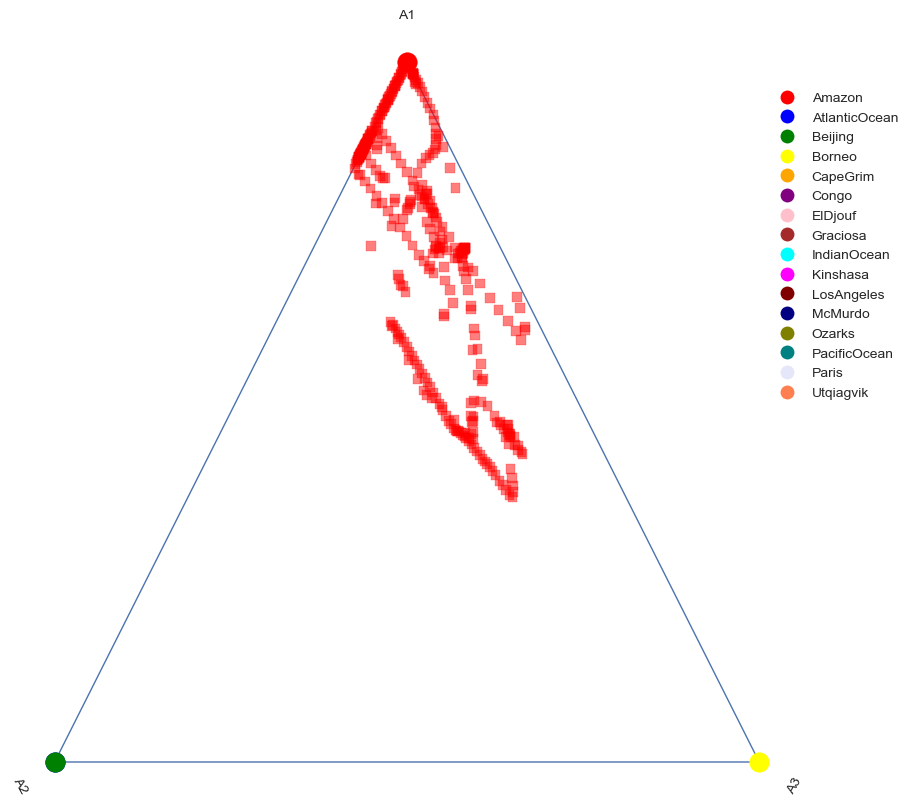

[[ 6.12323400e-17  1.00000000e+00]
 [-8.66025404e-01 -5.00000000e-01]
 [ 8.66025404e-01 -5.00000000e-01]]


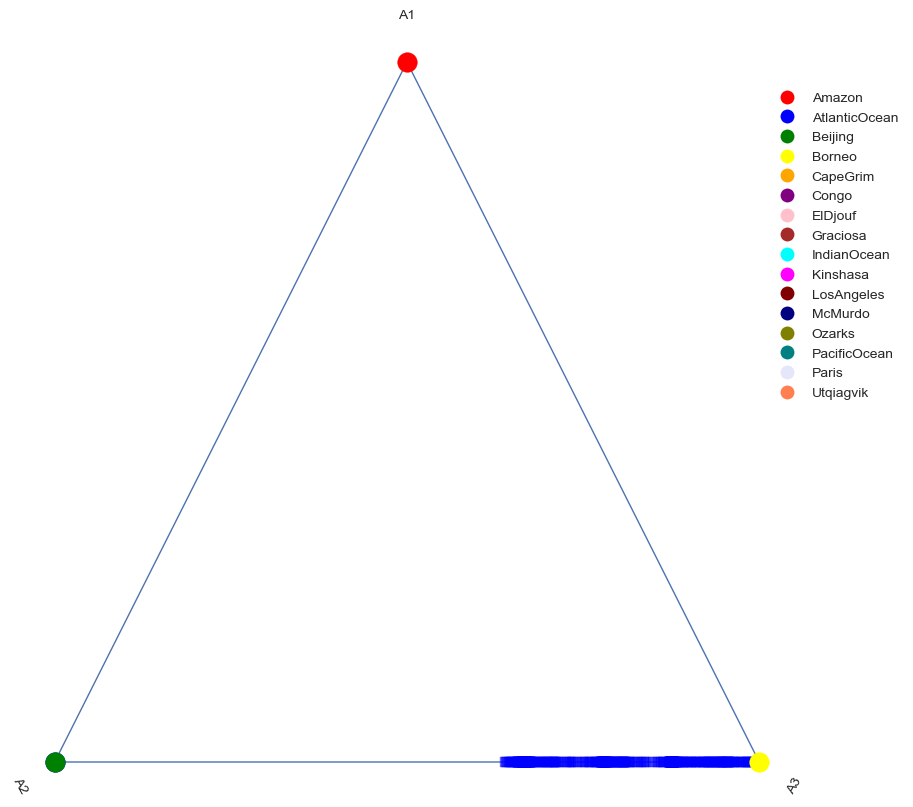

[[ 6.12323400e-17  1.00000000e+00]
 [-8.66025404e-01 -5.00000000e-01]
 [ 8.66025404e-01 -5.00000000e-01]]


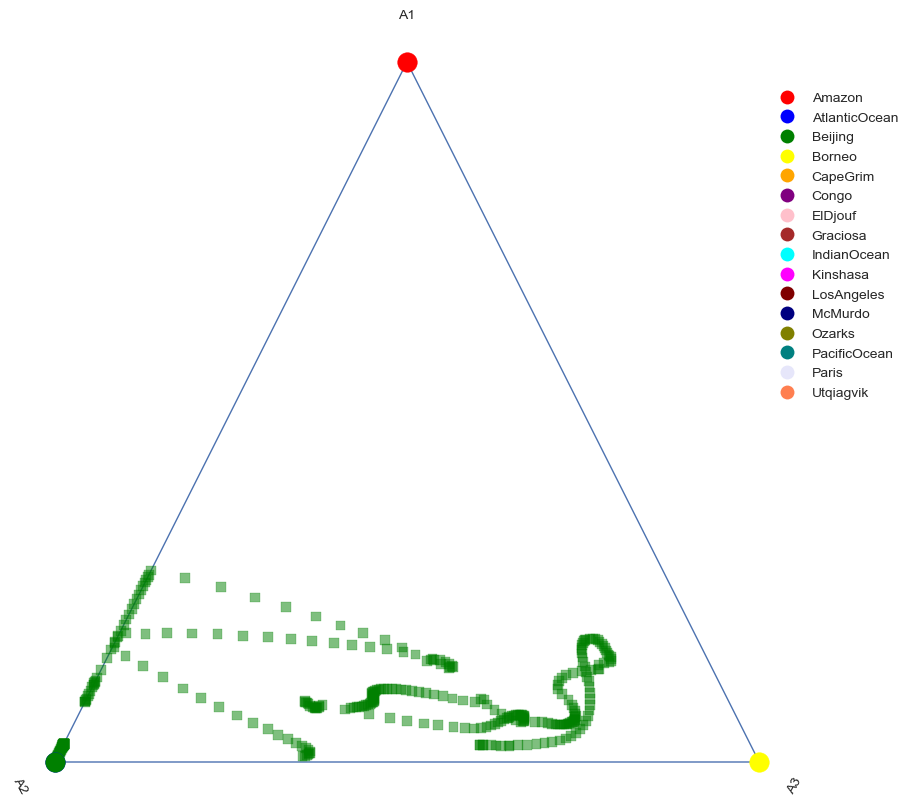

[[ 6.12323400e-17  1.00000000e+00]
 [-8.66025404e-01 -5.00000000e-01]
 [ 8.66025404e-01 -5.00000000e-01]]


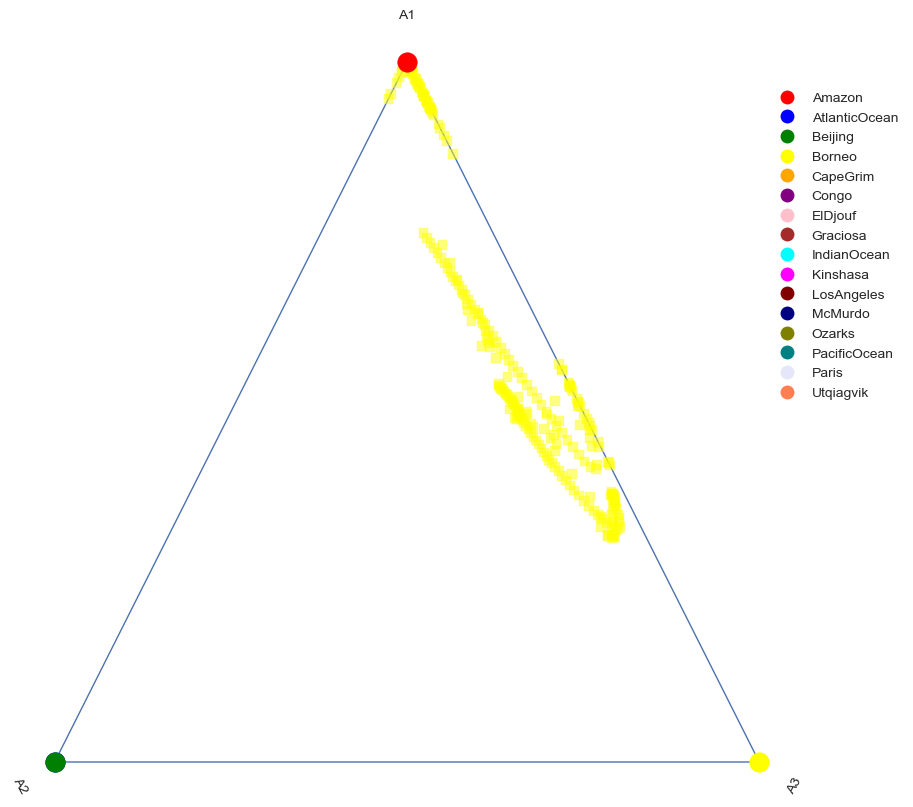

[[ 6.12323400e-17  1.00000000e+00]
 [-8.66025404e-01 -5.00000000e-01]
 [ 8.66025404e-01 -5.00000000e-01]]


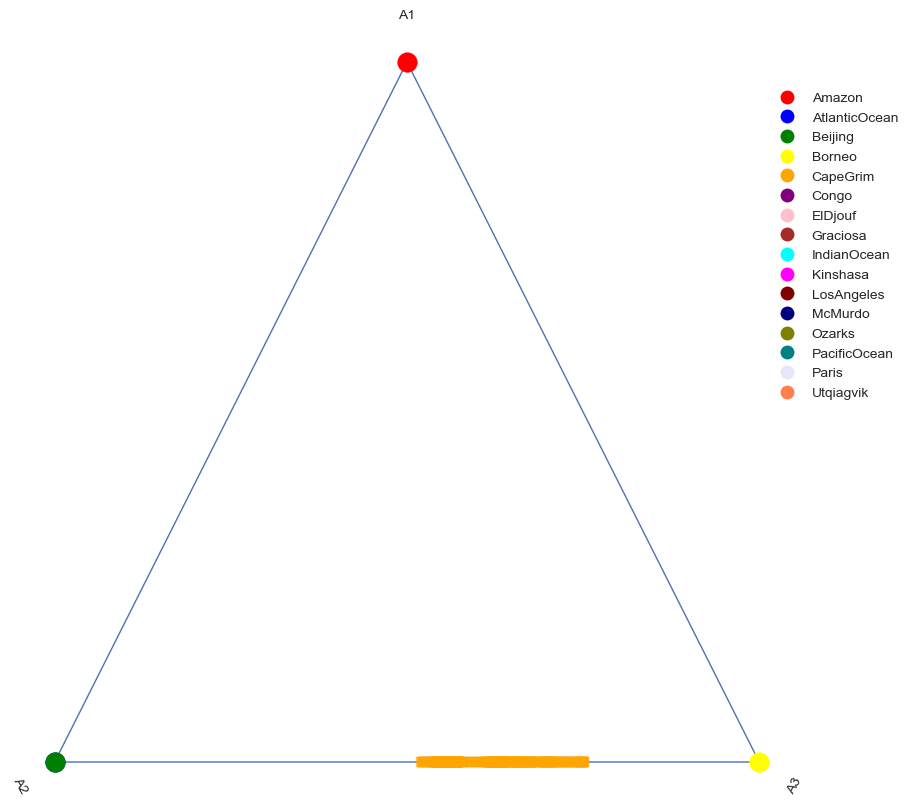

[[ 6.12323400e-17  1.00000000e+00]
 [-8.66025404e-01 -5.00000000e-01]
 [ 8.66025404e-01 -5.00000000e-01]]


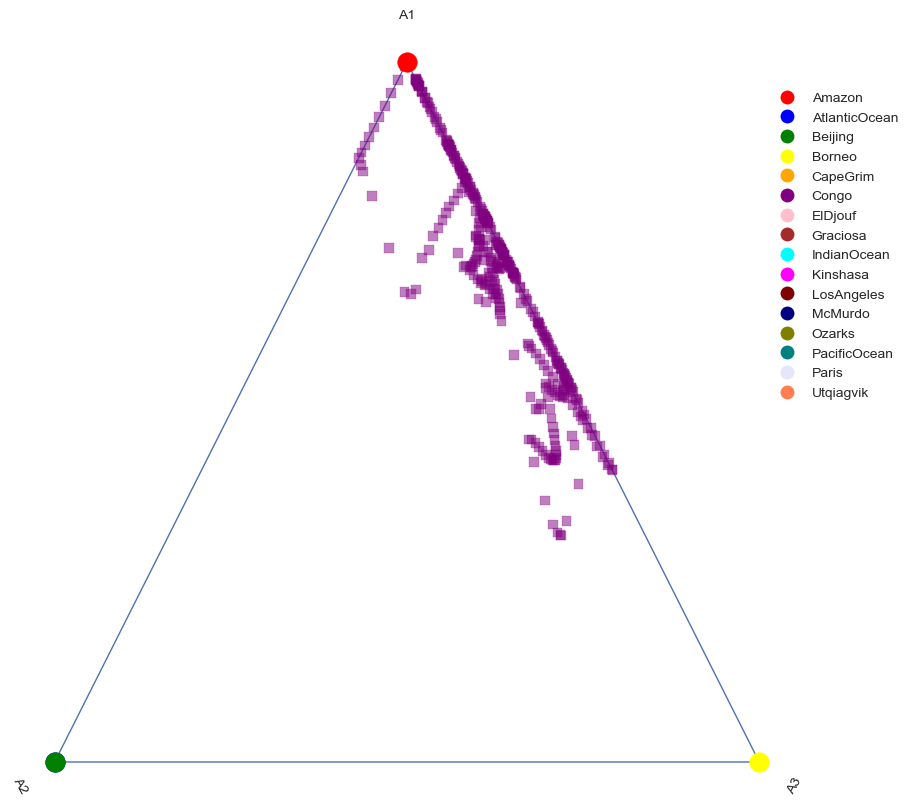

[[ 6.12323400e-17  1.00000000e+00]
 [-8.66025404e-01 -5.00000000e-01]
 [ 8.66025404e-01 -5.00000000e-01]]


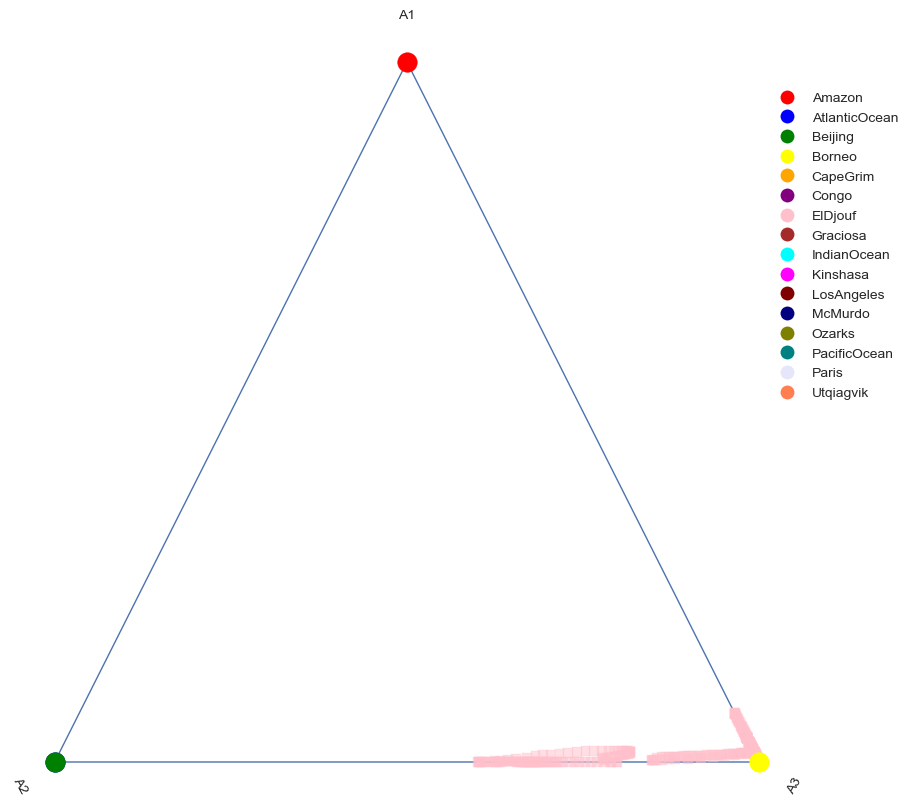

[[ 6.12323400e-17  1.00000000e+00]
 [-8.66025404e-01 -5.00000000e-01]
 [ 8.66025404e-01 -5.00000000e-01]]


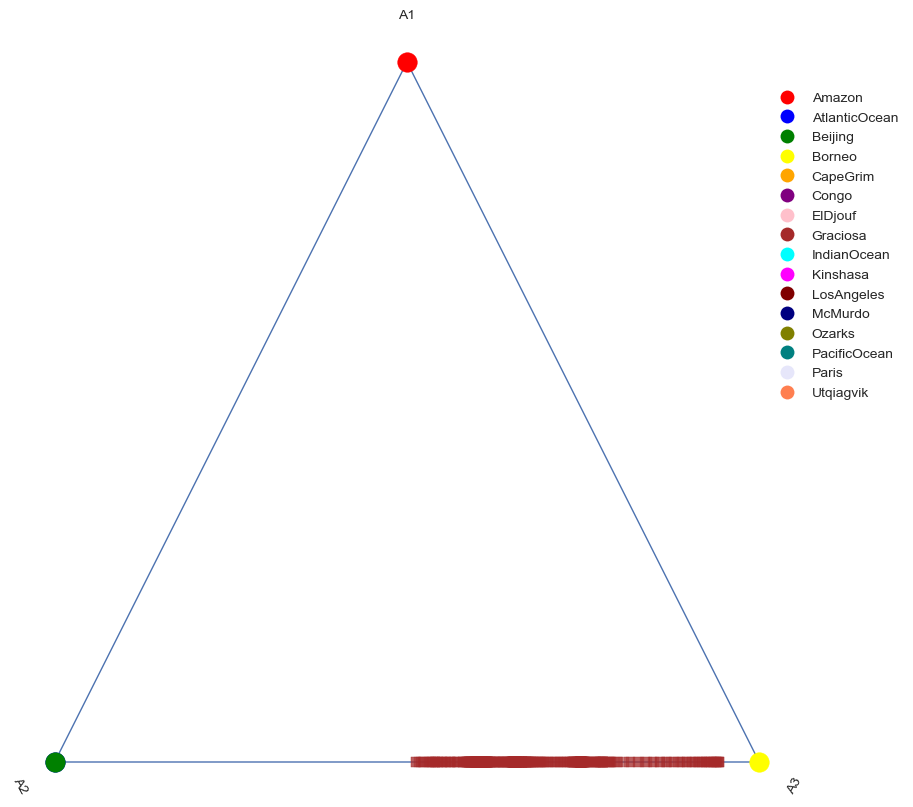

[[ 6.12323400e-17  1.00000000e+00]
 [-8.66025404e-01 -5.00000000e-01]
 [ 8.66025404e-01 -5.00000000e-01]]


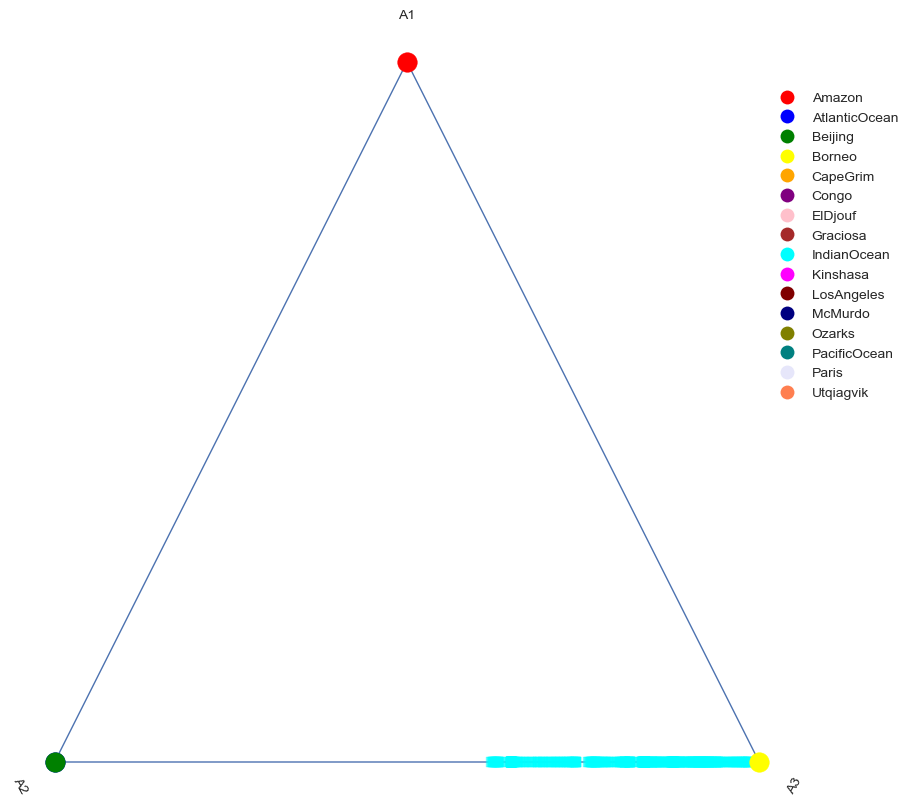

[[ 6.12323400e-17  1.00000000e+00]
 [-8.66025404e-01 -5.00000000e-01]
 [ 8.66025404e-01 -5.00000000e-01]]


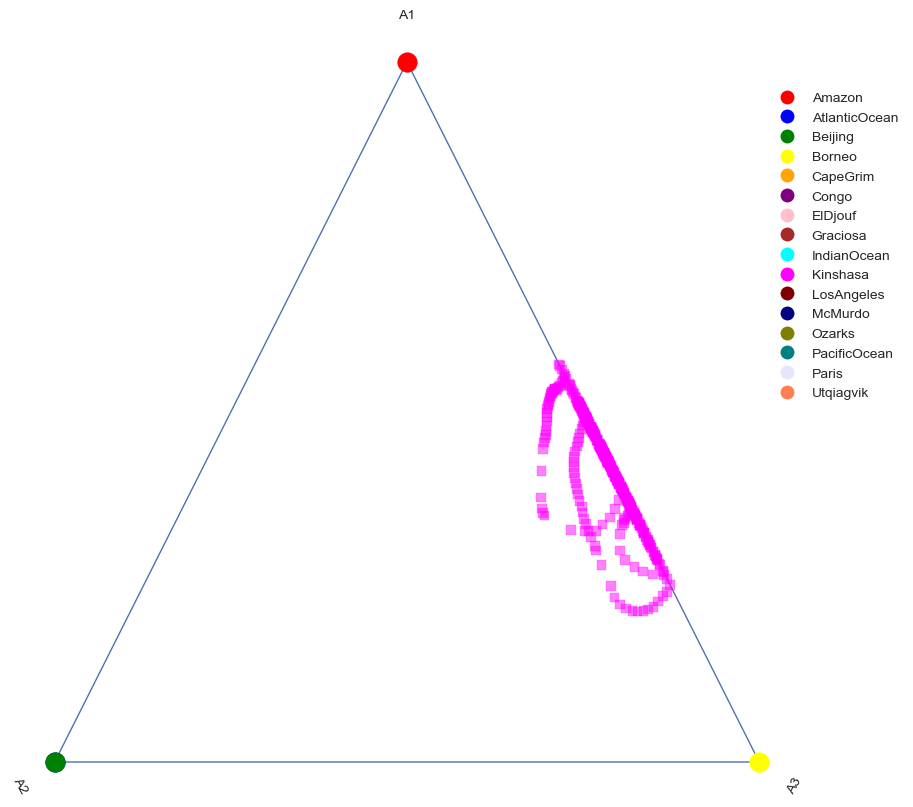

[[ 6.12323400e-17  1.00000000e+00]
 [-8.66025404e-01 -5.00000000e-01]
 [ 8.66025404e-01 -5.00000000e-01]]


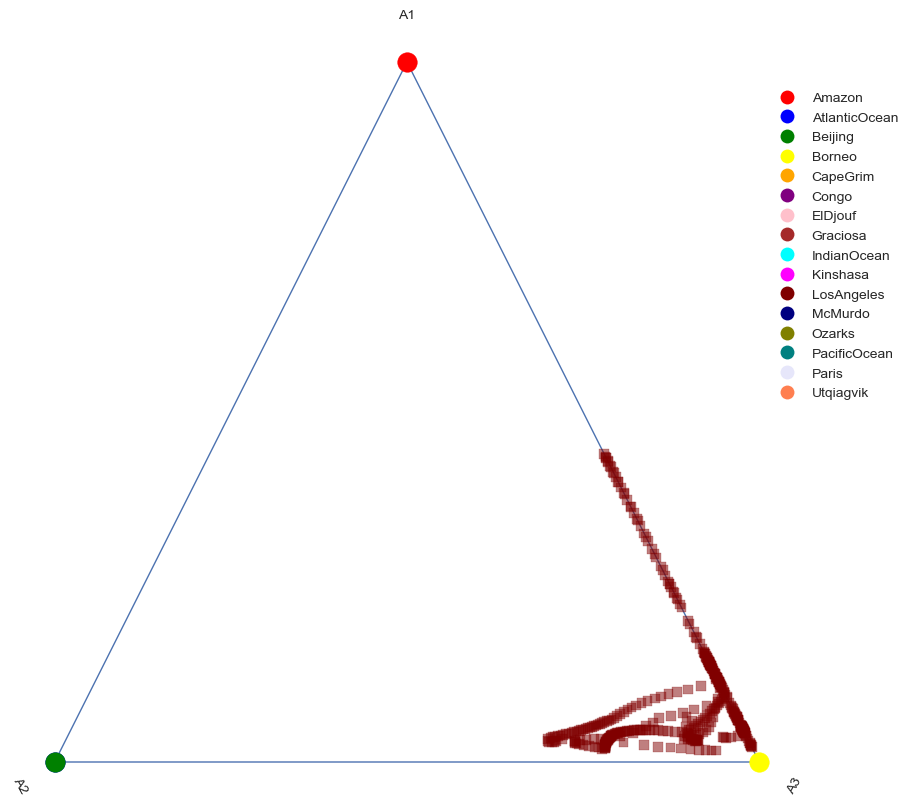

[[ 6.12323400e-17  1.00000000e+00]
 [-8.66025404e-01 -5.00000000e-01]
 [ 8.66025404e-01 -5.00000000e-01]]


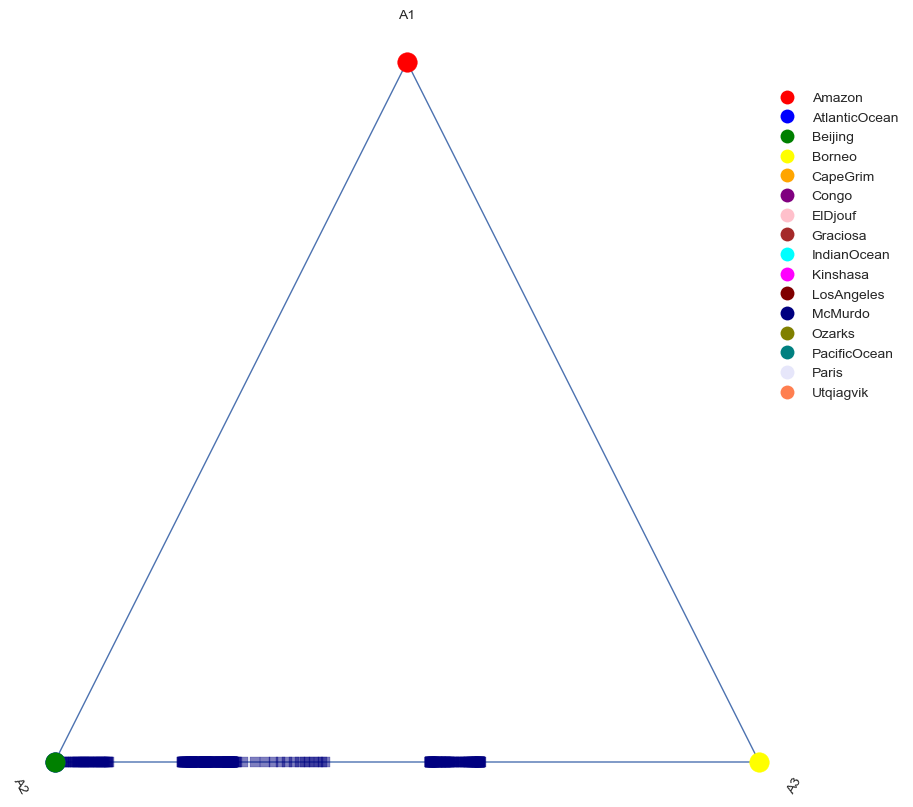

[[ 6.12323400e-17  1.00000000e+00]
 [-8.66025404e-01 -5.00000000e-01]
 [ 8.66025404e-01 -5.00000000e-01]]


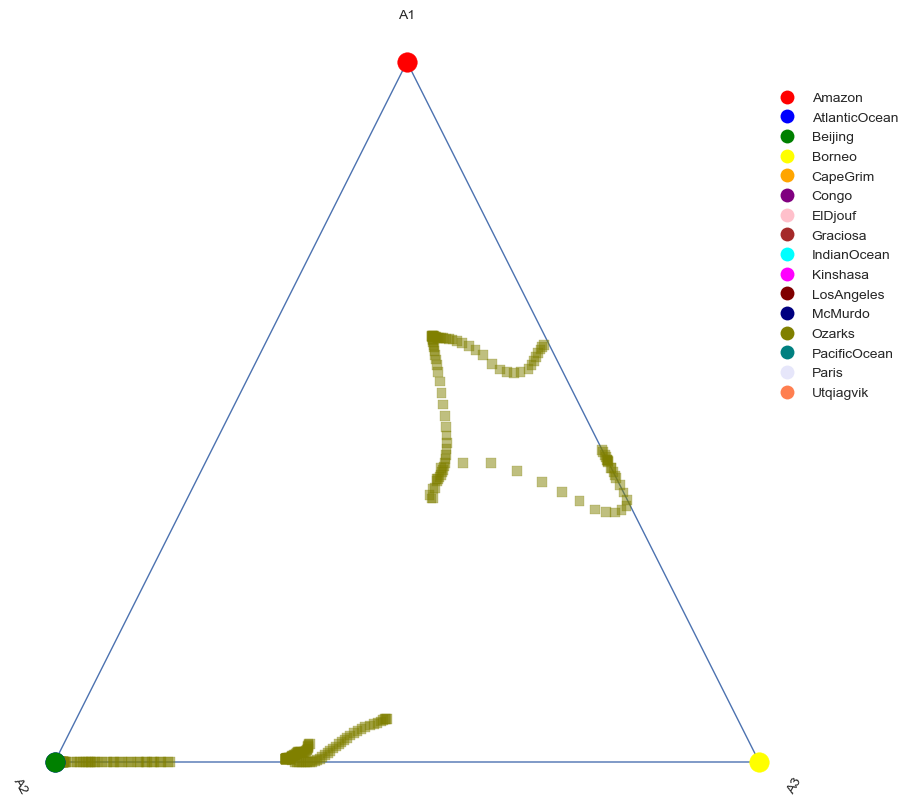

[[ 6.12323400e-17  1.00000000e+00]
 [-8.66025404e-01 -5.00000000e-01]
 [ 8.66025404e-01 -5.00000000e-01]]


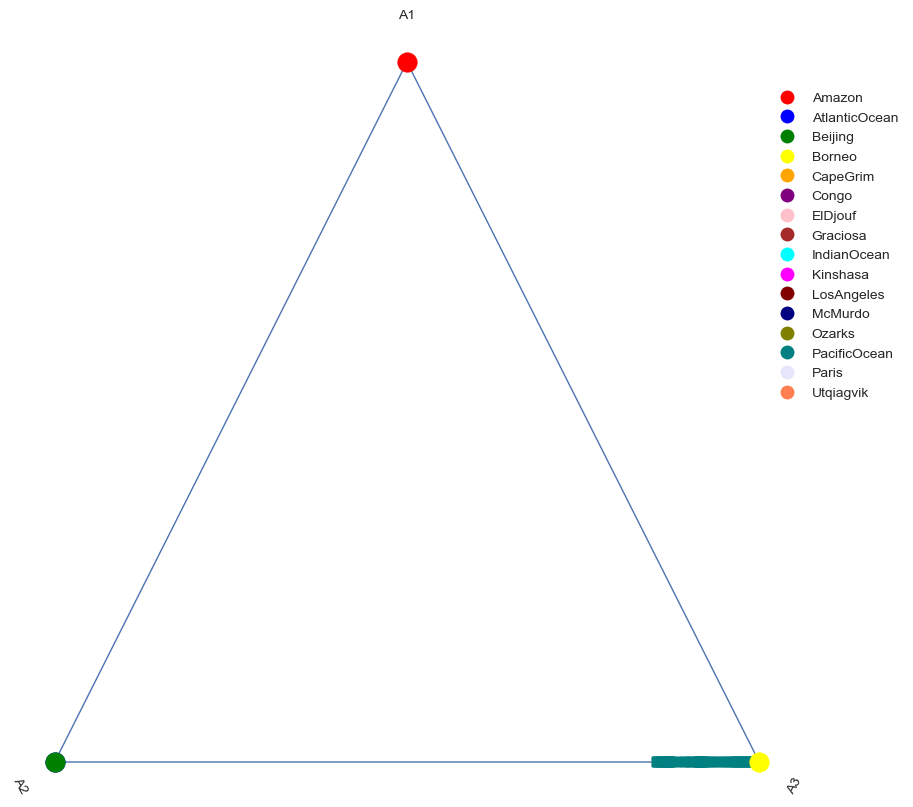

[[ 6.12323400e-17  1.00000000e+00]
 [-8.66025404e-01 -5.00000000e-01]
 [ 8.66025404e-01 -5.00000000e-01]]


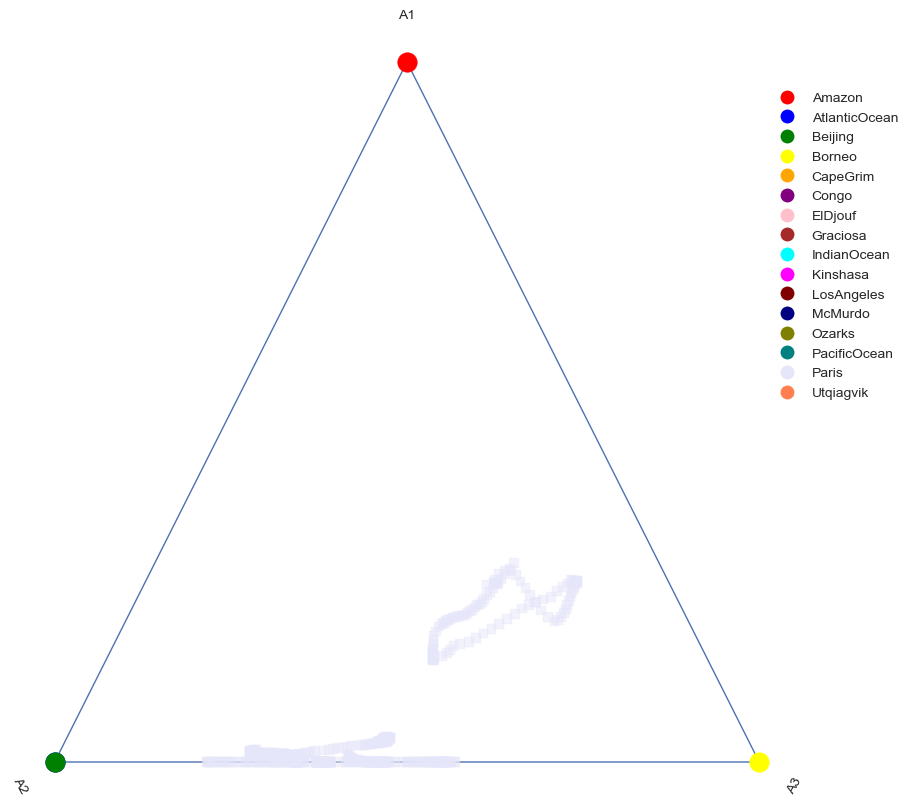

[[ 6.12323400e-17  1.00000000e+00]
 [-8.66025404e-01 -5.00000000e-01]
 [ 8.66025404e-01 -5.00000000e-01]]


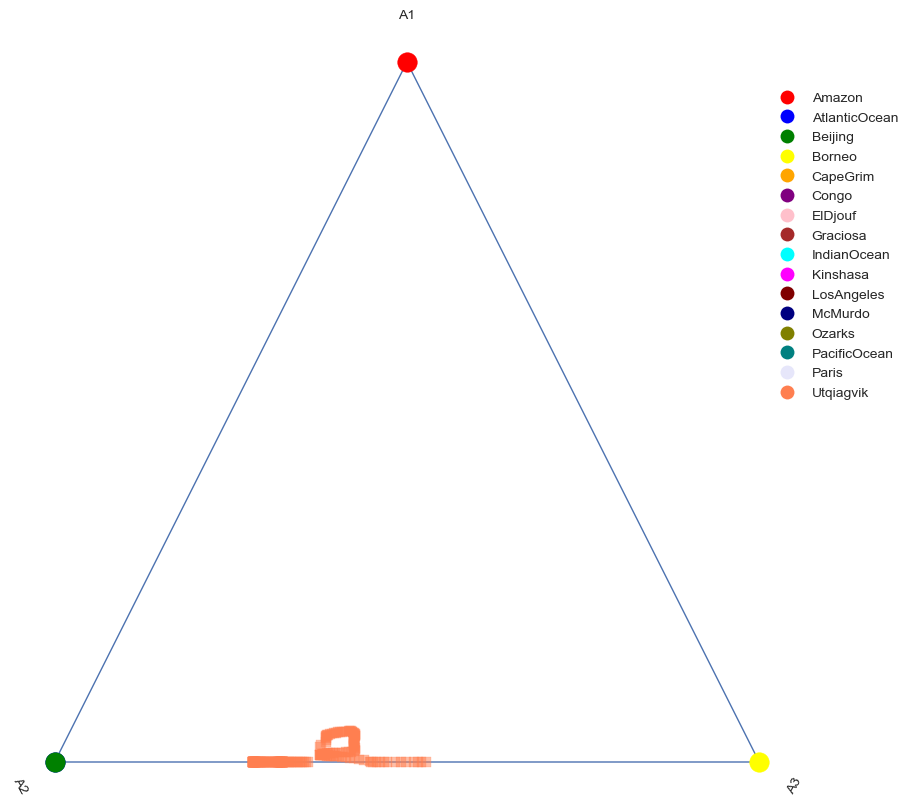

------------------
[[ 6.1232340e-17  1.0000000e+00]
 [-1.0000000e+00  1.2246468e-16]
 [-1.8369702e-16 -1.0000000e+00]
 [ 1.0000000e+00 -2.4492936e-16]]


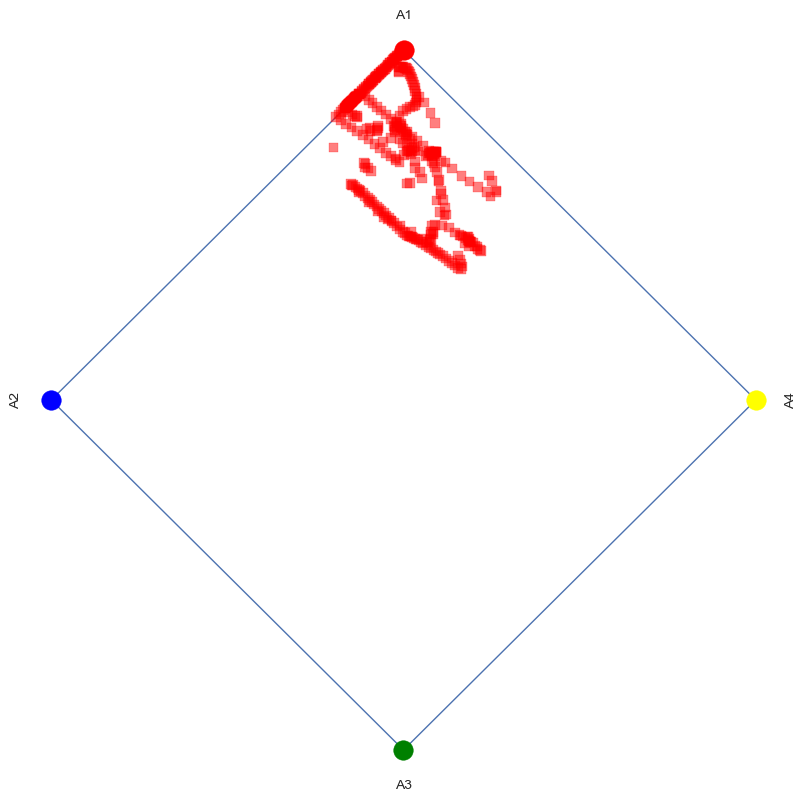

[[ 6.1232340e-17  1.0000000e+00]
 [-1.0000000e+00  1.2246468e-16]
 [-1.8369702e-16 -1.0000000e+00]
 [ 1.0000000e+00 -2.4492936e-16]]


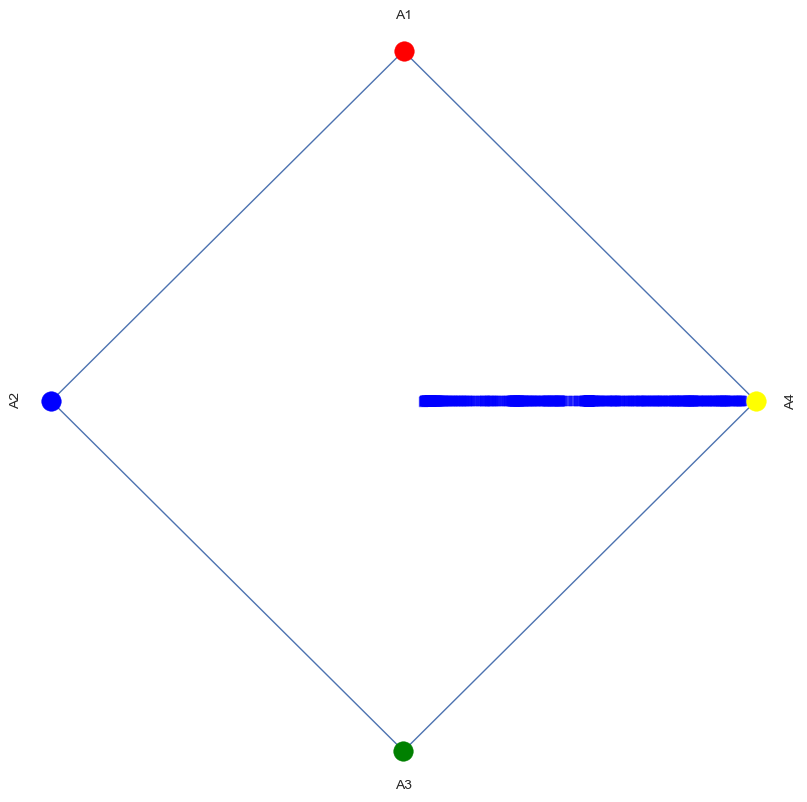

[[ 6.1232340e-17  1.0000000e+00]
 [-1.0000000e+00  1.2246468e-16]
 [-1.8369702e-16 -1.0000000e+00]
 [ 1.0000000e+00 -2.4492936e-16]]


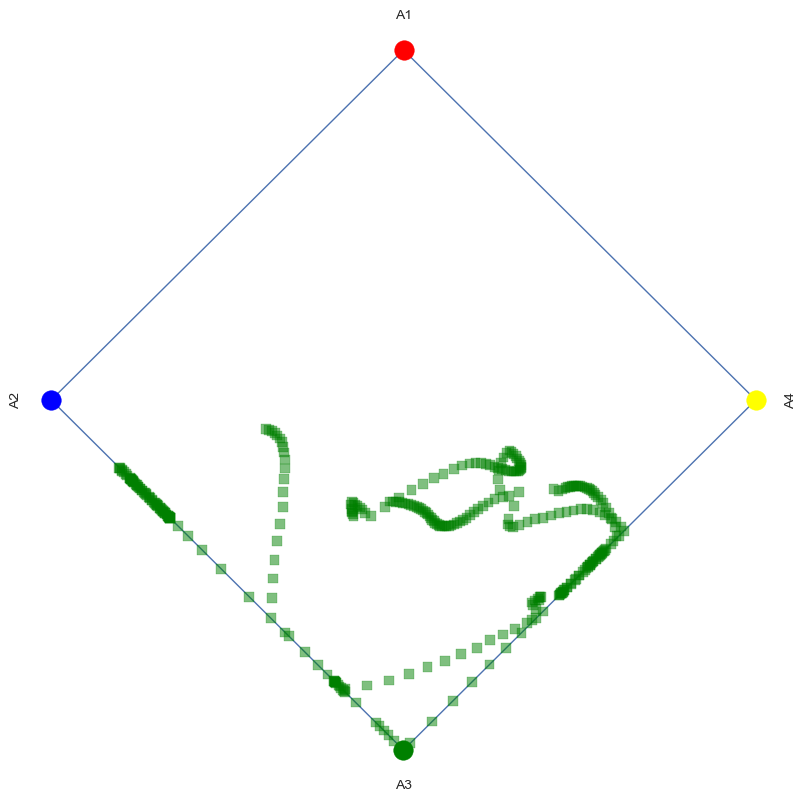

[[ 6.1232340e-17  1.0000000e+00]
 [-1.0000000e+00  1.2246468e-16]
 [-1.8369702e-16 -1.0000000e+00]
 [ 1.0000000e+00 -2.4492936e-16]]


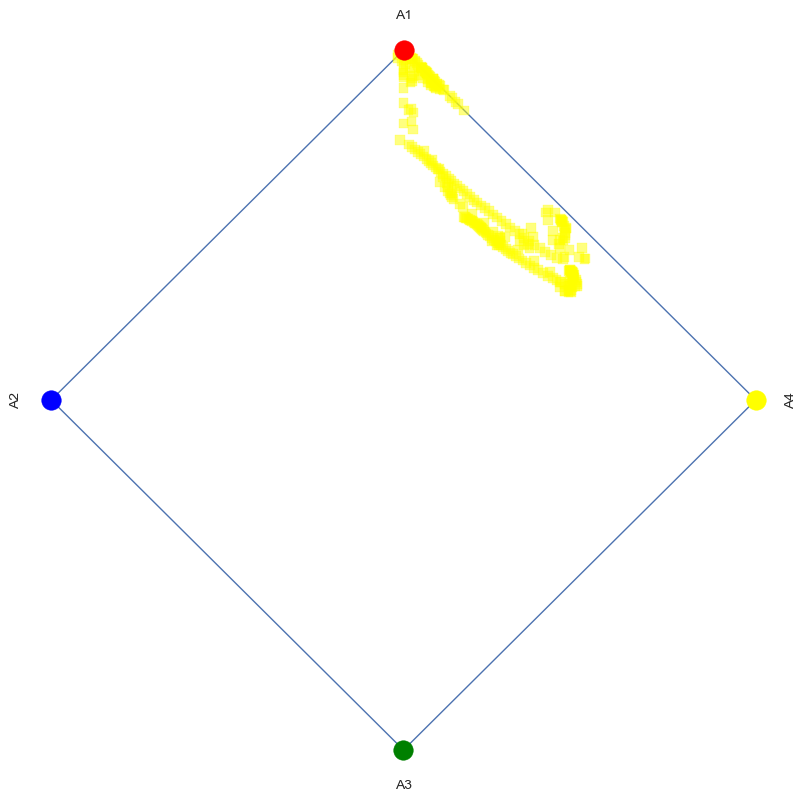

[[ 6.1232340e-17  1.0000000e+00]
 [-1.0000000e+00  1.2246468e-16]
 [-1.8369702e-16 -1.0000000e+00]
 [ 1.0000000e+00 -2.4492936e-16]]


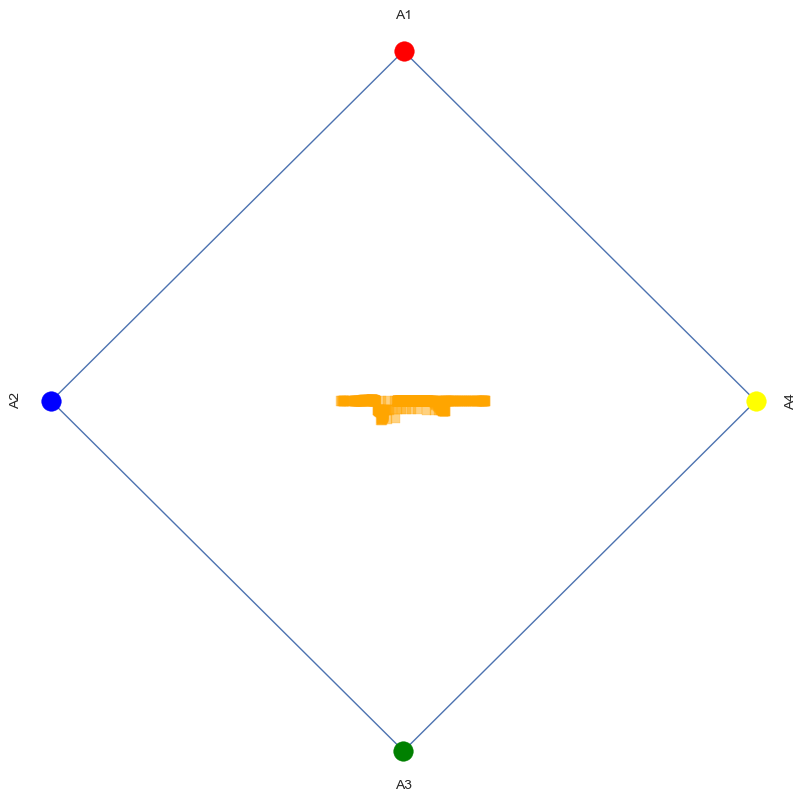

[[ 6.1232340e-17  1.0000000e+00]
 [-1.0000000e+00  1.2246468e-16]
 [-1.8369702e-16 -1.0000000e+00]
 [ 1.0000000e+00 -2.4492936e-16]]


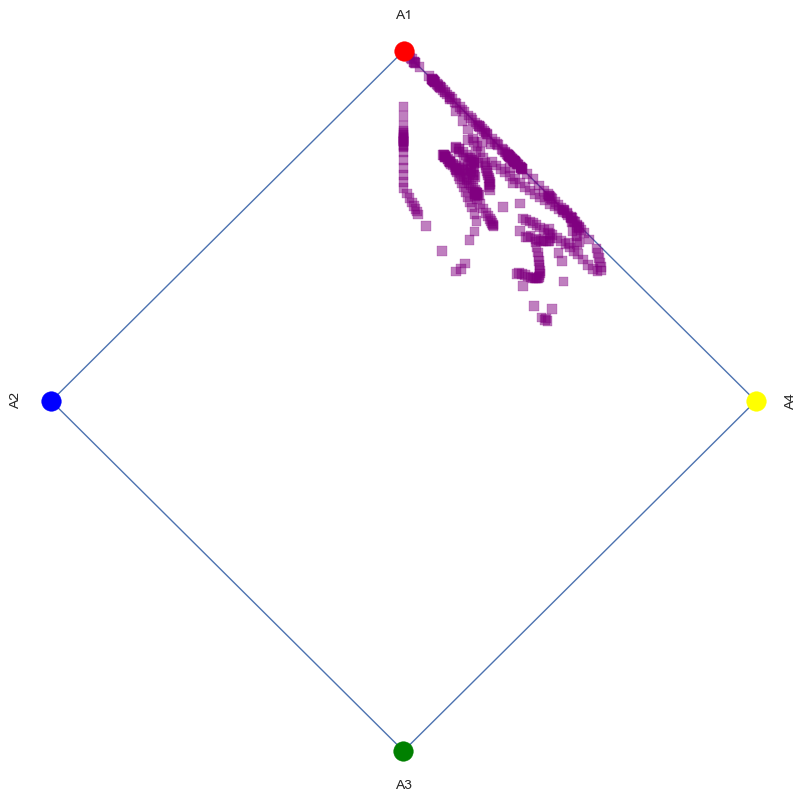

[[ 6.1232340e-17  1.0000000e+00]
 [-1.0000000e+00  1.2246468e-16]
 [-1.8369702e-16 -1.0000000e+00]
 [ 1.0000000e+00 -2.4492936e-16]]


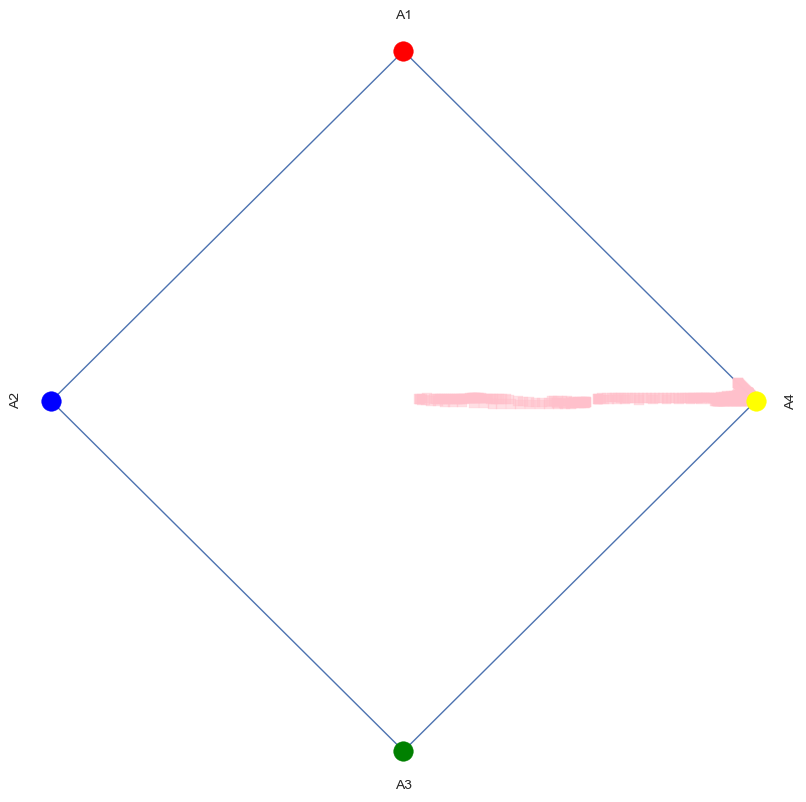

[[ 6.1232340e-17  1.0000000e+00]
 [-1.0000000e+00  1.2246468e-16]
 [-1.8369702e-16 -1.0000000e+00]
 [ 1.0000000e+00 -2.4492936e-16]]


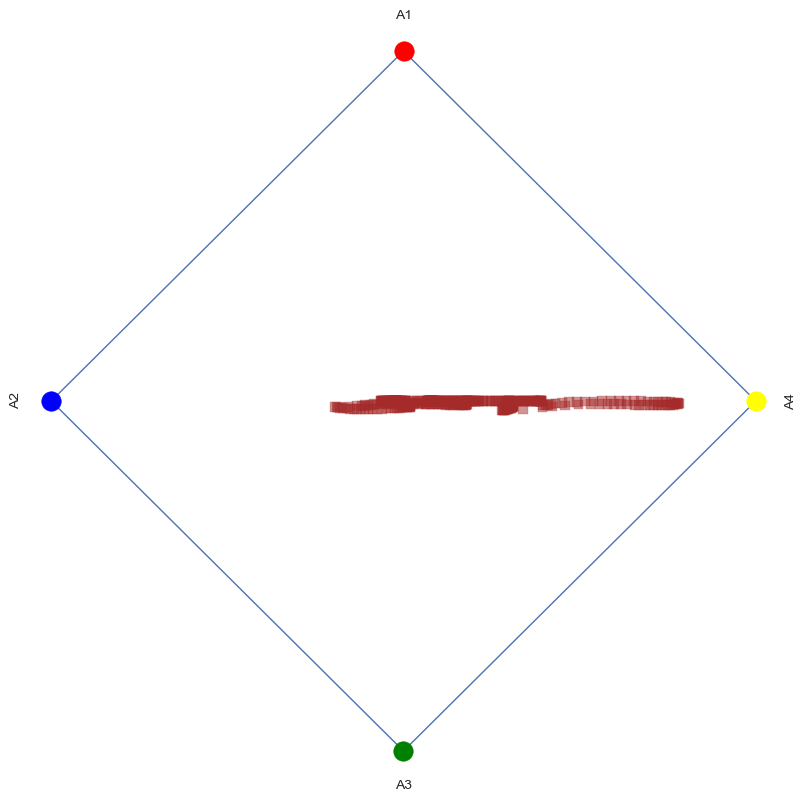

[[ 6.1232340e-17  1.0000000e+00]
 [-1.0000000e+00  1.2246468e-16]
 [-1.8369702e-16 -1.0000000e+00]
 [ 1.0000000e+00 -2.4492936e-16]]


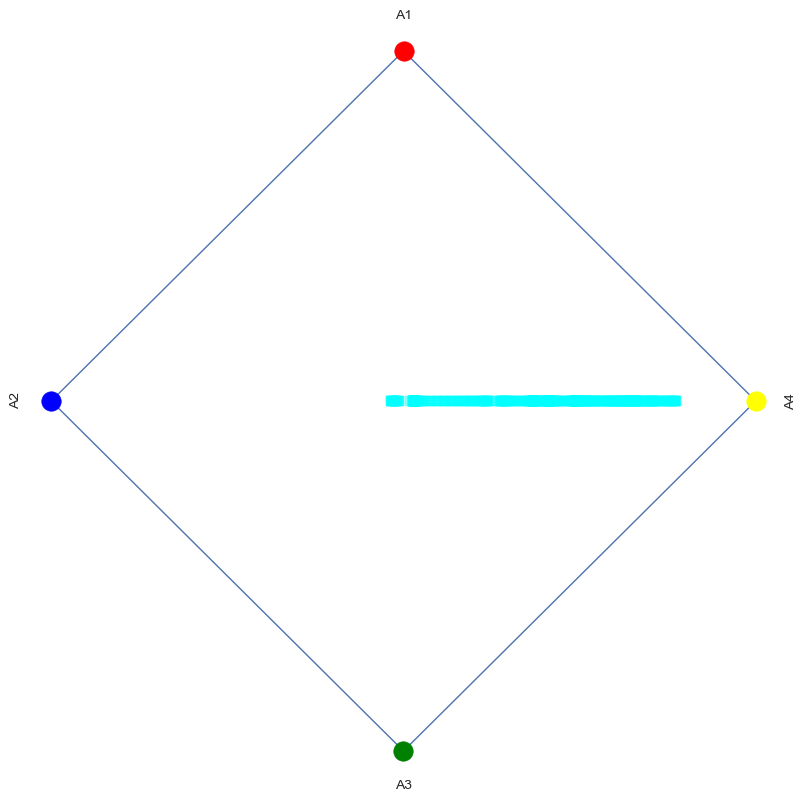

[[ 6.1232340e-17  1.0000000e+00]
 [-1.0000000e+00  1.2246468e-16]
 [-1.8369702e-16 -1.0000000e+00]
 [ 1.0000000e+00 -2.4492936e-16]]


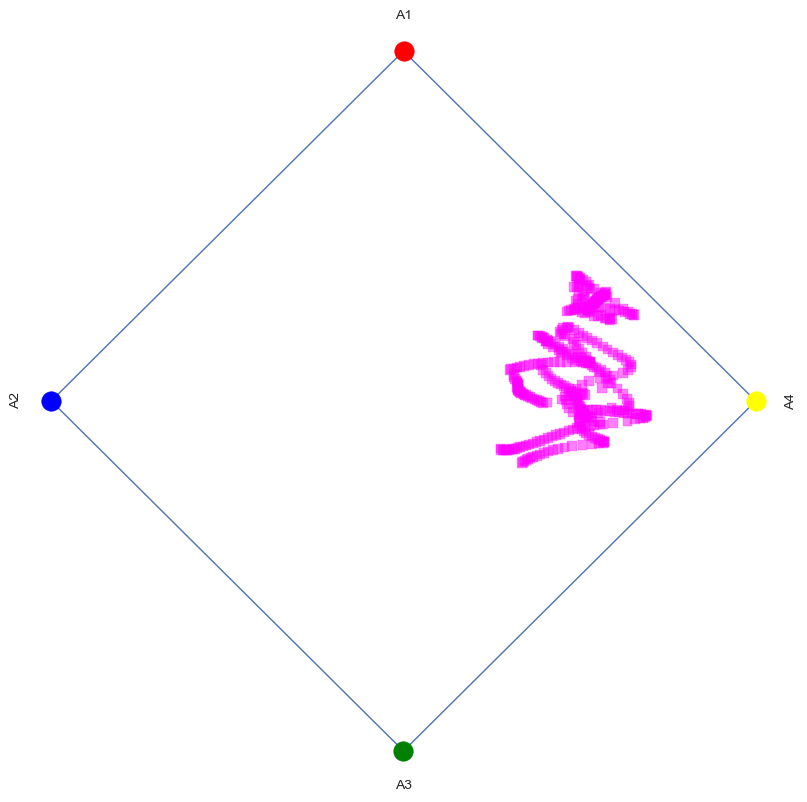

[[ 6.1232340e-17  1.0000000e+00]
 [-1.0000000e+00  1.2246468e-16]
 [-1.8369702e-16 -1.0000000e+00]
 [ 1.0000000e+00 -2.4492936e-16]]


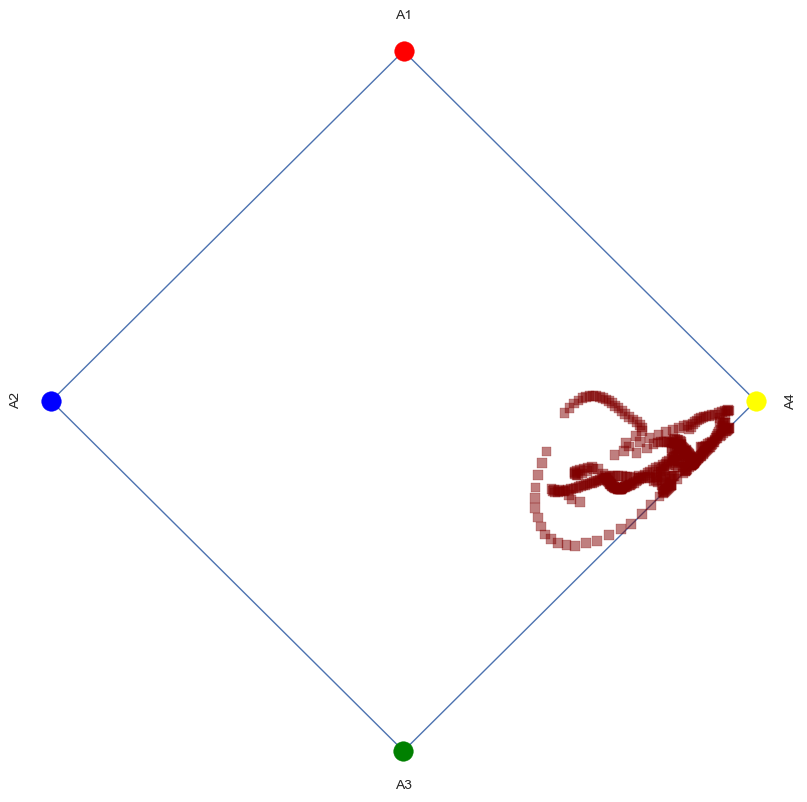

[[ 6.1232340e-17  1.0000000e+00]
 [-1.0000000e+00  1.2246468e-16]
 [-1.8369702e-16 -1.0000000e+00]
 [ 1.0000000e+00 -2.4492936e-16]]


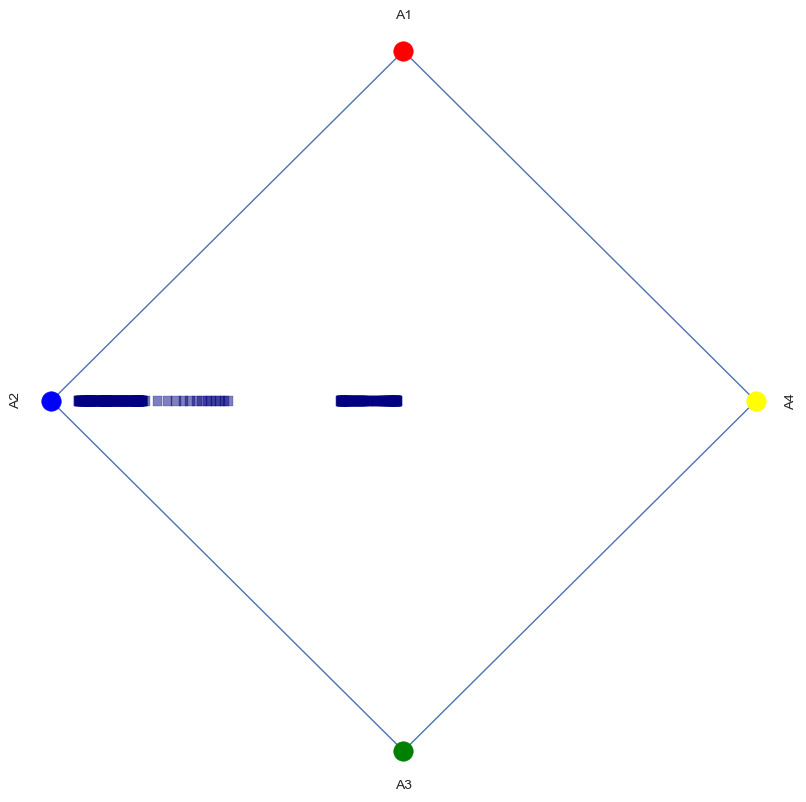

[[ 6.1232340e-17  1.0000000e+00]
 [-1.0000000e+00  1.2246468e-16]
 [-1.8369702e-16 -1.0000000e+00]
 [ 1.0000000e+00 -2.4492936e-16]]


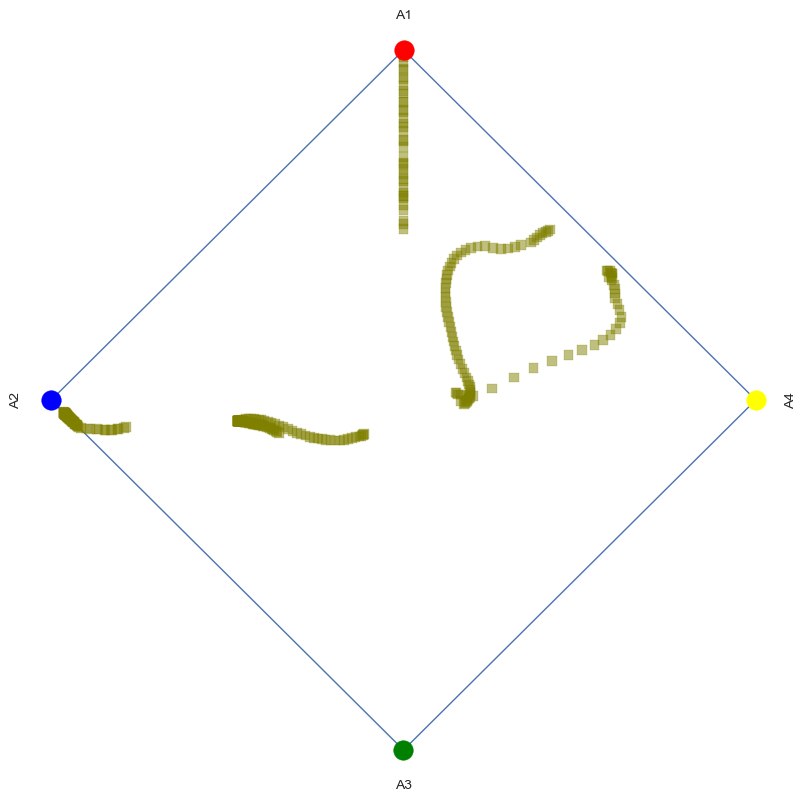

[[ 6.1232340e-17  1.0000000e+00]
 [-1.0000000e+00  1.2246468e-16]
 [-1.8369702e-16 -1.0000000e+00]
 [ 1.0000000e+00 -2.4492936e-16]]


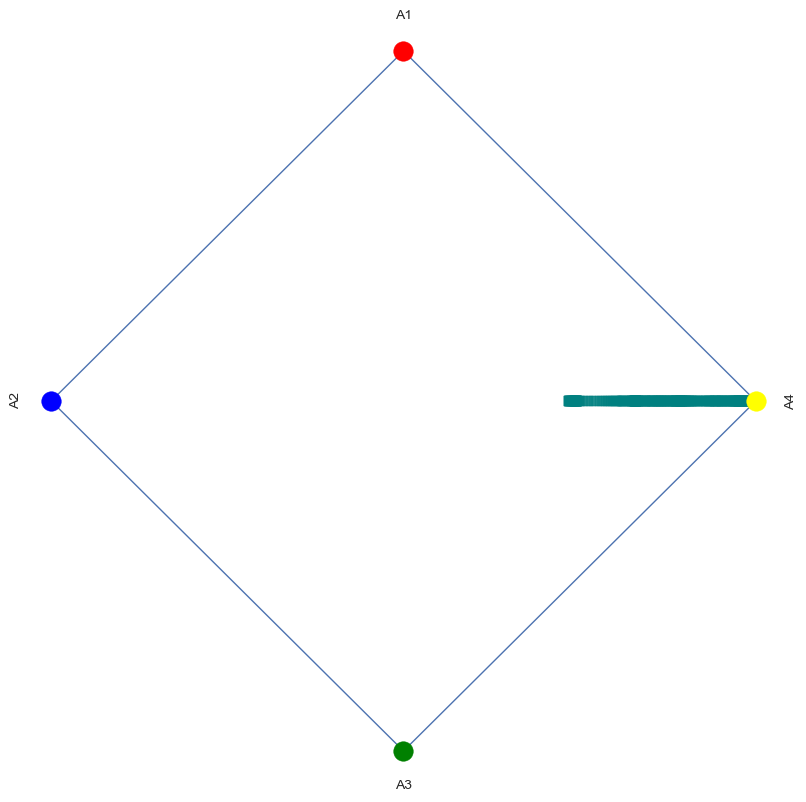

[[ 6.1232340e-17  1.0000000e+00]
 [-1.0000000e+00  1.2246468e-16]
 [-1.8369702e-16 -1.0000000e+00]
 [ 1.0000000e+00 -2.4492936e-16]]


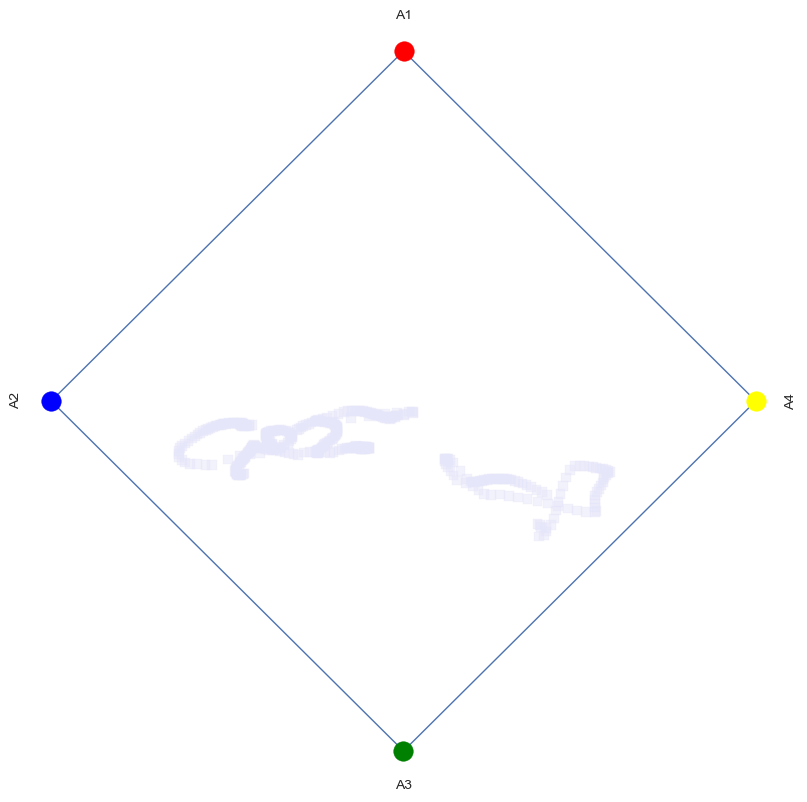

[[ 6.1232340e-17  1.0000000e+00]
 [-1.0000000e+00  1.2246468e-16]
 [-1.8369702e-16 -1.0000000e+00]
 [ 1.0000000e+00 -2.4492936e-16]]


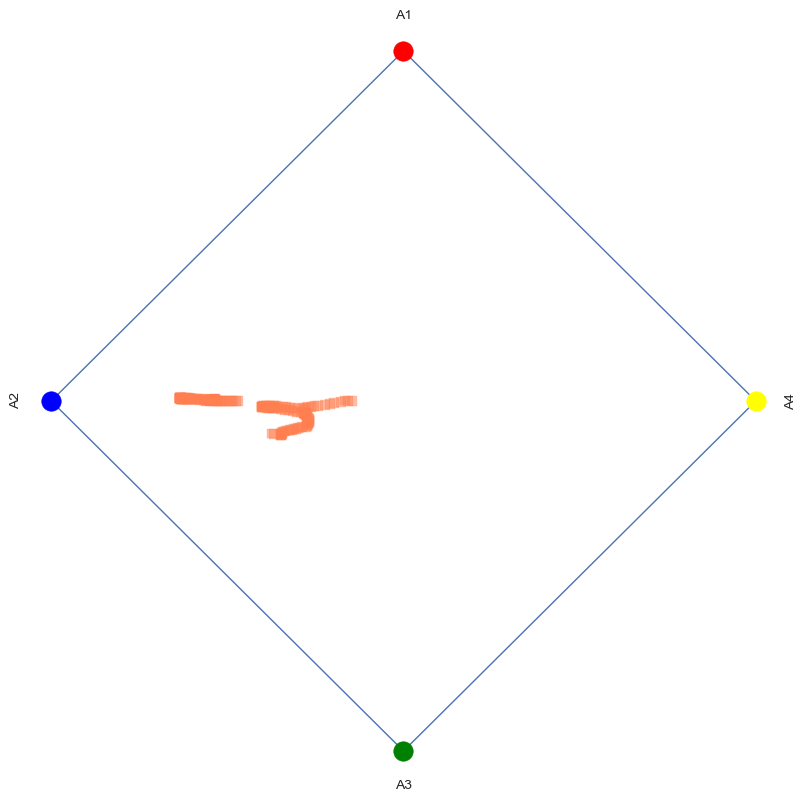

------------------
[[ 6.12323400e-17  1.00000000e+00]
 [-9.51056516e-01  3.09016994e-01]
 [-5.87785252e-01 -8.09016994e-01]
 [ 5.87785252e-01 -8.09016994e-01]
 [ 9.51056516e-01  3.09016994e-01]]


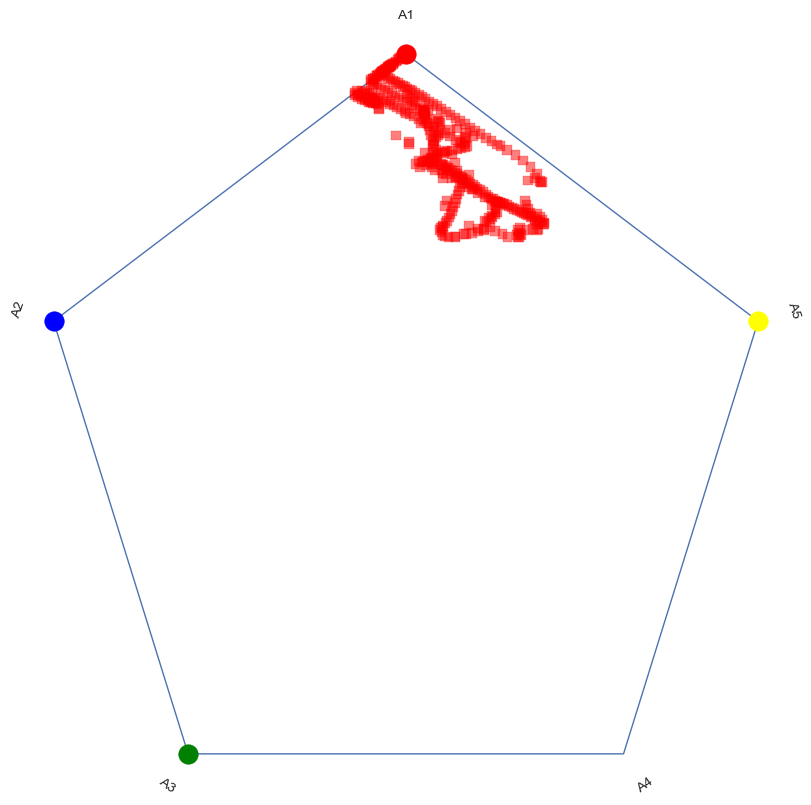

[[ 6.12323400e-17  1.00000000e+00]
 [-9.51056516e-01  3.09016994e-01]
 [-5.87785252e-01 -8.09016994e-01]
 [ 5.87785252e-01 -8.09016994e-01]
 [ 9.51056516e-01  3.09016994e-01]]


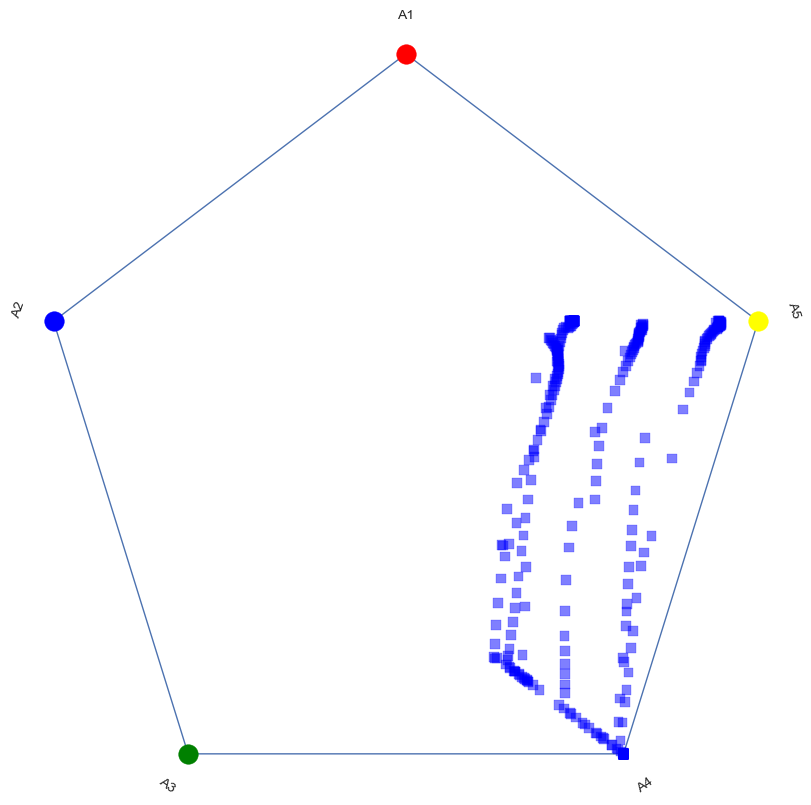

[[ 6.12323400e-17  1.00000000e+00]
 [-9.51056516e-01  3.09016994e-01]
 [-5.87785252e-01 -8.09016994e-01]
 [ 5.87785252e-01 -8.09016994e-01]
 [ 9.51056516e-01  3.09016994e-01]]


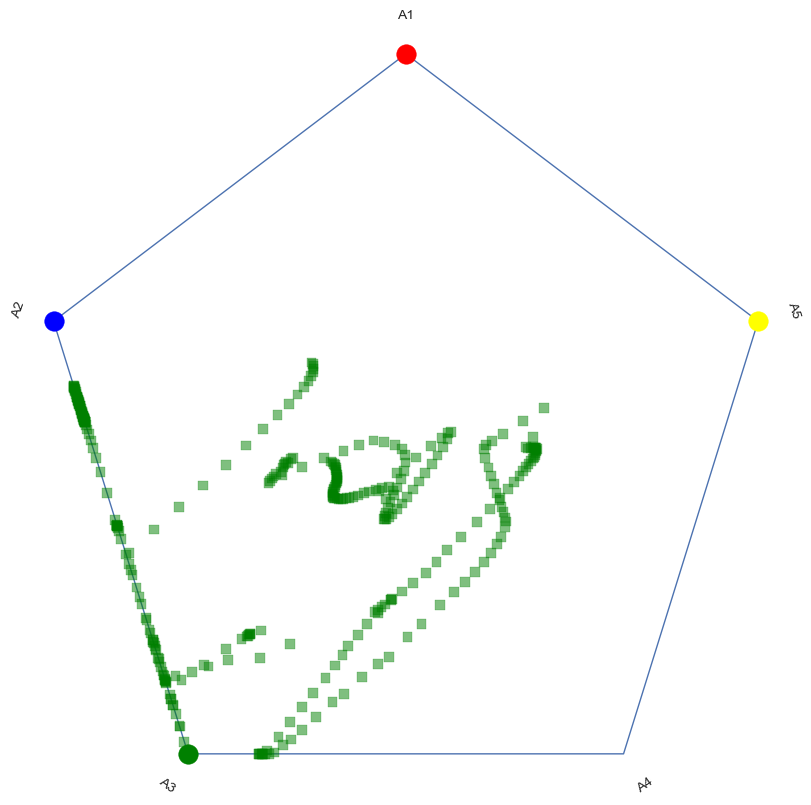

[[ 6.12323400e-17  1.00000000e+00]
 [-9.51056516e-01  3.09016994e-01]
 [-5.87785252e-01 -8.09016994e-01]
 [ 5.87785252e-01 -8.09016994e-01]
 [ 9.51056516e-01  3.09016994e-01]]


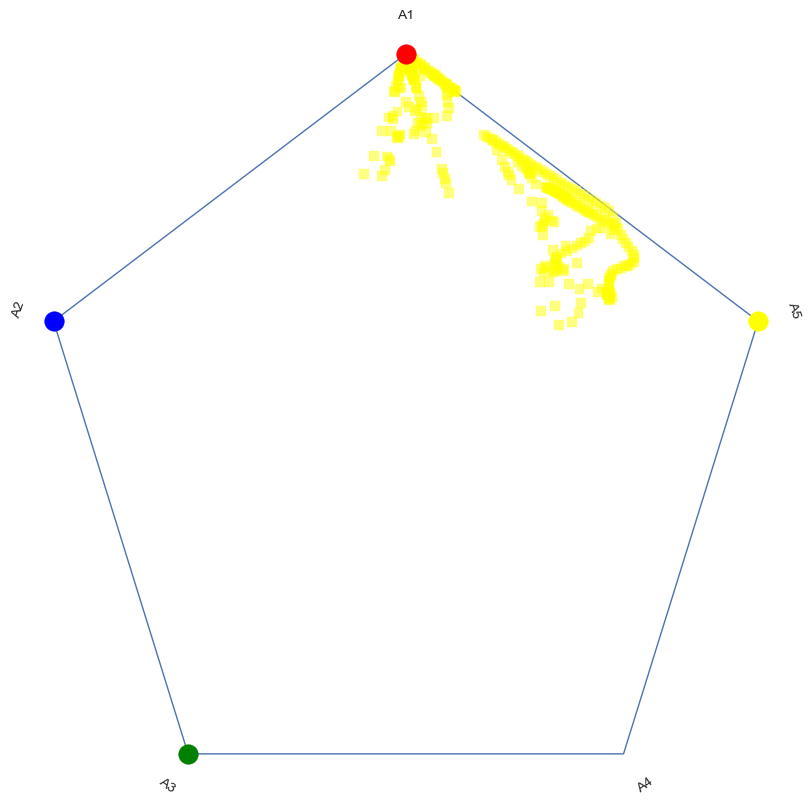

[[ 6.12323400e-17  1.00000000e+00]
 [-9.51056516e-01  3.09016994e-01]
 [-5.87785252e-01 -8.09016994e-01]
 [ 5.87785252e-01 -8.09016994e-01]
 [ 9.51056516e-01  3.09016994e-01]]


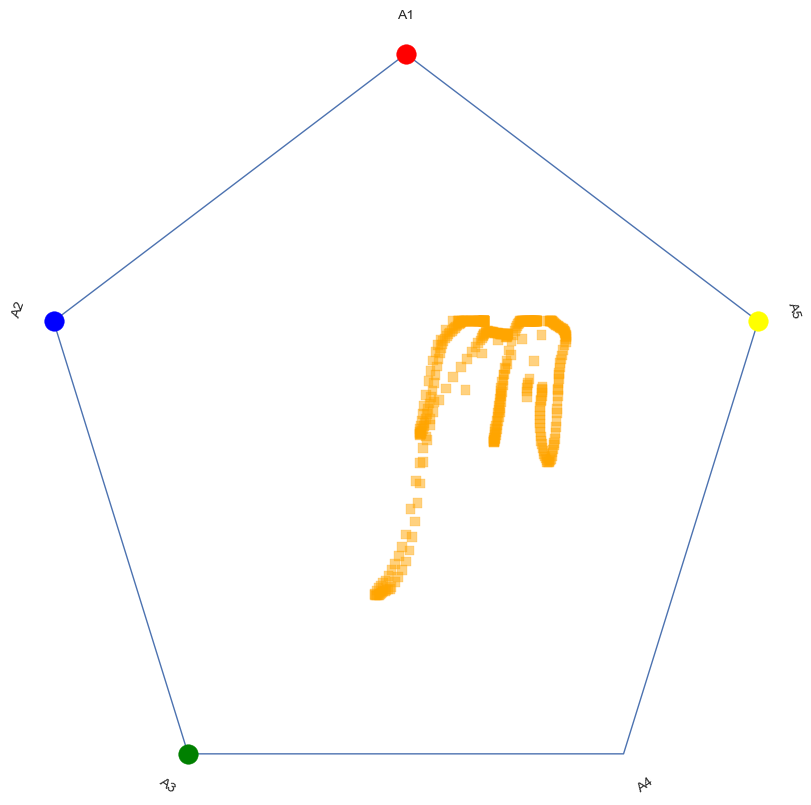

[[ 6.12323400e-17  1.00000000e+00]
 [-9.51056516e-01  3.09016994e-01]
 [-5.87785252e-01 -8.09016994e-01]
 [ 5.87785252e-01 -8.09016994e-01]
 [ 9.51056516e-01  3.09016994e-01]]


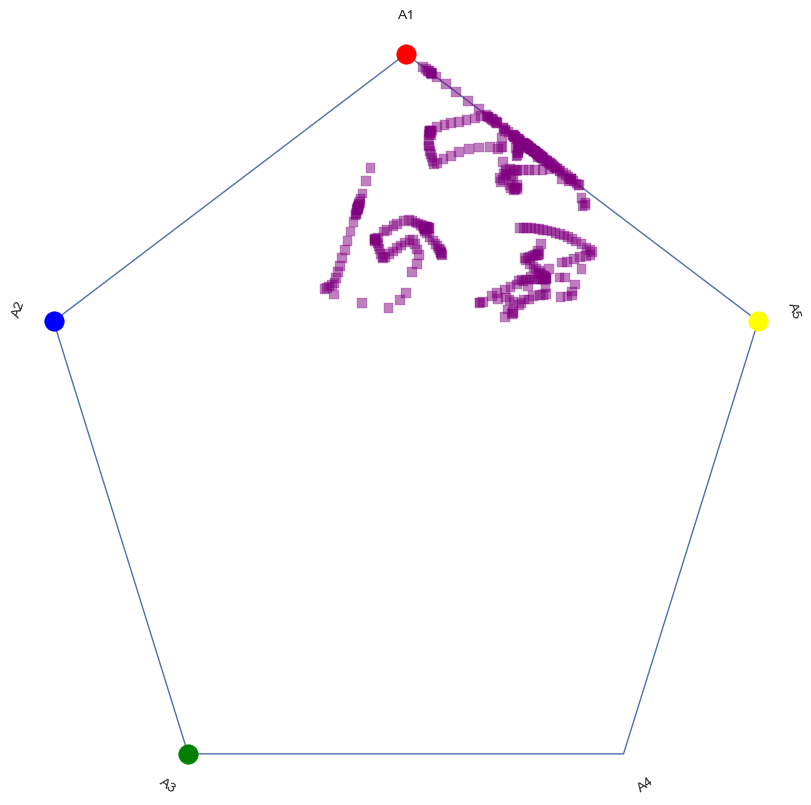

[[ 6.12323400e-17  1.00000000e+00]
 [-9.51056516e-01  3.09016994e-01]
 [-5.87785252e-01 -8.09016994e-01]
 [ 5.87785252e-01 -8.09016994e-01]
 [ 9.51056516e-01  3.09016994e-01]]


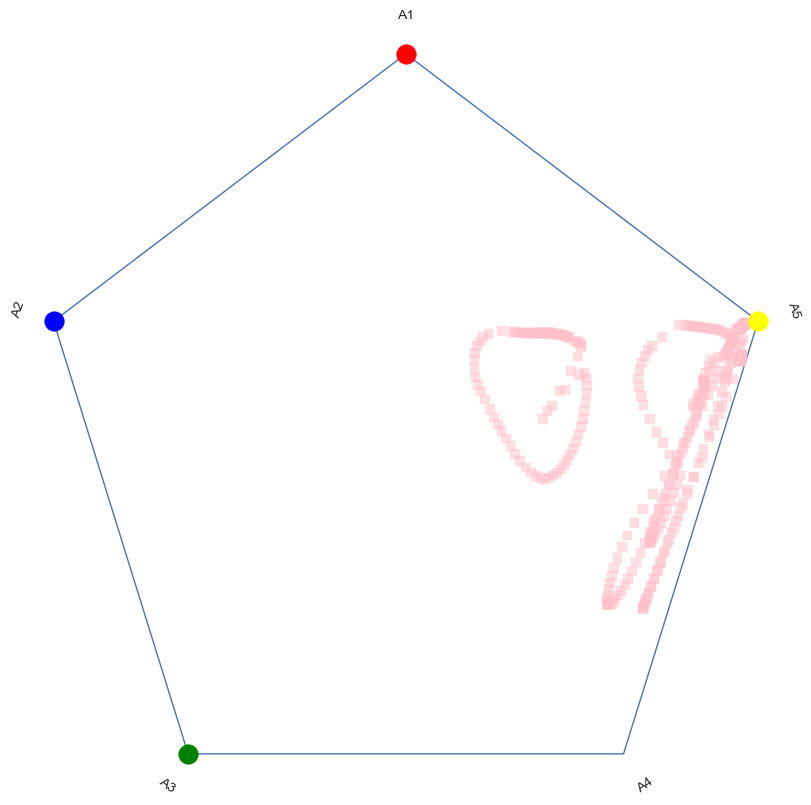

[[ 6.12323400e-17  1.00000000e+00]
 [-9.51056516e-01  3.09016994e-01]
 [-5.87785252e-01 -8.09016994e-01]
 [ 5.87785252e-01 -8.09016994e-01]
 [ 9.51056516e-01  3.09016994e-01]]


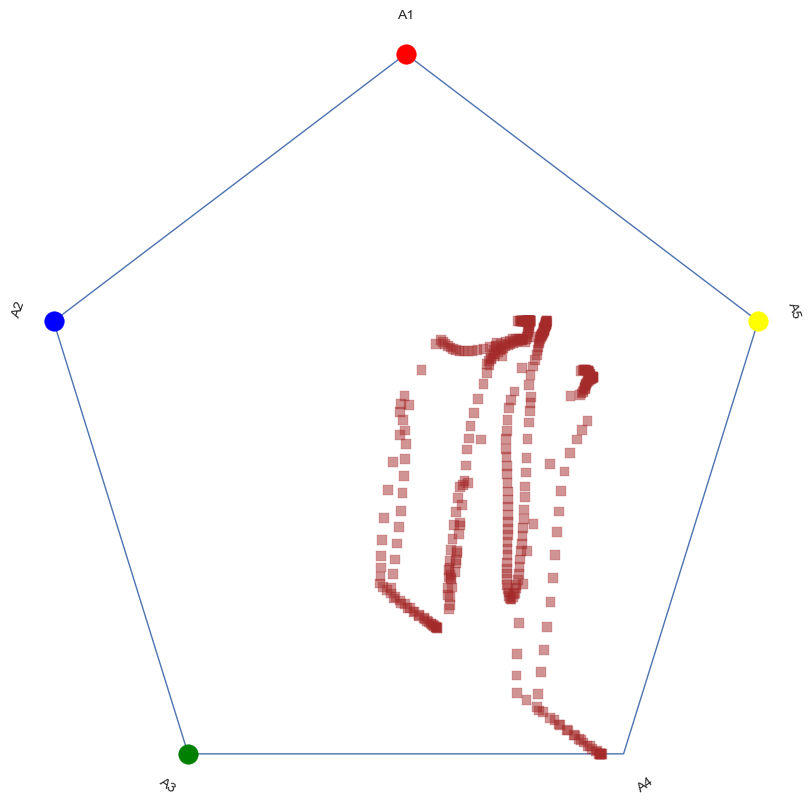

[[ 6.12323400e-17  1.00000000e+00]
 [-9.51056516e-01  3.09016994e-01]
 [-5.87785252e-01 -8.09016994e-01]
 [ 5.87785252e-01 -8.09016994e-01]
 [ 9.51056516e-01  3.09016994e-01]]


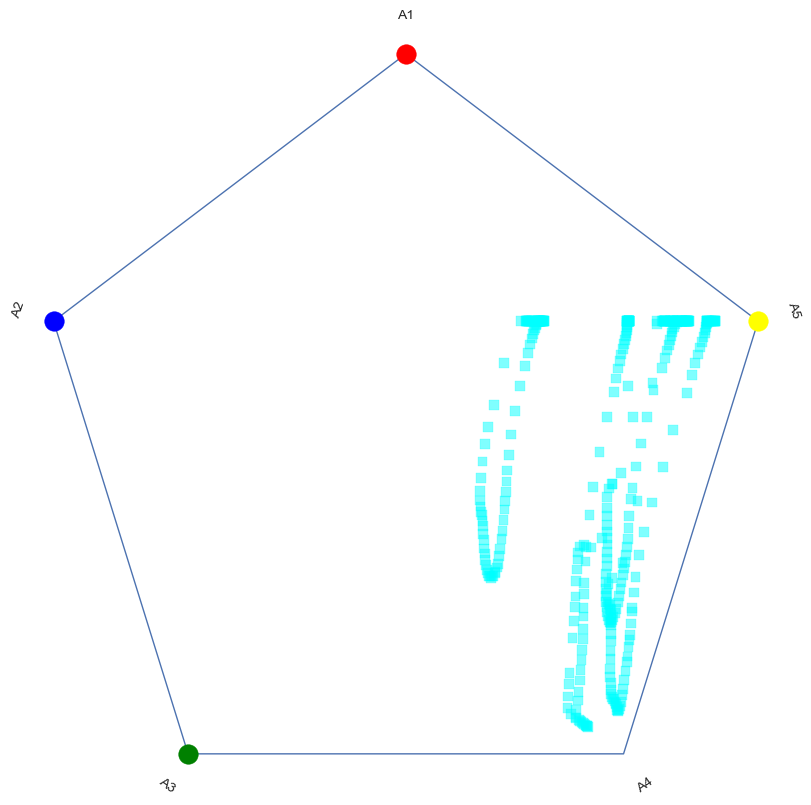

[[ 6.12323400e-17  1.00000000e+00]
 [-9.51056516e-01  3.09016994e-01]
 [-5.87785252e-01 -8.09016994e-01]
 [ 5.87785252e-01 -8.09016994e-01]
 [ 9.51056516e-01  3.09016994e-01]]


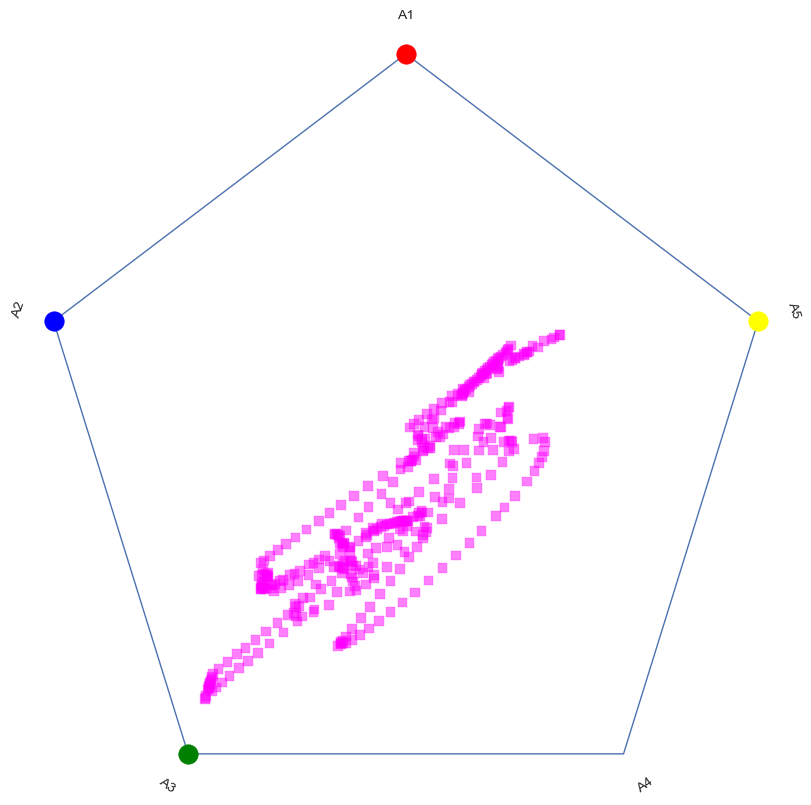

[[ 6.12323400e-17  1.00000000e+00]
 [-9.51056516e-01  3.09016994e-01]
 [-5.87785252e-01 -8.09016994e-01]
 [ 5.87785252e-01 -8.09016994e-01]
 [ 9.51056516e-01  3.09016994e-01]]


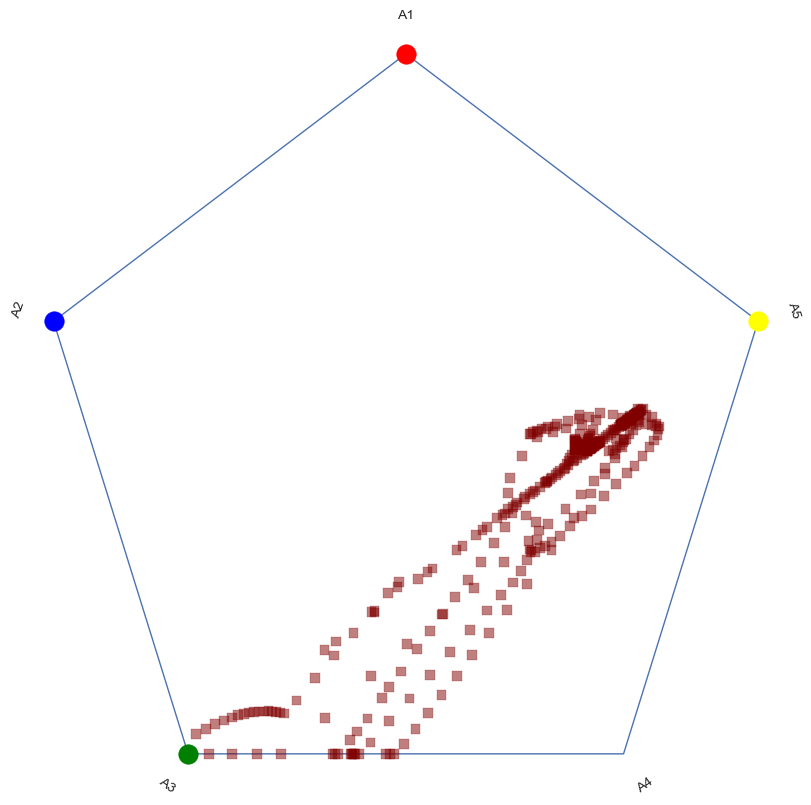

[[ 6.12323400e-17  1.00000000e+00]
 [-9.51056516e-01  3.09016994e-01]
 [-5.87785252e-01 -8.09016994e-01]
 [ 5.87785252e-01 -8.09016994e-01]
 [ 9.51056516e-01  3.09016994e-01]]


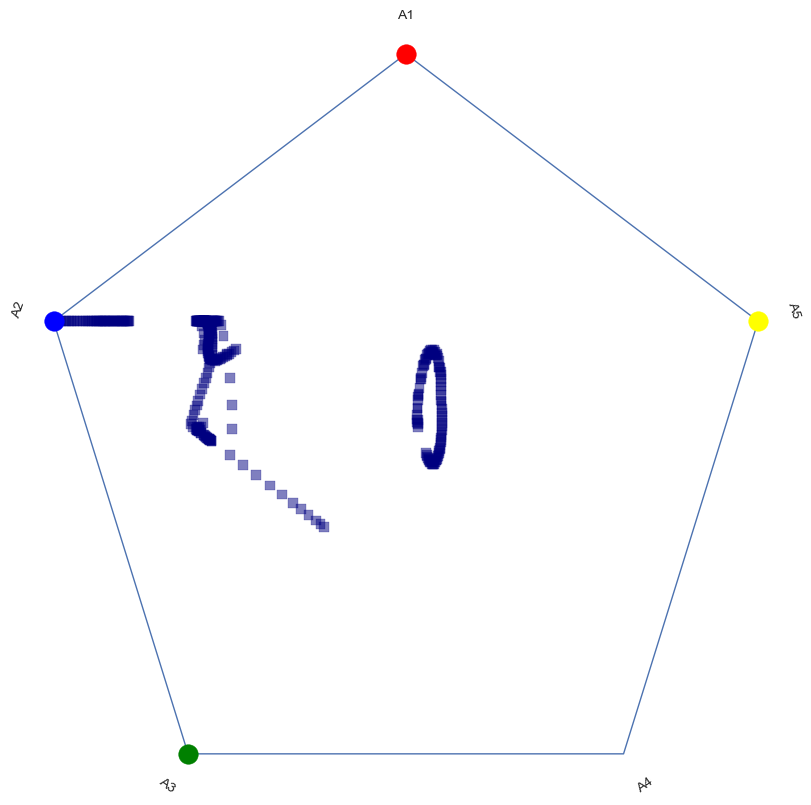

[[ 6.12323400e-17  1.00000000e+00]
 [-9.51056516e-01  3.09016994e-01]
 [-5.87785252e-01 -8.09016994e-01]
 [ 5.87785252e-01 -8.09016994e-01]
 [ 9.51056516e-01  3.09016994e-01]]


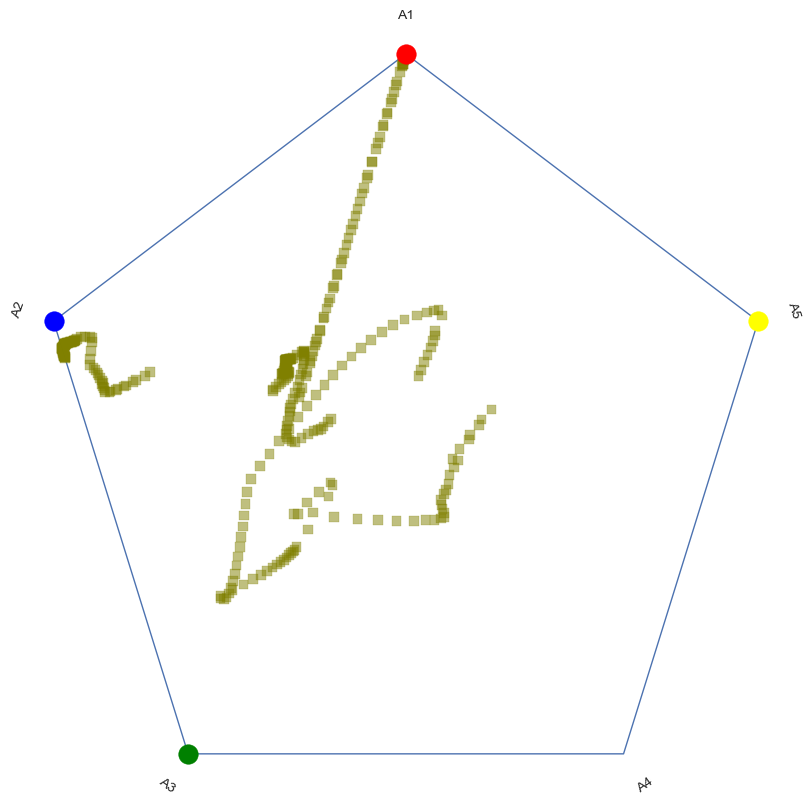

[[ 6.12323400e-17  1.00000000e+00]
 [-9.51056516e-01  3.09016994e-01]
 [-5.87785252e-01 -8.09016994e-01]
 [ 5.87785252e-01 -8.09016994e-01]
 [ 9.51056516e-01  3.09016994e-01]]


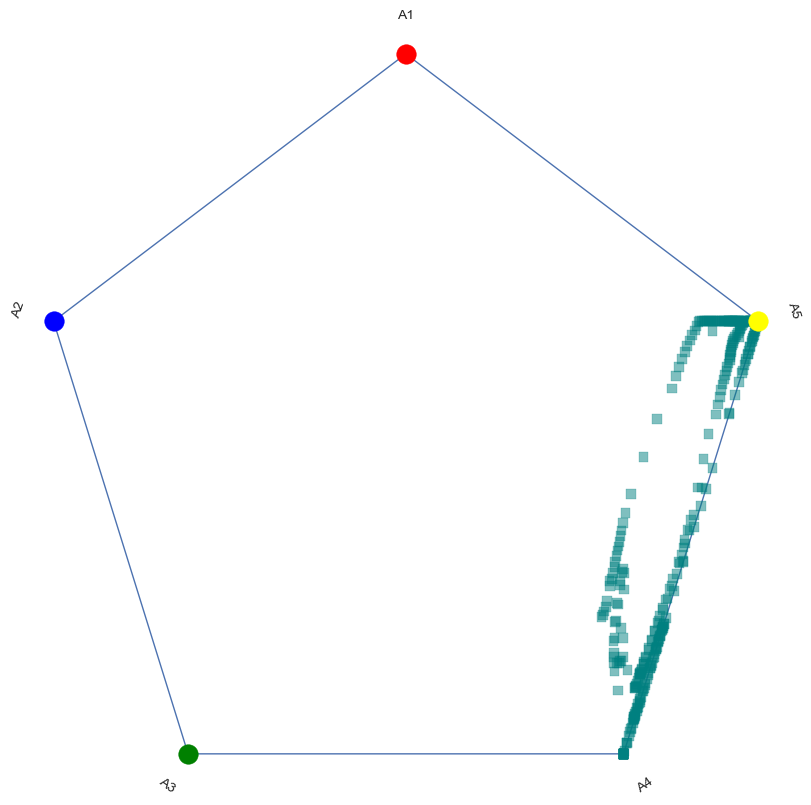

[[ 6.12323400e-17  1.00000000e+00]
 [-9.51056516e-01  3.09016994e-01]
 [-5.87785252e-01 -8.09016994e-01]
 [ 5.87785252e-01 -8.09016994e-01]
 [ 9.51056516e-01  3.09016994e-01]]


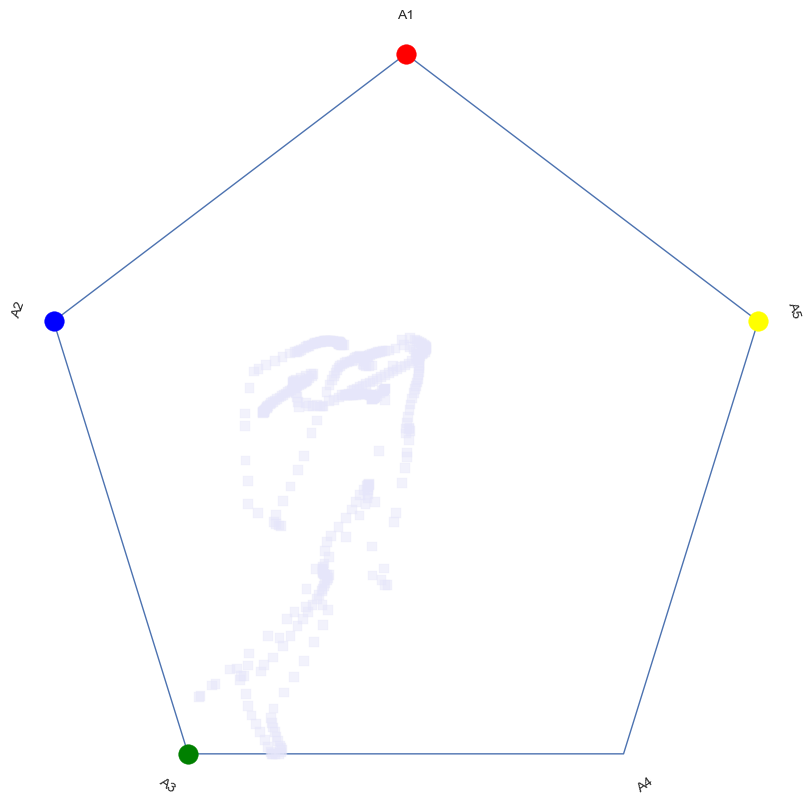

[[ 6.12323400e-17  1.00000000e+00]
 [-9.51056516e-01  3.09016994e-01]
 [-5.87785252e-01 -8.09016994e-01]
 [ 5.87785252e-01 -8.09016994e-01]
 [ 9.51056516e-01  3.09016994e-01]]


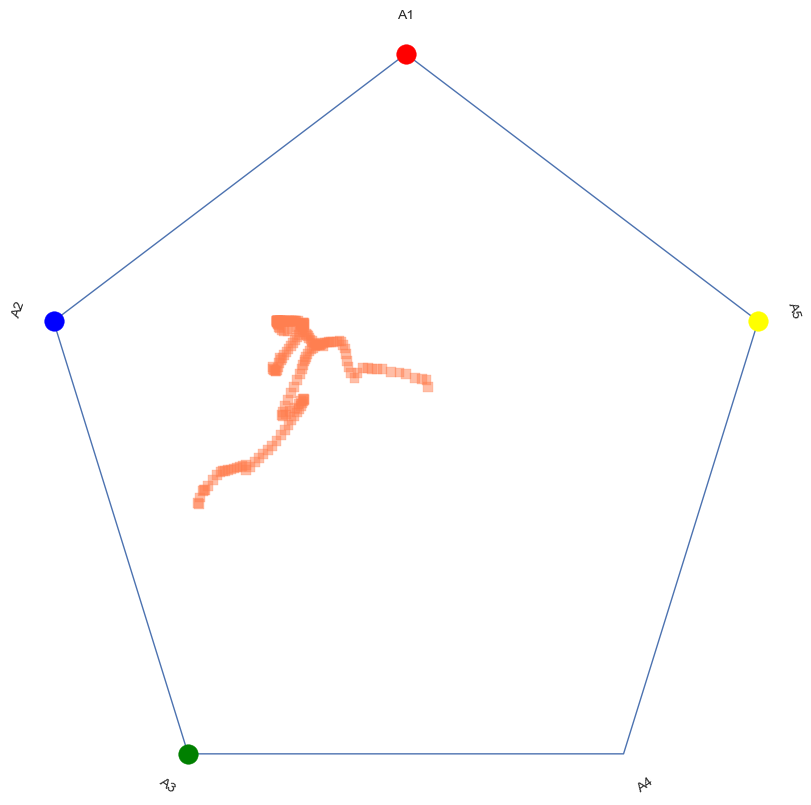

------------------
[[ 6.12323400e-17  1.00000000e+00]
 [-8.66025404e-01  5.00000000e-01]
 [-8.66025404e-01 -5.00000000e-01]
 [-1.83697020e-16 -1.00000000e+00]
 [ 8.66025404e-01 -5.00000000e-01]
 [ 8.66025404e-01  5.00000000e-01]]


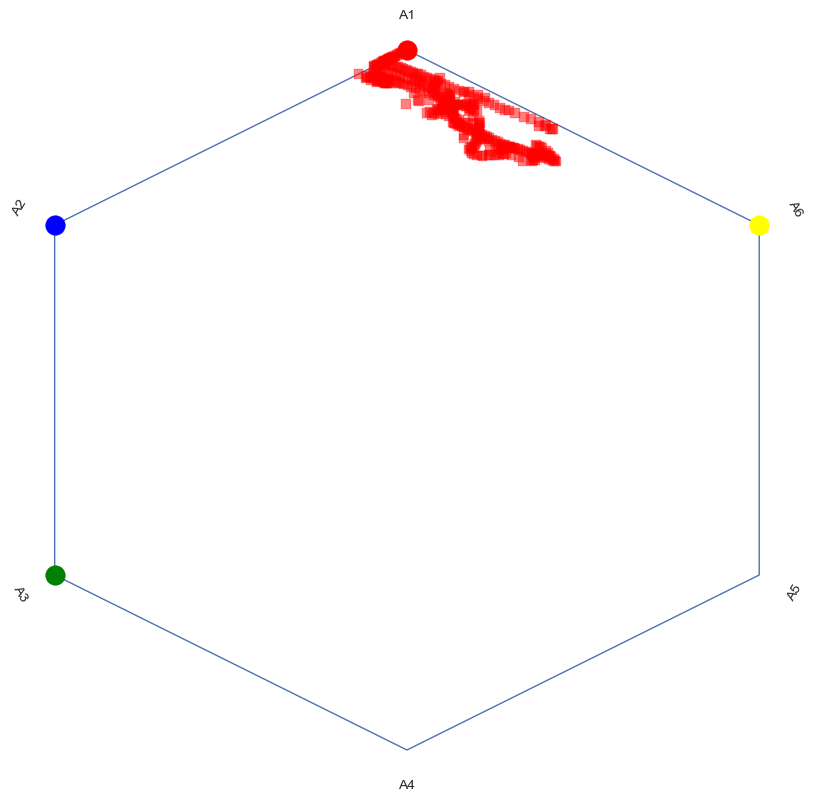

[[ 6.12323400e-17  1.00000000e+00]
 [-8.66025404e-01  5.00000000e-01]
 [-8.66025404e-01 -5.00000000e-01]
 [-1.83697020e-16 -1.00000000e+00]
 [ 8.66025404e-01 -5.00000000e-01]
 [ 8.66025404e-01  5.00000000e-01]]


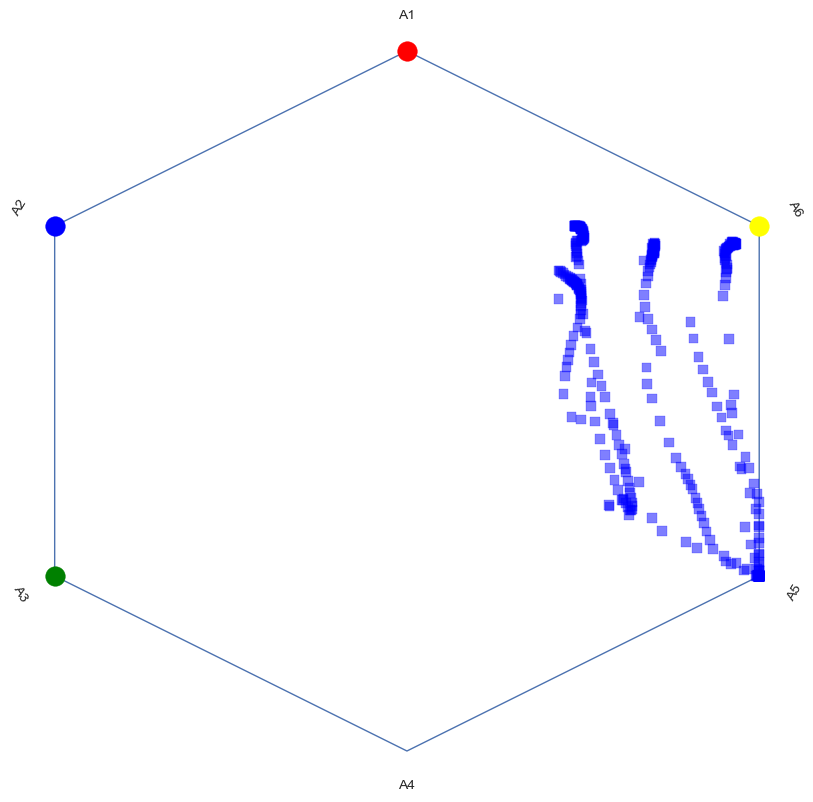

[[ 6.12323400e-17  1.00000000e+00]
 [-8.66025404e-01  5.00000000e-01]
 [-8.66025404e-01 -5.00000000e-01]
 [-1.83697020e-16 -1.00000000e+00]
 [ 8.66025404e-01 -5.00000000e-01]
 [ 8.66025404e-01  5.00000000e-01]]


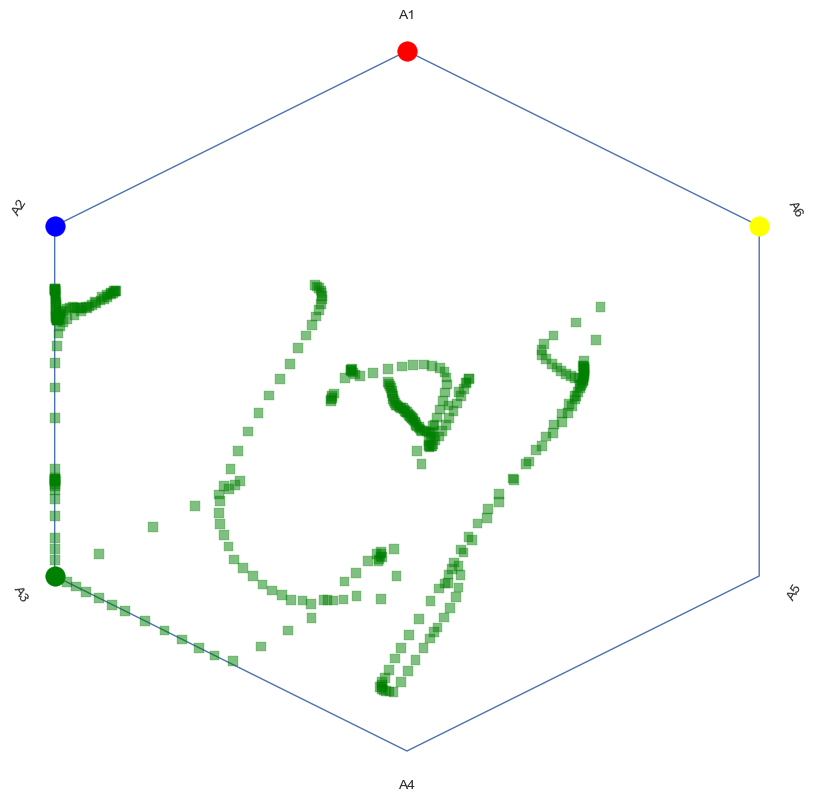

[[ 6.12323400e-17  1.00000000e+00]
 [-8.66025404e-01  5.00000000e-01]
 [-8.66025404e-01 -5.00000000e-01]
 [-1.83697020e-16 -1.00000000e+00]
 [ 8.66025404e-01 -5.00000000e-01]
 [ 8.66025404e-01  5.00000000e-01]]


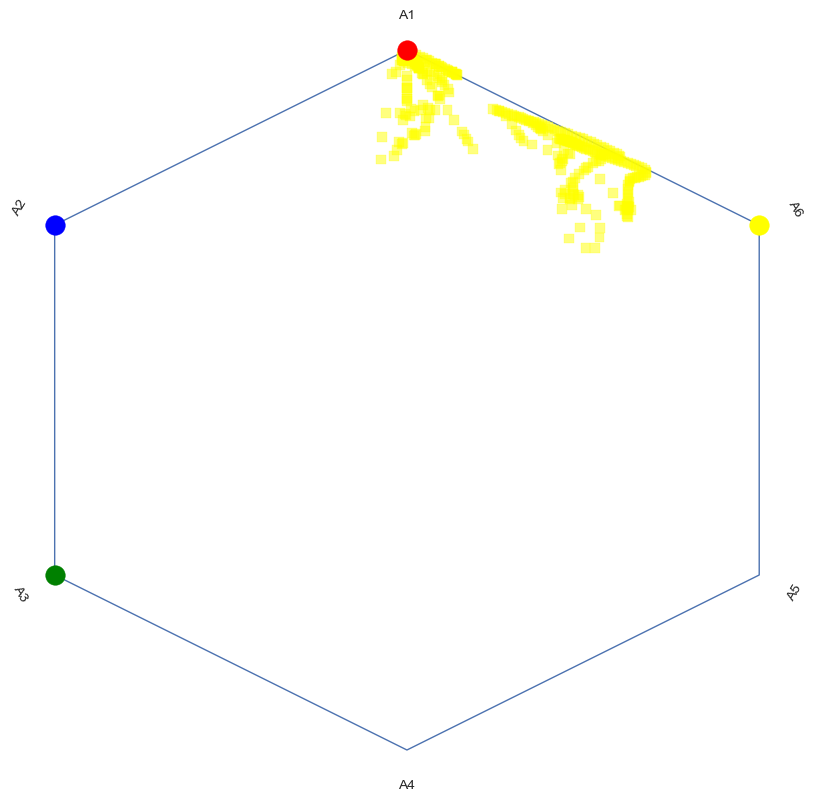

[[ 6.12323400e-17  1.00000000e+00]
 [-8.66025404e-01  5.00000000e-01]
 [-8.66025404e-01 -5.00000000e-01]
 [-1.83697020e-16 -1.00000000e+00]
 [ 8.66025404e-01 -5.00000000e-01]
 [ 8.66025404e-01  5.00000000e-01]]


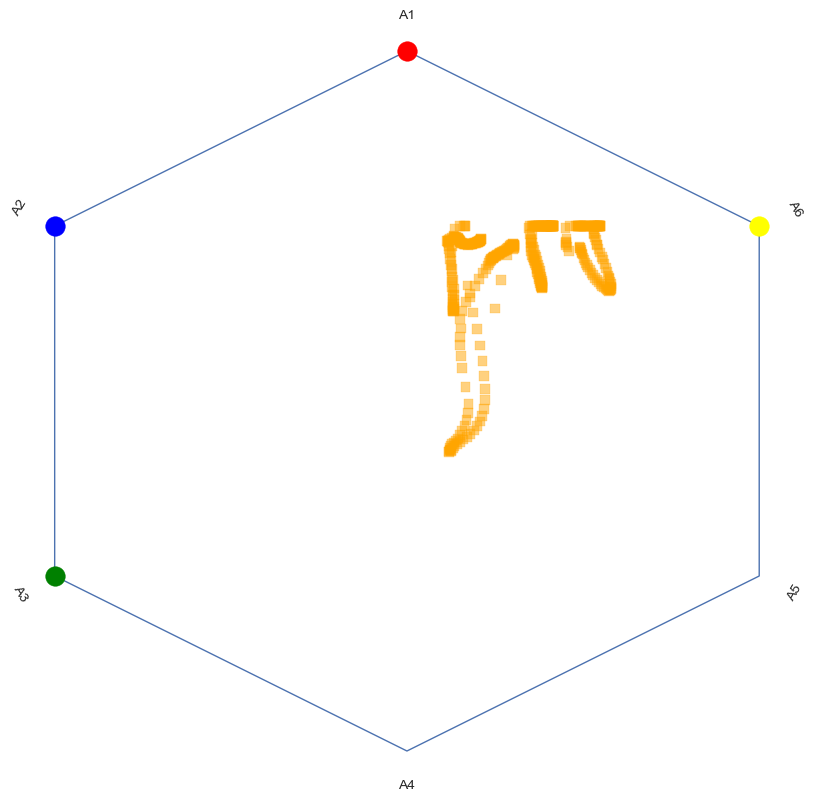

[[ 6.12323400e-17  1.00000000e+00]
 [-8.66025404e-01  5.00000000e-01]
 [-8.66025404e-01 -5.00000000e-01]
 [-1.83697020e-16 -1.00000000e+00]
 [ 8.66025404e-01 -5.00000000e-01]
 [ 8.66025404e-01  5.00000000e-01]]


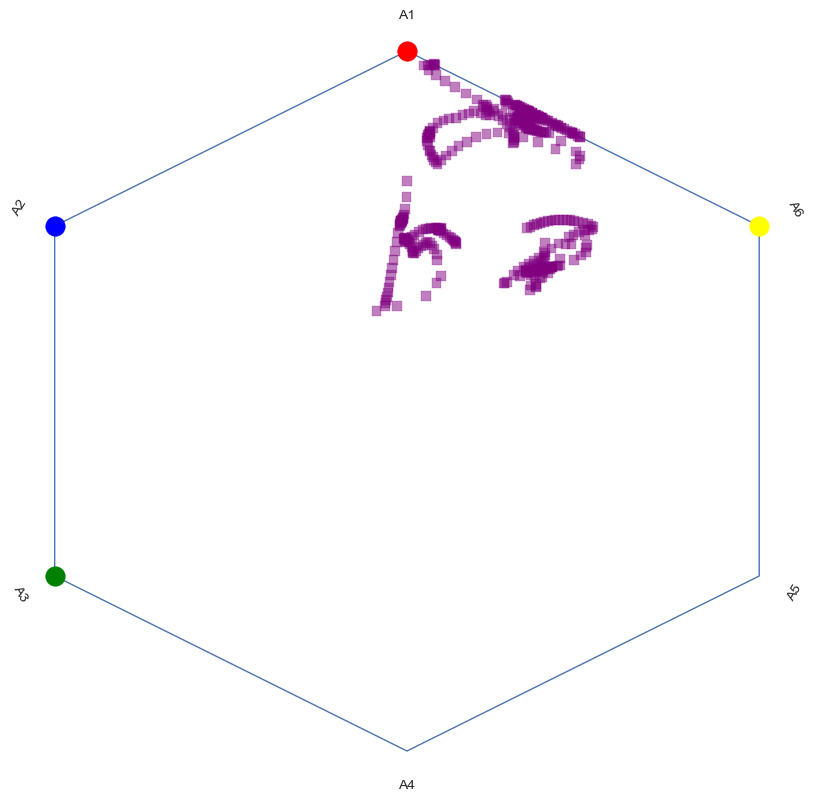

[[ 6.12323400e-17  1.00000000e+00]
 [-8.66025404e-01  5.00000000e-01]
 [-8.66025404e-01 -5.00000000e-01]
 [-1.83697020e-16 -1.00000000e+00]
 [ 8.66025404e-01 -5.00000000e-01]
 [ 8.66025404e-01  5.00000000e-01]]


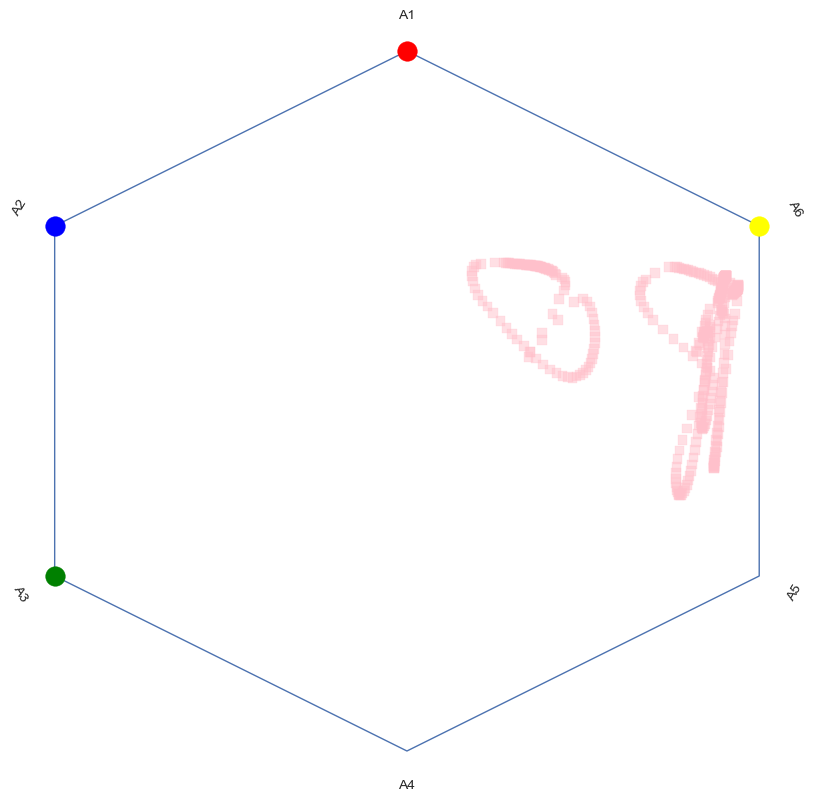

[[ 6.12323400e-17  1.00000000e+00]
 [-8.66025404e-01  5.00000000e-01]
 [-8.66025404e-01 -5.00000000e-01]
 [-1.83697020e-16 -1.00000000e+00]
 [ 8.66025404e-01 -5.00000000e-01]
 [ 8.66025404e-01  5.00000000e-01]]


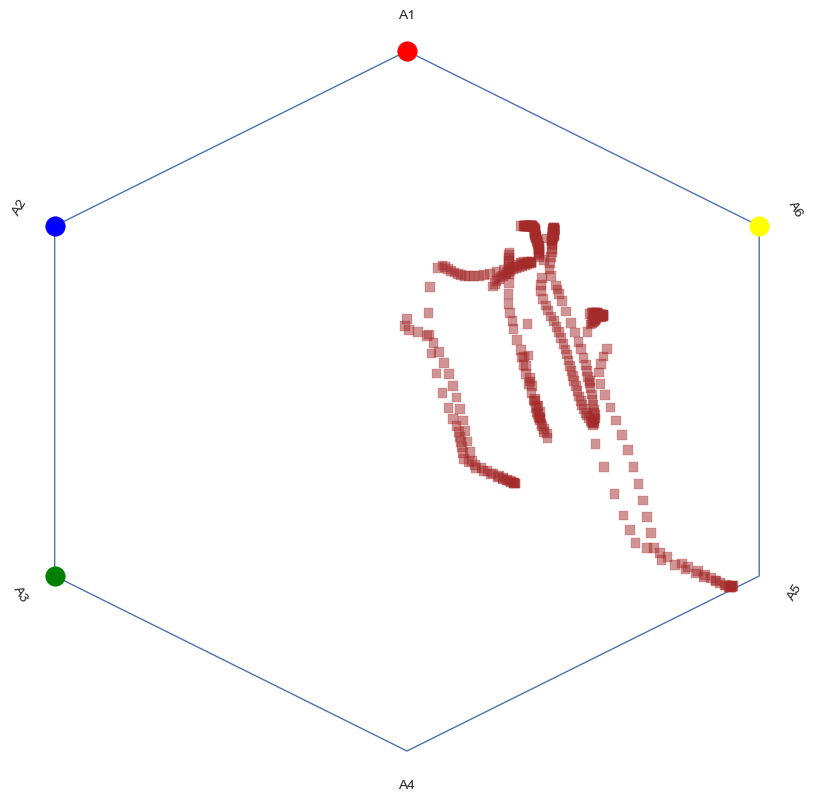

[[ 6.12323400e-17  1.00000000e+00]
 [-8.66025404e-01  5.00000000e-01]
 [-8.66025404e-01 -5.00000000e-01]
 [-1.83697020e-16 -1.00000000e+00]
 [ 8.66025404e-01 -5.00000000e-01]
 [ 8.66025404e-01  5.00000000e-01]]


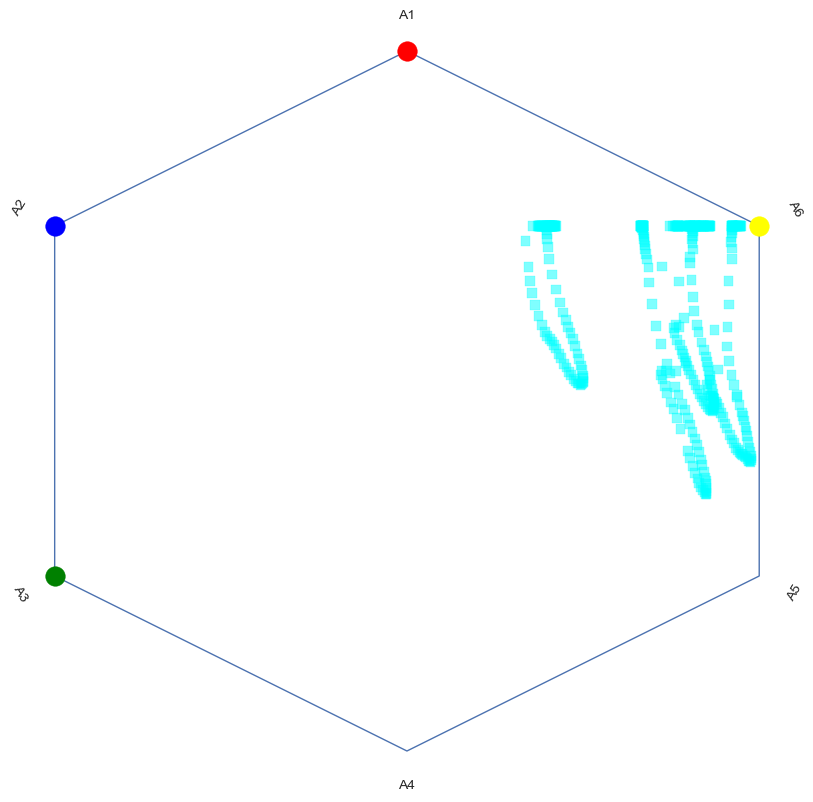

[[ 6.12323400e-17  1.00000000e+00]
 [-8.66025404e-01  5.00000000e-01]
 [-8.66025404e-01 -5.00000000e-01]
 [-1.83697020e-16 -1.00000000e+00]
 [ 8.66025404e-01 -5.00000000e-01]
 [ 8.66025404e-01  5.00000000e-01]]


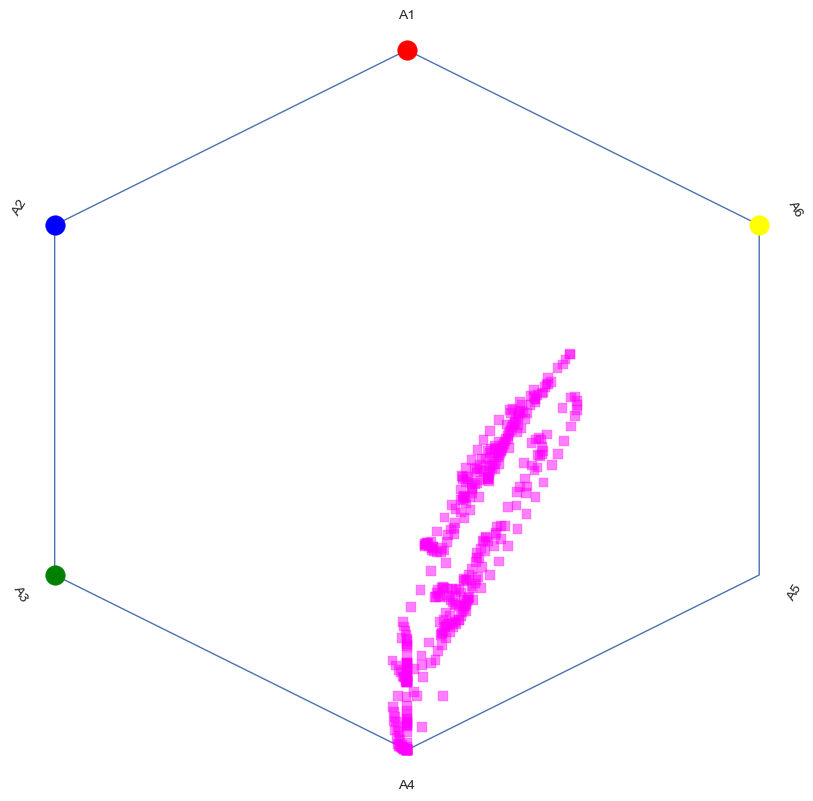

[[ 6.12323400e-17  1.00000000e+00]
 [-8.66025404e-01  5.00000000e-01]
 [-8.66025404e-01 -5.00000000e-01]
 [-1.83697020e-16 -1.00000000e+00]
 [ 8.66025404e-01 -5.00000000e-01]
 [ 8.66025404e-01  5.00000000e-01]]


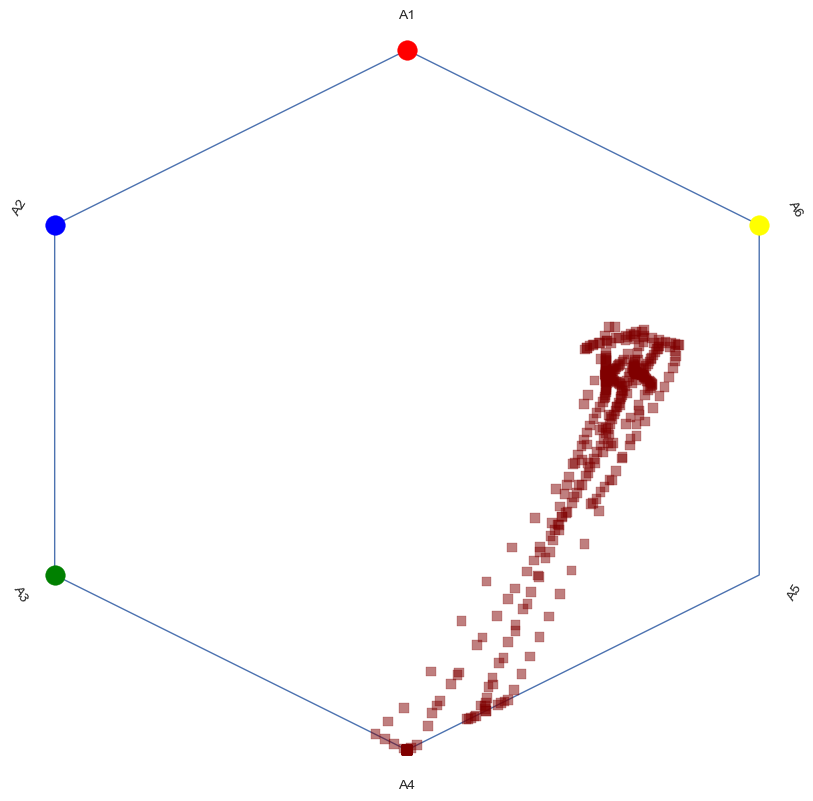

[[ 6.12323400e-17  1.00000000e+00]
 [-8.66025404e-01  5.00000000e-01]
 [-8.66025404e-01 -5.00000000e-01]
 [-1.83697020e-16 -1.00000000e+00]
 [ 8.66025404e-01 -5.00000000e-01]
 [ 8.66025404e-01  5.00000000e-01]]


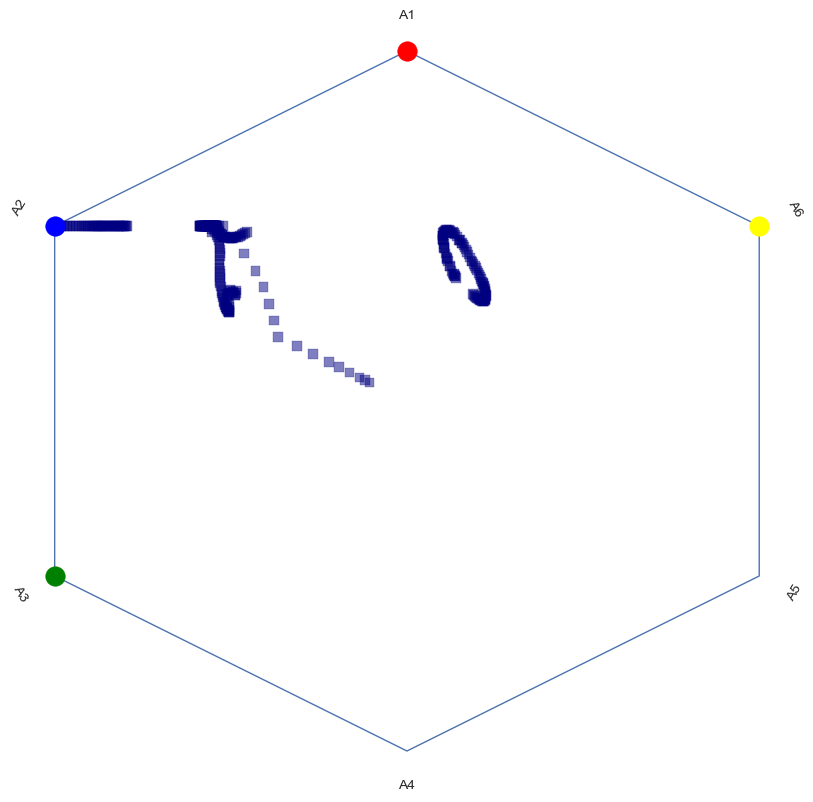

[[ 6.12323400e-17  1.00000000e+00]
 [-8.66025404e-01  5.00000000e-01]
 [-8.66025404e-01 -5.00000000e-01]
 [-1.83697020e-16 -1.00000000e+00]
 [ 8.66025404e-01 -5.00000000e-01]
 [ 8.66025404e-01  5.00000000e-01]]


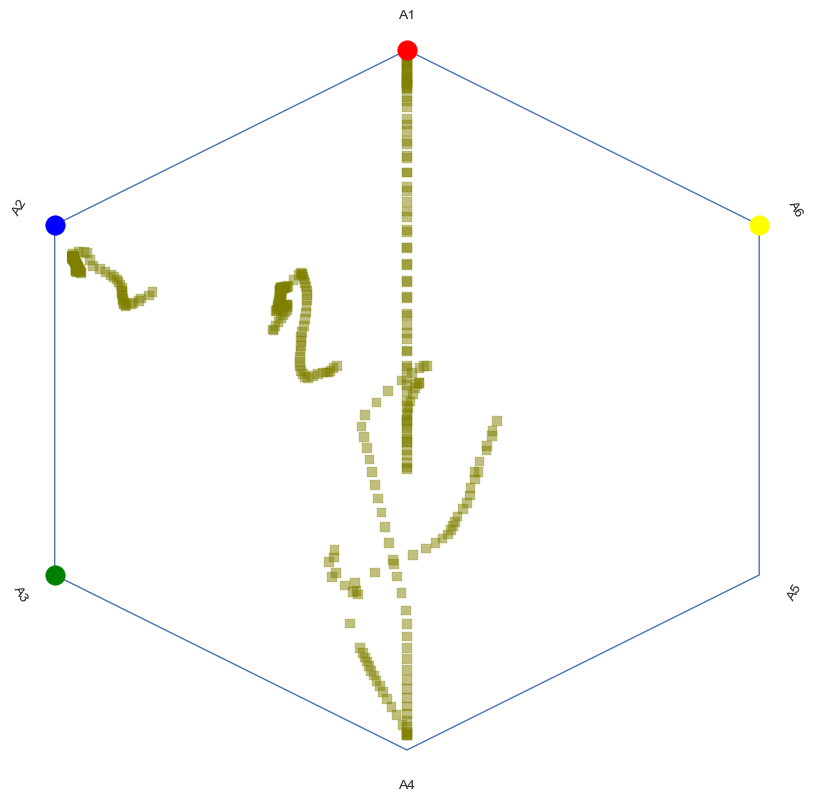

[[ 6.12323400e-17  1.00000000e+00]
 [-8.66025404e-01  5.00000000e-01]
 [-8.66025404e-01 -5.00000000e-01]
 [-1.83697020e-16 -1.00000000e+00]
 [ 8.66025404e-01 -5.00000000e-01]
 [ 8.66025404e-01  5.00000000e-01]]


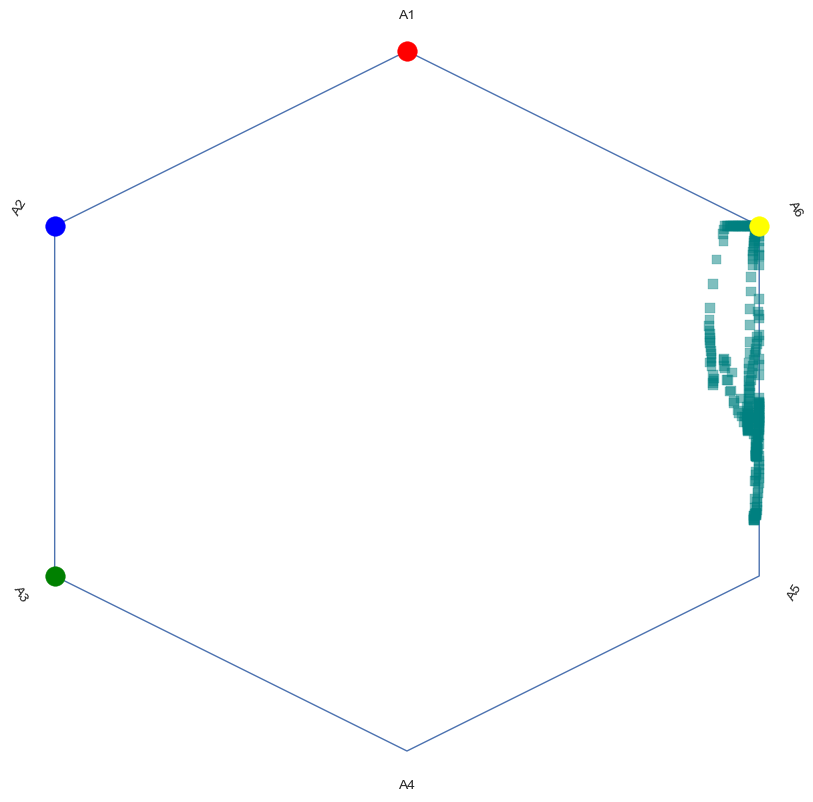

[[ 6.12323400e-17  1.00000000e+00]
 [-8.66025404e-01  5.00000000e-01]
 [-8.66025404e-01 -5.00000000e-01]
 [-1.83697020e-16 -1.00000000e+00]
 [ 8.66025404e-01 -5.00000000e-01]
 [ 8.66025404e-01  5.00000000e-01]]


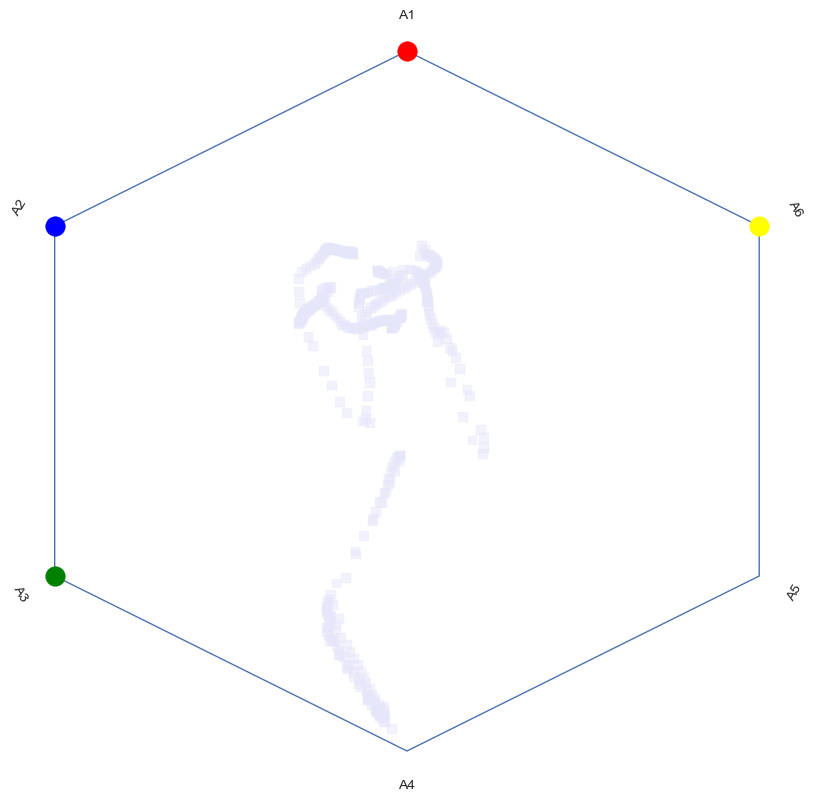

[[ 6.12323400e-17  1.00000000e+00]
 [-8.66025404e-01  5.00000000e-01]
 [-8.66025404e-01 -5.00000000e-01]
 [-1.83697020e-16 -1.00000000e+00]
 [ 8.66025404e-01 -5.00000000e-01]
 [ 8.66025404e-01  5.00000000e-01]]


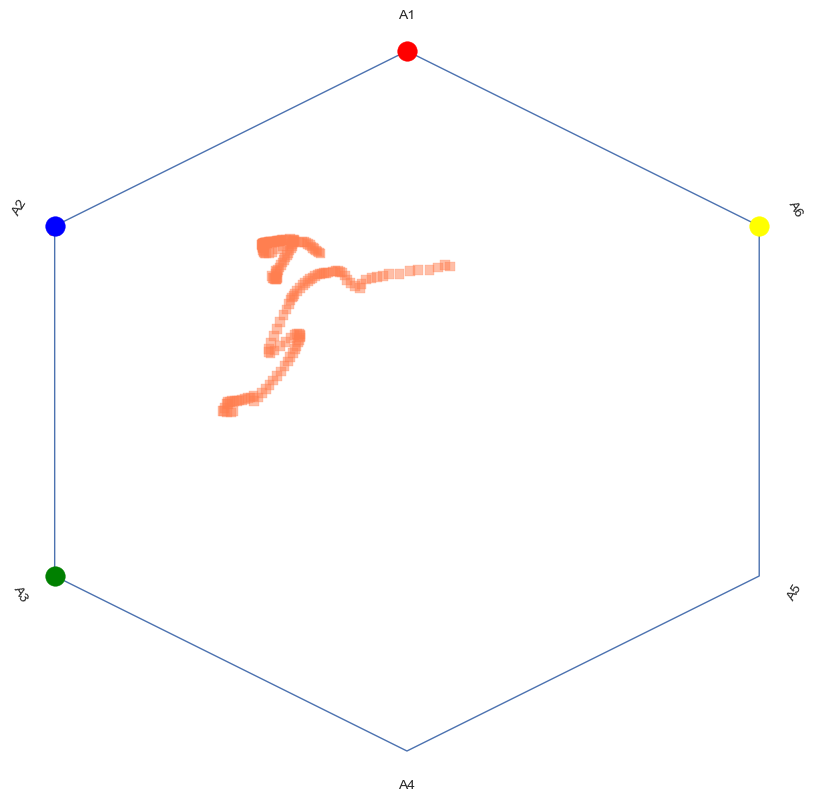

------------------
[[ 6.12323400e-17  1.00000000e+00]
 [-7.81831482e-01  6.23489802e-01]
 [-9.74927912e-01 -2.22520934e-01]
 [-4.33883739e-01 -9.00968868e-01]
 [ 4.33883739e-01 -9.00968868e-01]
 [ 9.74927912e-01 -2.22520934e-01]
 [ 7.81831482e-01  6.23489802e-01]]


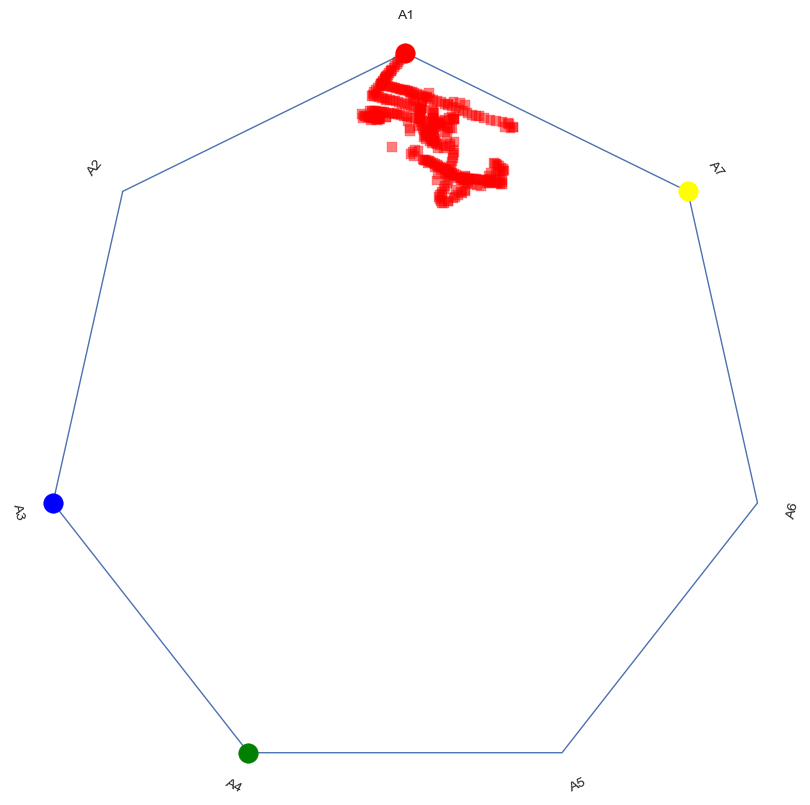

[[ 6.12323400e-17  1.00000000e+00]
 [-7.81831482e-01  6.23489802e-01]
 [-9.74927912e-01 -2.22520934e-01]
 [-4.33883739e-01 -9.00968868e-01]
 [ 4.33883739e-01 -9.00968868e-01]
 [ 9.74927912e-01 -2.22520934e-01]
 [ 7.81831482e-01  6.23489802e-01]]


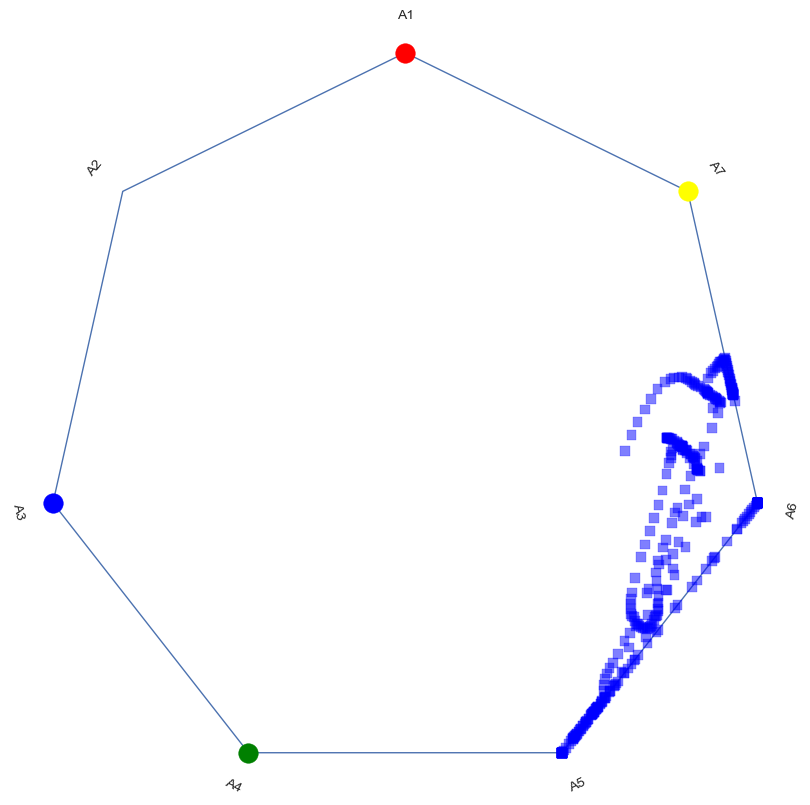

[[ 6.12323400e-17  1.00000000e+00]
 [-7.81831482e-01  6.23489802e-01]
 [-9.74927912e-01 -2.22520934e-01]
 [-4.33883739e-01 -9.00968868e-01]
 [ 4.33883739e-01 -9.00968868e-01]
 [ 9.74927912e-01 -2.22520934e-01]
 [ 7.81831482e-01  6.23489802e-01]]


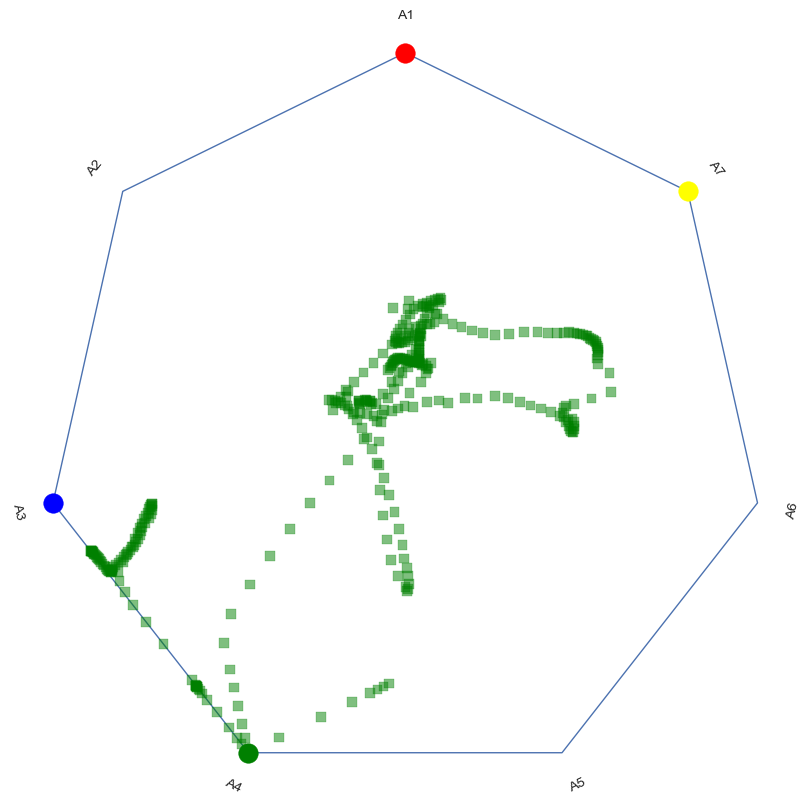

[[ 6.12323400e-17  1.00000000e+00]
 [-7.81831482e-01  6.23489802e-01]
 [-9.74927912e-01 -2.22520934e-01]
 [-4.33883739e-01 -9.00968868e-01]
 [ 4.33883739e-01 -9.00968868e-01]
 [ 9.74927912e-01 -2.22520934e-01]
 [ 7.81831482e-01  6.23489802e-01]]


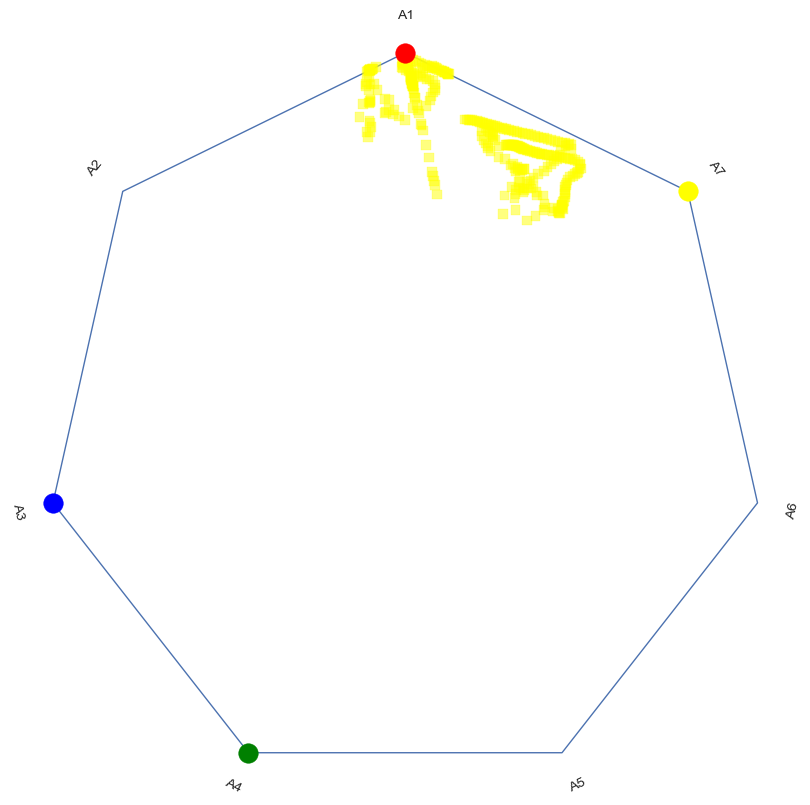

[[ 6.12323400e-17  1.00000000e+00]
 [-7.81831482e-01  6.23489802e-01]
 [-9.74927912e-01 -2.22520934e-01]
 [-4.33883739e-01 -9.00968868e-01]
 [ 4.33883739e-01 -9.00968868e-01]
 [ 9.74927912e-01 -2.22520934e-01]
 [ 7.81831482e-01  6.23489802e-01]]


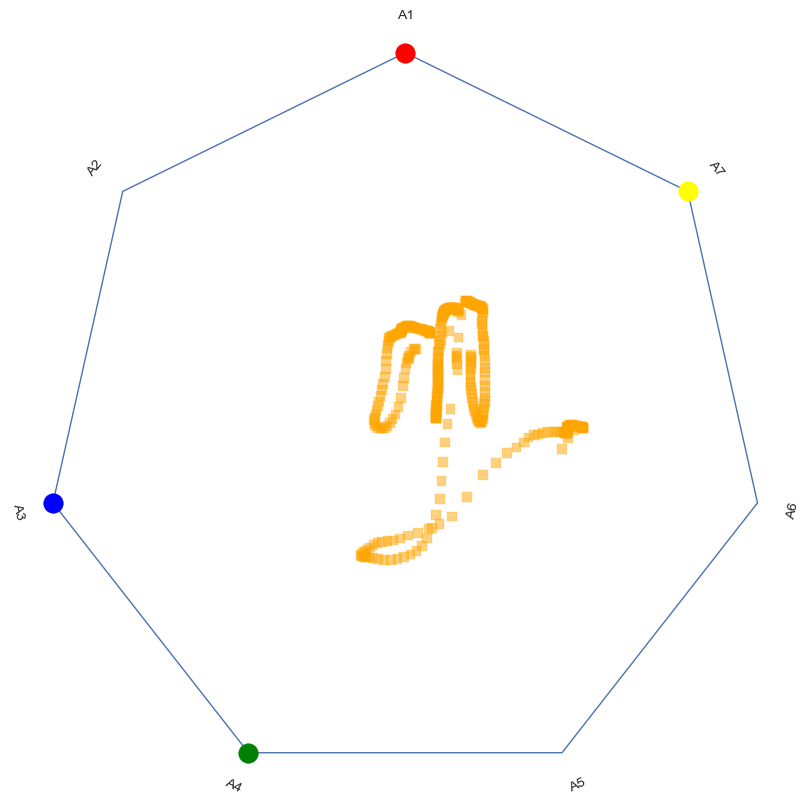

[[ 6.12323400e-17  1.00000000e+00]
 [-7.81831482e-01  6.23489802e-01]
 [-9.74927912e-01 -2.22520934e-01]
 [-4.33883739e-01 -9.00968868e-01]
 [ 4.33883739e-01 -9.00968868e-01]
 [ 9.74927912e-01 -2.22520934e-01]
 [ 7.81831482e-01  6.23489802e-01]]


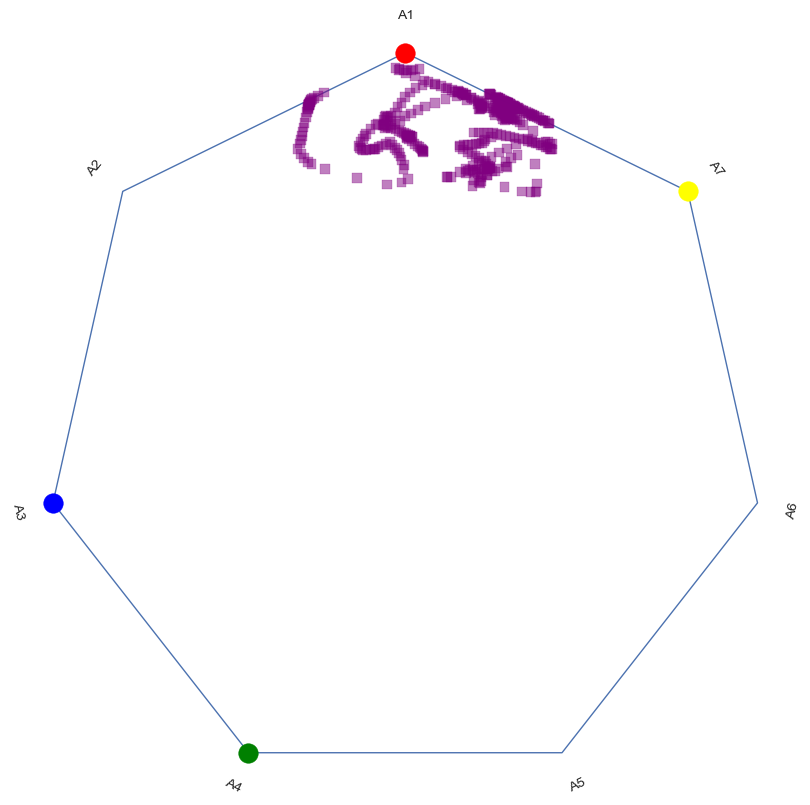

[[ 6.12323400e-17  1.00000000e+00]
 [-7.81831482e-01  6.23489802e-01]
 [-9.74927912e-01 -2.22520934e-01]
 [-4.33883739e-01 -9.00968868e-01]
 [ 4.33883739e-01 -9.00968868e-01]
 [ 9.74927912e-01 -2.22520934e-01]
 [ 7.81831482e-01  6.23489802e-01]]


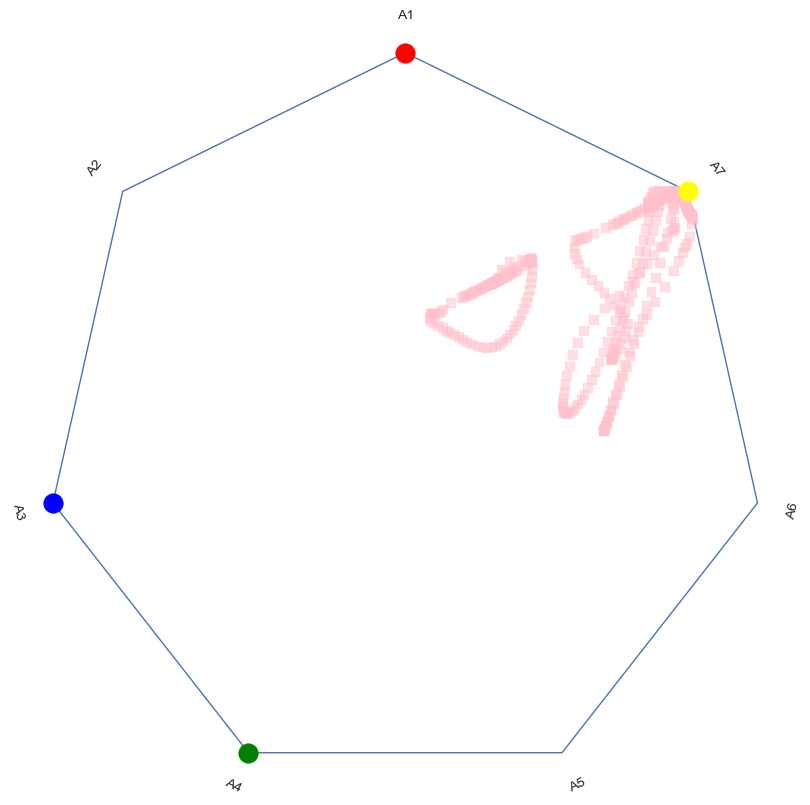

[[ 6.12323400e-17  1.00000000e+00]
 [-7.81831482e-01  6.23489802e-01]
 [-9.74927912e-01 -2.22520934e-01]
 [-4.33883739e-01 -9.00968868e-01]
 [ 4.33883739e-01 -9.00968868e-01]
 [ 9.74927912e-01 -2.22520934e-01]
 [ 7.81831482e-01  6.23489802e-01]]


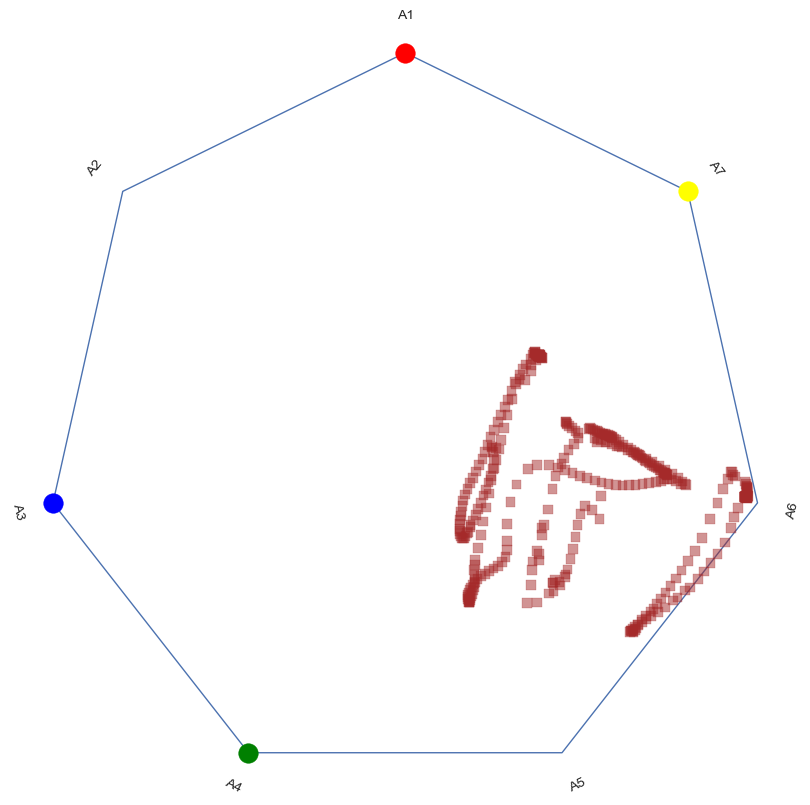

[[ 6.12323400e-17  1.00000000e+00]
 [-7.81831482e-01  6.23489802e-01]
 [-9.74927912e-01 -2.22520934e-01]
 [-4.33883739e-01 -9.00968868e-01]
 [ 4.33883739e-01 -9.00968868e-01]
 [ 9.74927912e-01 -2.22520934e-01]
 [ 7.81831482e-01  6.23489802e-01]]


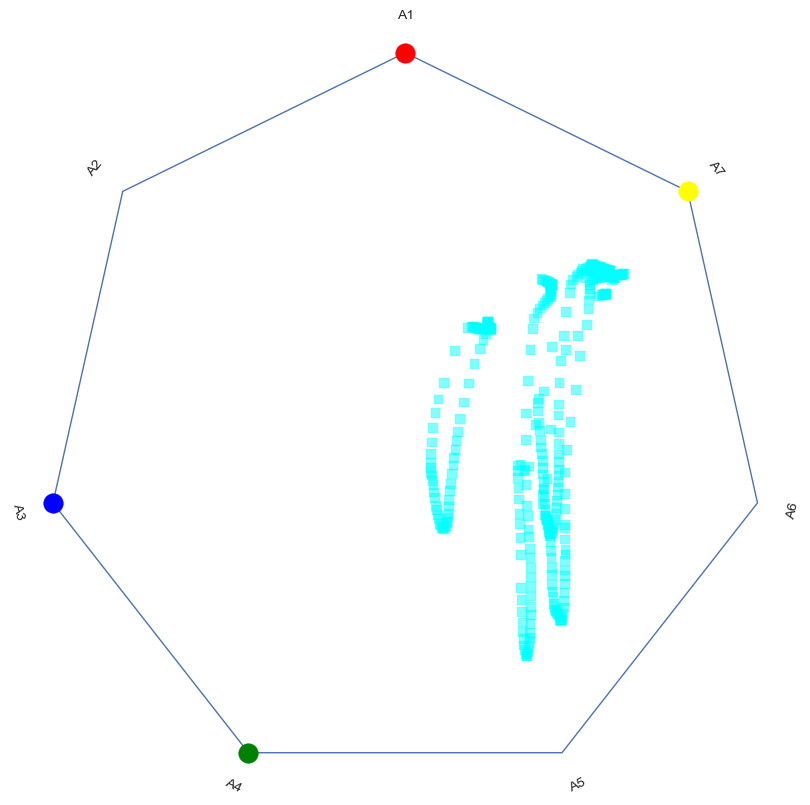

[[ 6.12323400e-17  1.00000000e+00]
 [-7.81831482e-01  6.23489802e-01]
 [-9.74927912e-01 -2.22520934e-01]
 [-4.33883739e-01 -9.00968868e-01]
 [ 4.33883739e-01 -9.00968868e-01]
 [ 9.74927912e-01 -2.22520934e-01]
 [ 7.81831482e-01  6.23489802e-01]]


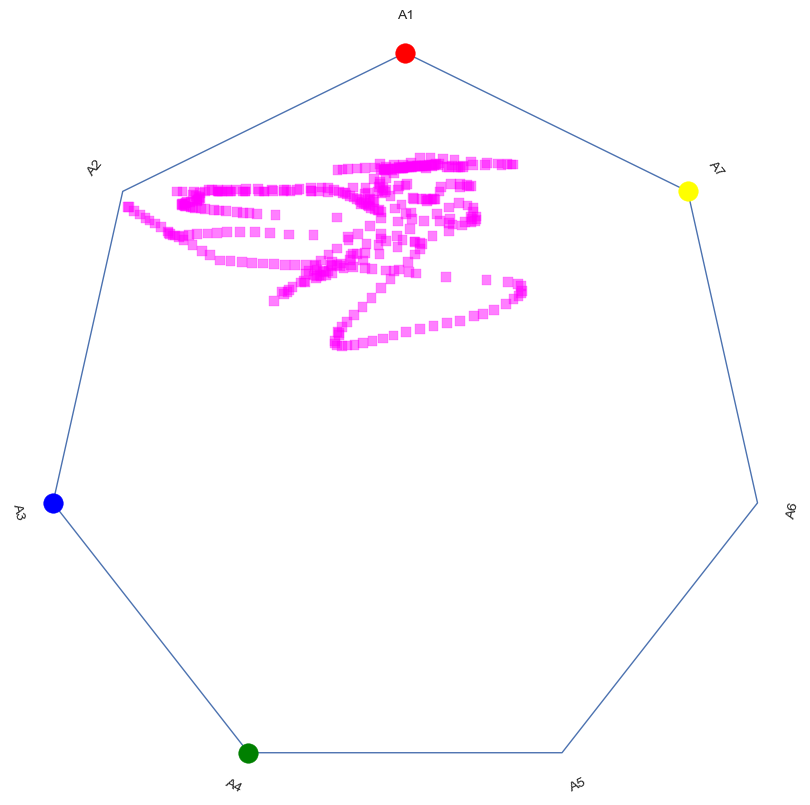

[[ 6.12323400e-17  1.00000000e+00]
 [-7.81831482e-01  6.23489802e-01]
 [-9.74927912e-01 -2.22520934e-01]
 [-4.33883739e-01 -9.00968868e-01]
 [ 4.33883739e-01 -9.00968868e-01]
 [ 9.74927912e-01 -2.22520934e-01]
 [ 7.81831482e-01  6.23489802e-01]]


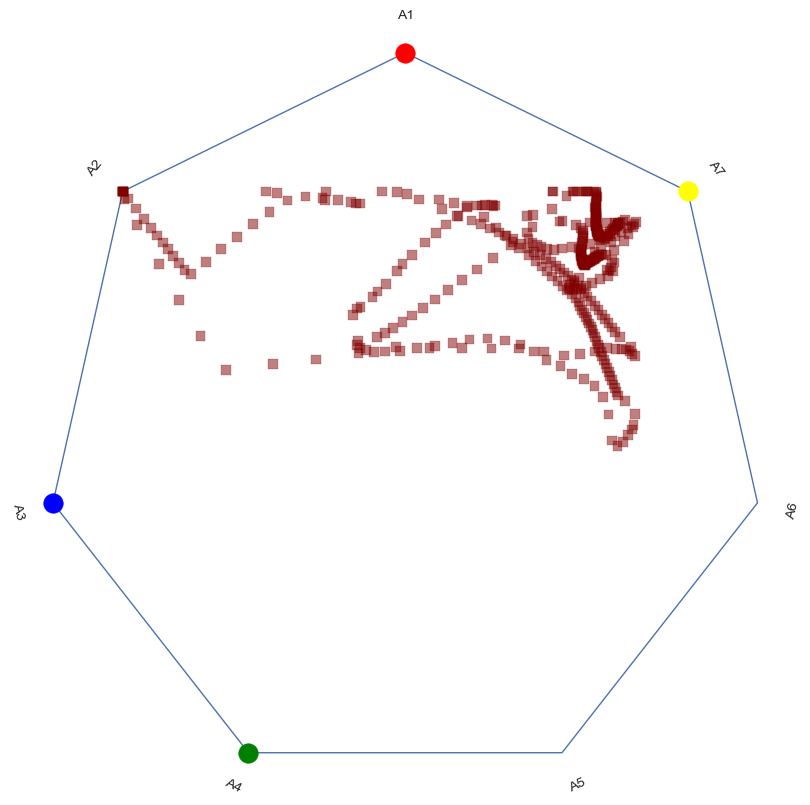

[[ 6.12323400e-17  1.00000000e+00]
 [-7.81831482e-01  6.23489802e-01]
 [-9.74927912e-01 -2.22520934e-01]
 [-4.33883739e-01 -9.00968868e-01]
 [ 4.33883739e-01 -9.00968868e-01]
 [ 9.74927912e-01 -2.22520934e-01]
 [ 7.81831482e-01  6.23489802e-01]]


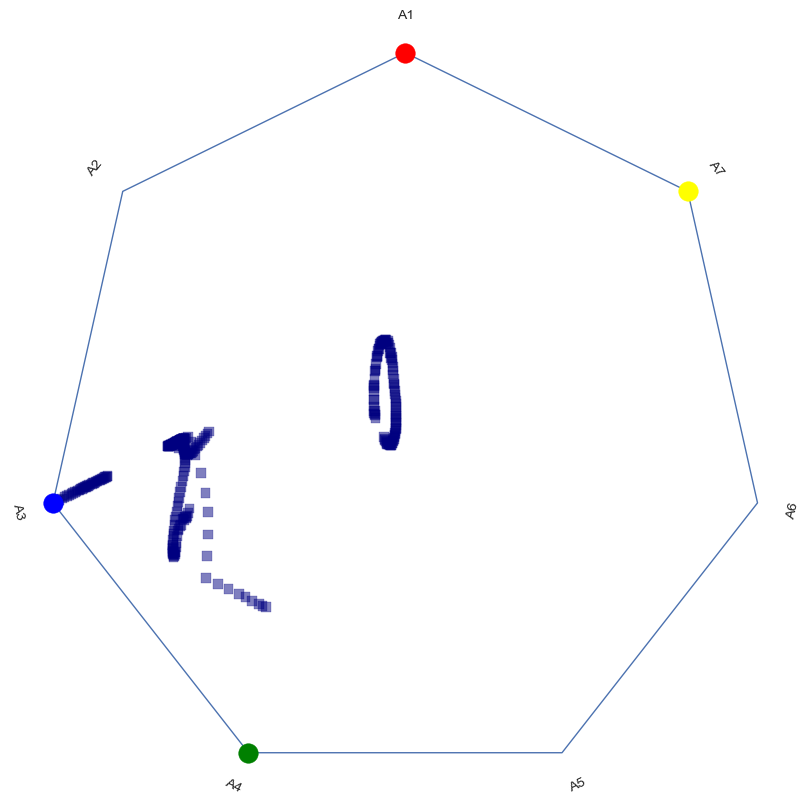

[[ 6.12323400e-17  1.00000000e+00]
 [-7.81831482e-01  6.23489802e-01]
 [-9.74927912e-01 -2.22520934e-01]
 [-4.33883739e-01 -9.00968868e-01]
 [ 4.33883739e-01 -9.00968868e-01]
 [ 9.74927912e-01 -2.22520934e-01]
 [ 7.81831482e-01  6.23489802e-01]]


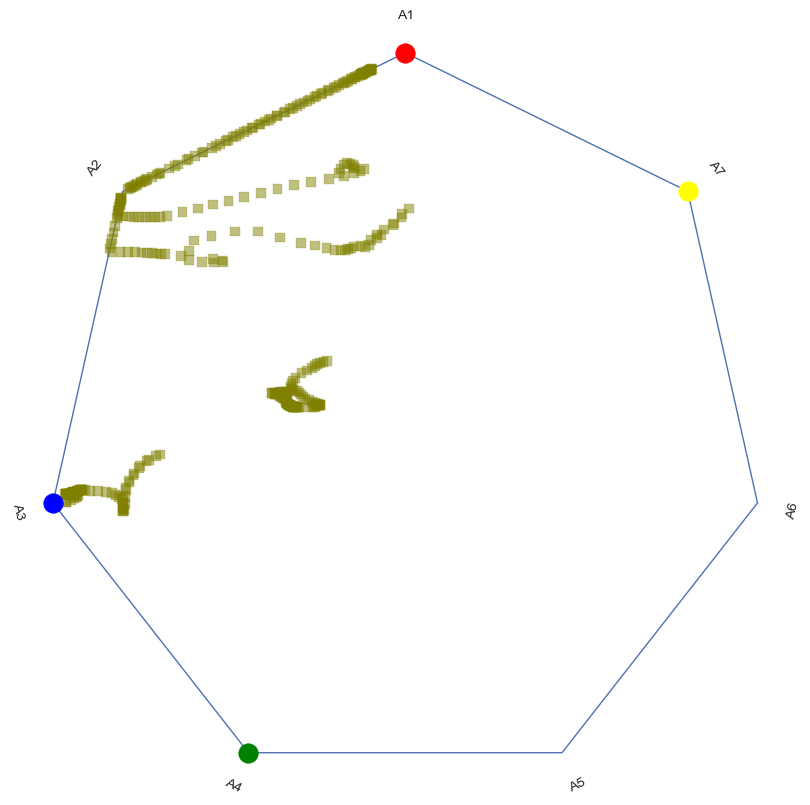

[[ 6.12323400e-17  1.00000000e+00]
 [-7.81831482e-01  6.23489802e-01]
 [-9.74927912e-01 -2.22520934e-01]
 [-4.33883739e-01 -9.00968868e-01]
 [ 4.33883739e-01 -9.00968868e-01]
 [ 9.74927912e-01 -2.22520934e-01]
 [ 7.81831482e-01  6.23489802e-01]]


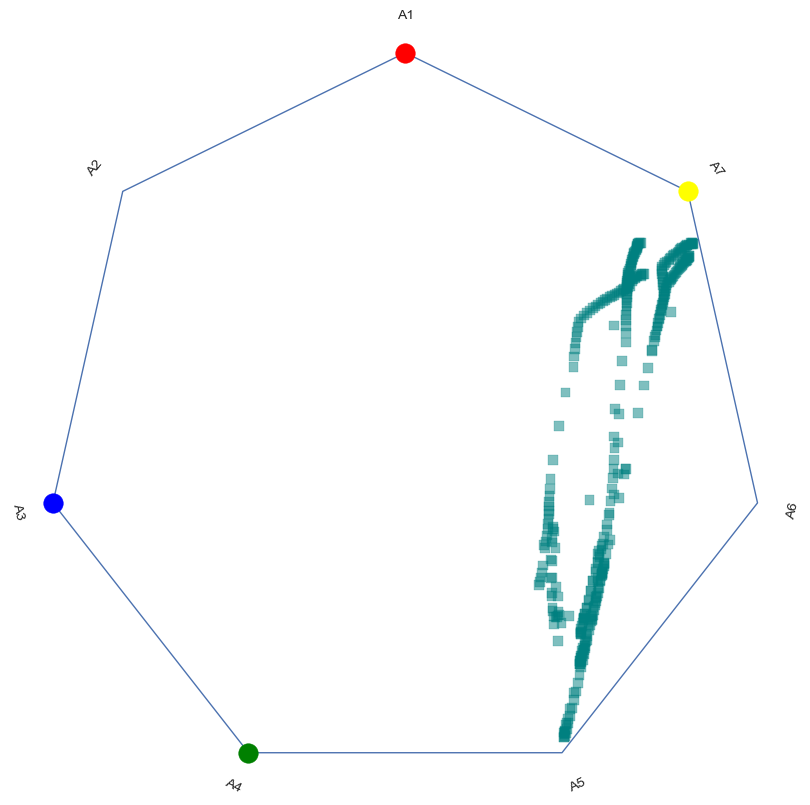

[[ 6.12323400e-17  1.00000000e+00]
 [-7.81831482e-01  6.23489802e-01]
 [-9.74927912e-01 -2.22520934e-01]
 [-4.33883739e-01 -9.00968868e-01]
 [ 4.33883739e-01 -9.00968868e-01]
 [ 9.74927912e-01 -2.22520934e-01]
 [ 7.81831482e-01  6.23489802e-01]]


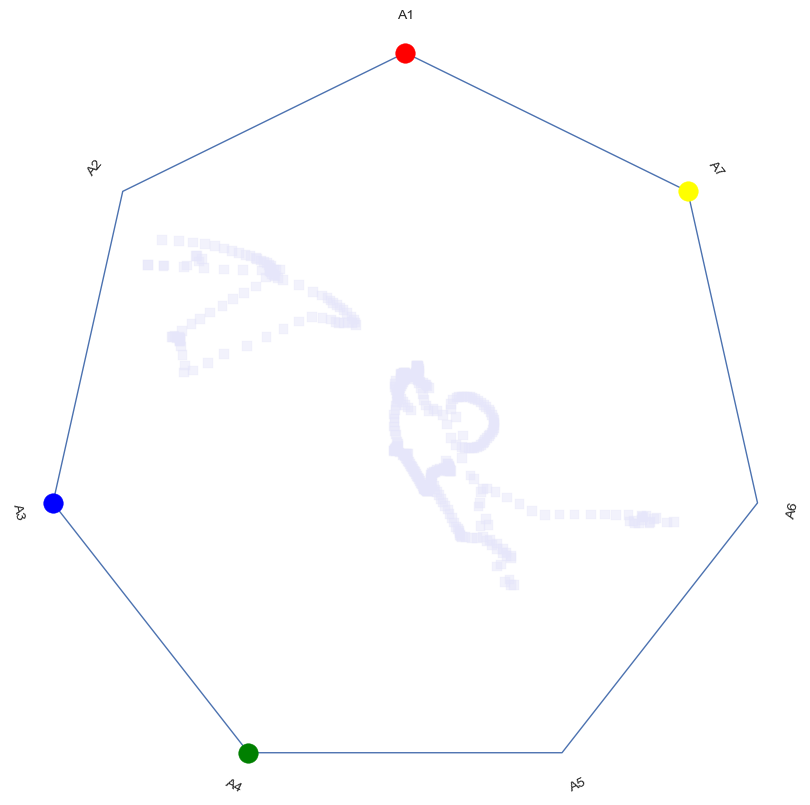

[[ 6.12323400e-17  1.00000000e+00]
 [-7.81831482e-01  6.23489802e-01]
 [-9.74927912e-01 -2.22520934e-01]
 [-4.33883739e-01 -9.00968868e-01]
 [ 4.33883739e-01 -9.00968868e-01]
 [ 9.74927912e-01 -2.22520934e-01]
 [ 7.81831482e-01  6.23489802e-01]]


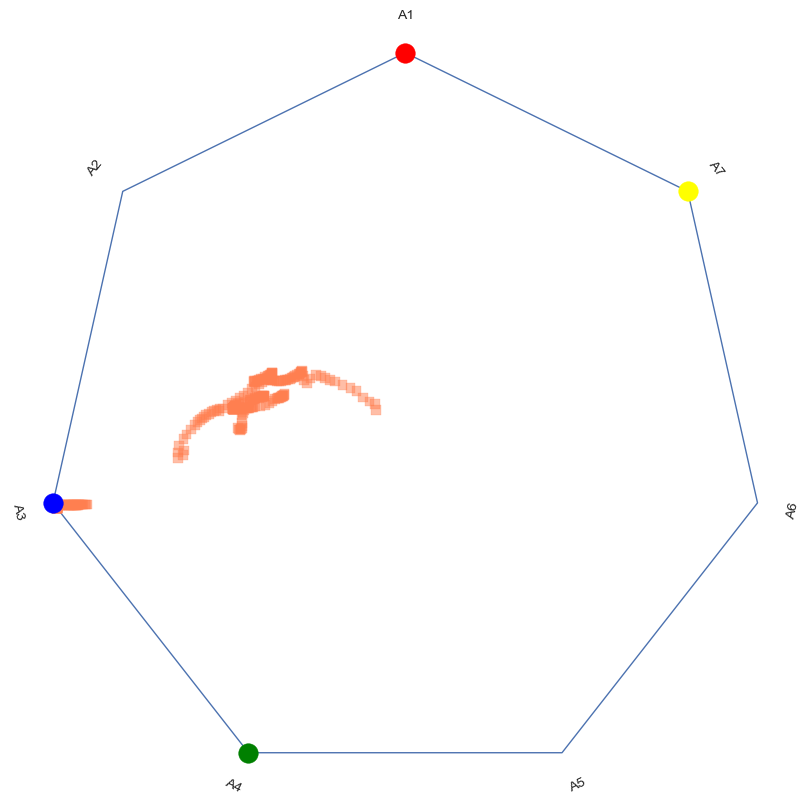

------------------
[[ 6.12323400e-17  1.00000000e+00]
 [-7.07106781e-01  7.07106781e-01]
 [-1.00000000e+00  1.22464680e-16]
 [-7.07106781e-01 -7.07106781e-01]
 [-1.83697020e-16 -1.00000000e+00]
 [ 7.07106781e-01 -7.07106781e-01]
 [ 1.00000000e+00 -2.44929360e-16]
 [ 7.07106781e-01  7.07106781e-01]]


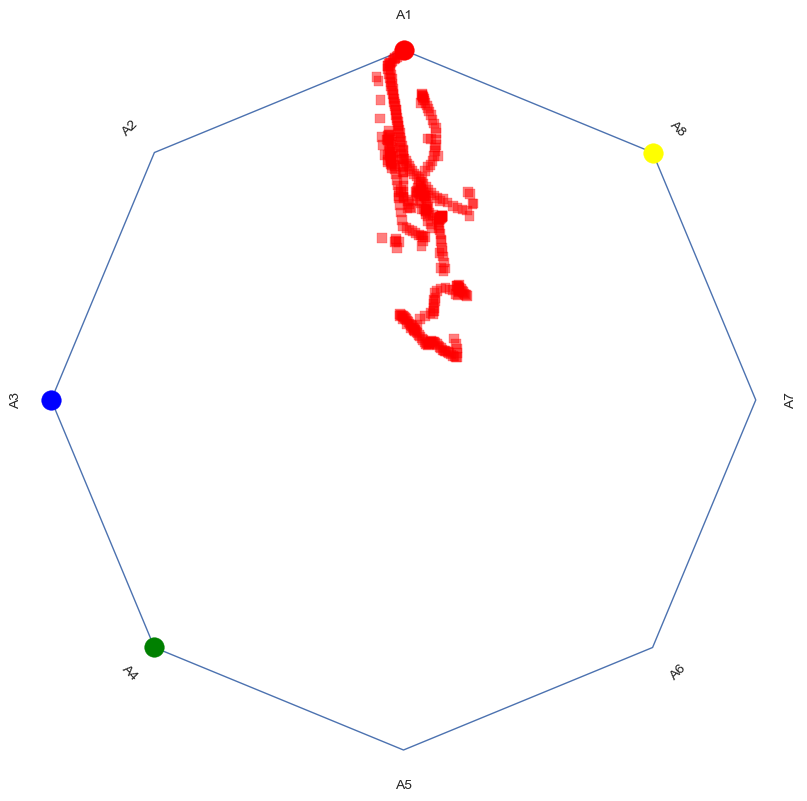

[[ 6.12323400e-17  1.00000000e+00]
 [-7.07106781e-01  7.07106781e-01]
 [-1.00000000e+00  1.22464680e-16]
 [-7.07106781e-01 -7.07106781e-01]
 [-1.83697020e-16 -1.00000000e+00]
 [ 7.07106781e-01 -7.07106781e-01]
 [ 1.00000000e+00 -2.44929360e-16]
 [ 7.07106781e-01  7.07106781e-01]]


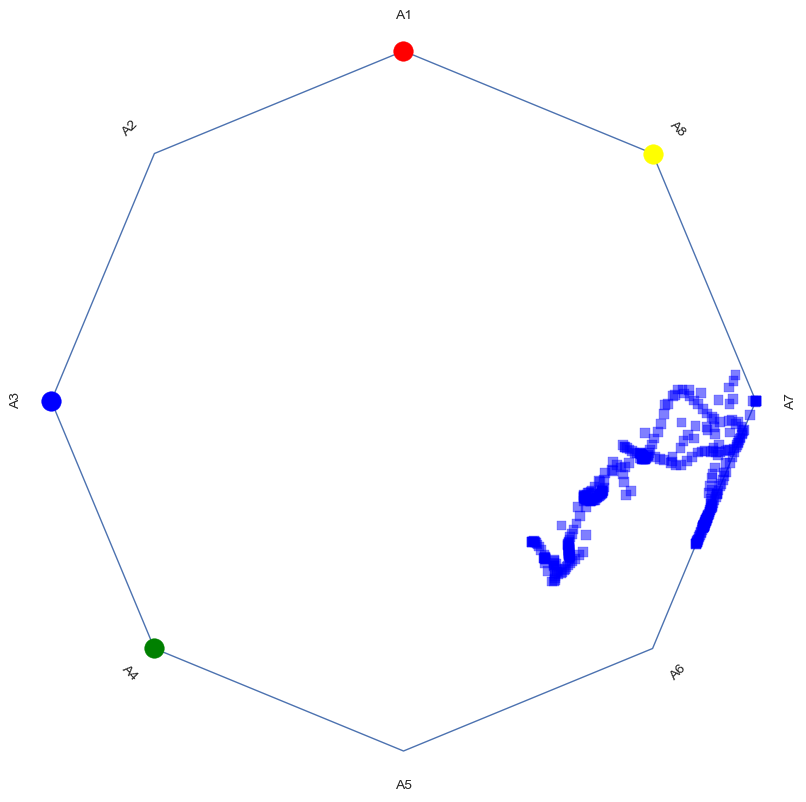

[[ 6.12323400e-17  1.00000000e+00]
 [-7.07106781e-01  7.07106781e-01]
 [-1.00000000e+00  1.22464680e-16]
 [-7.07106781e-01 -7.07106781e-01]
 [-1.83697020e-16 -1.00000000e+00]
 [ 7.07106781e-01 -7.07106781e-01]
 [ 1.00000000e+00 -2.44929360e-16]
 [ 7.07106781e-01  7.07106781e-01]]


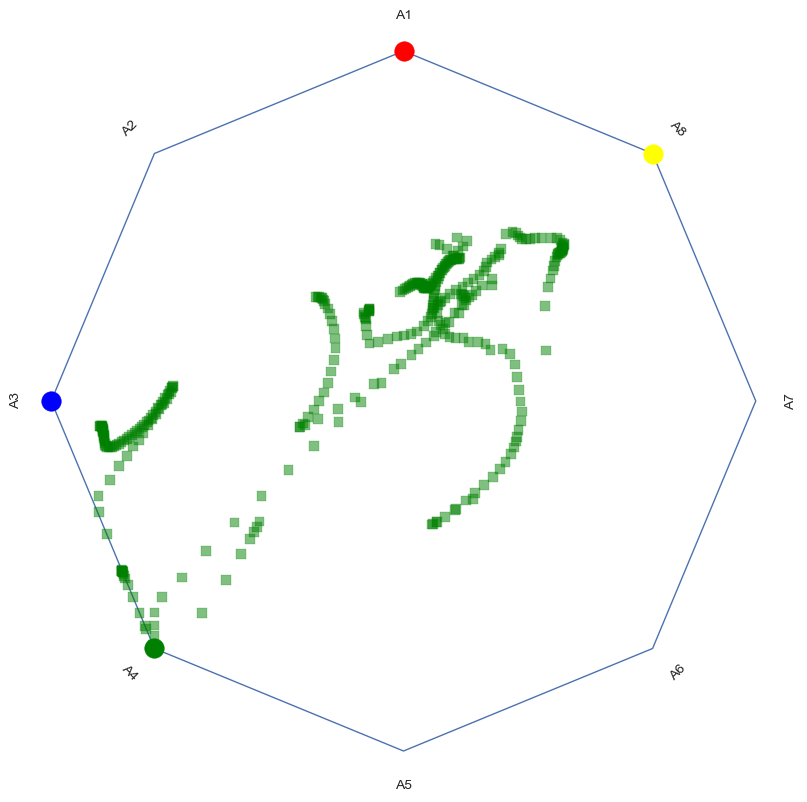

[[ 6.12323400e-17  1.00000000e+00]
 [-7.07106781e-01  7.07106781e-01]
 [-1.00000000e+00  1.22464680e-16]
 [-7.07106781e-01 -7.07106781e-01]
 [-1.83697020e-16 -1.00000000e+00]
 [ 7.07106781e-01 -7.07106781e-01]
 [ 1.00000000e+00 -2.44929360e-16]
 [ 7.07106781e-01  7.07106781e-01]]


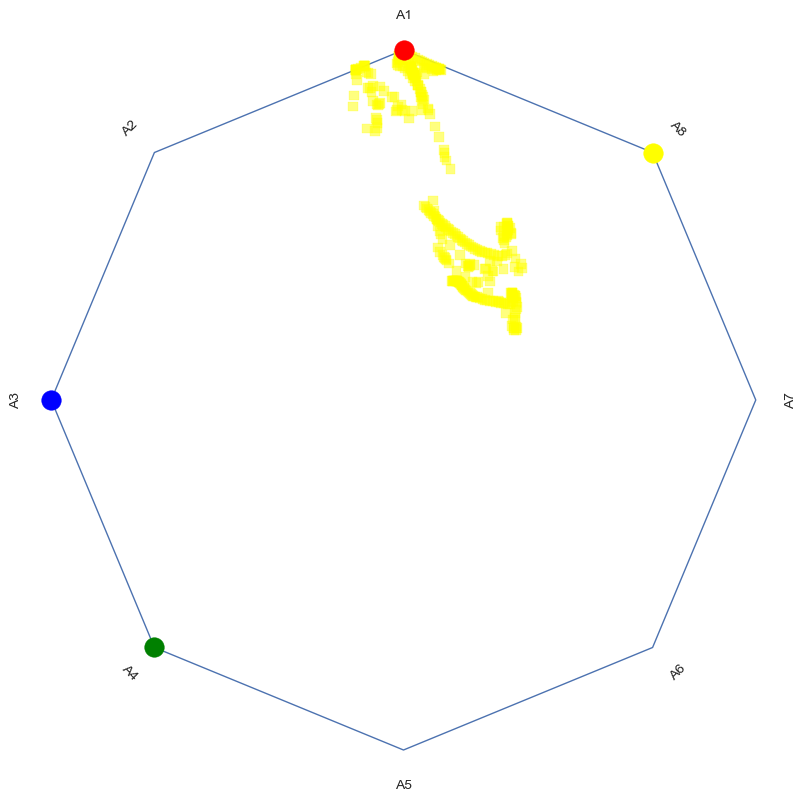

[[ 6.12323400e-17  1.00000000e+00]
 [-7.07106781e-01  7.07106781e-01]
 [-1.00000000e+00  1.22464680e-16]
 [-7.07106781e-01 -7.07106781e-01]
 [-1.83697020e-16 -1.00000000e+00]
 [ 7.07106781e-01 -7.07106781e-01]
 [ 1.00000000e+00 -2.44929360e-16]
 [ 7.07106781e-01  7.07106781e-01]]


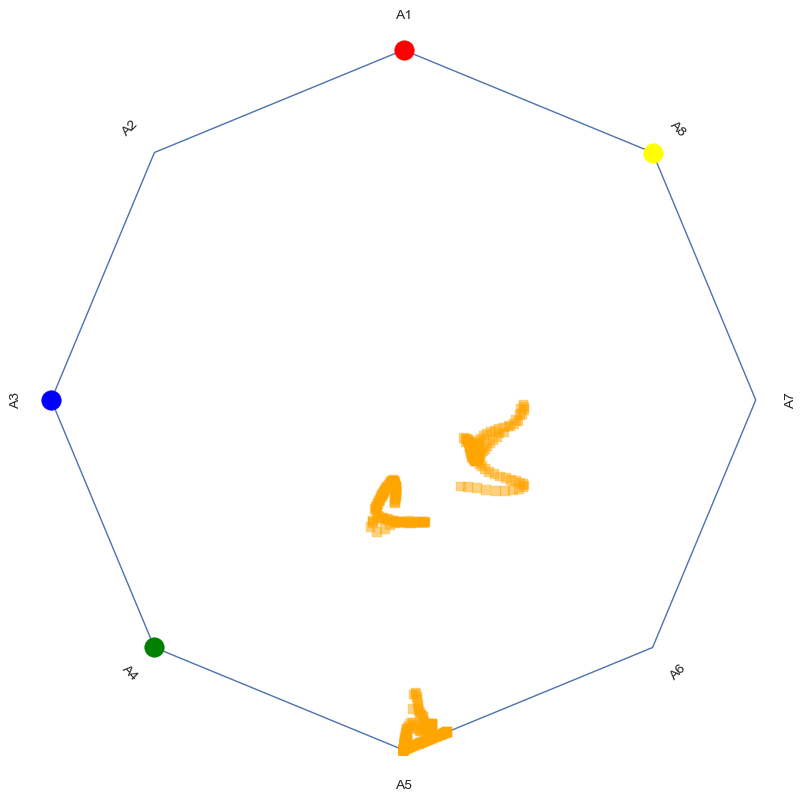

[[ 6.12323400e-17  1.00000000e+00]
 [-7.07106781e-01  7.07106781e-01]
 [-1.00000000e+00  1.22464680e-16]
 [-7.07106781e-01 -7.07106781e-01]
 [-1.83697020e-16 -1.00000000e+00]
 [ 7.07106781e-01 -7.07106781e-01]
 [ 1.00000000e+00 -2.44929360e-16]
 [ 7.07106781e-01  7.07106781e-01]]


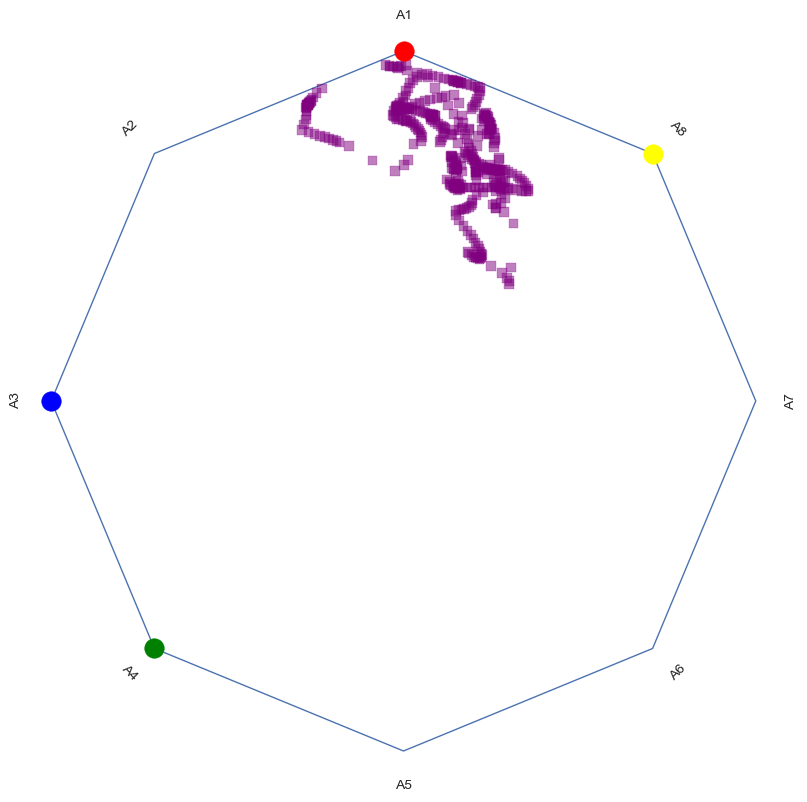

[[ 6.12323400e-17  1.00000000e+00]
 [-7.07106781e-01  7.07106781e-01]
 [-1.00000000e+00  1.22464680e-16]
 [-7.07106781e-01 -7.07106781e-01]
 [-1.83697020e-16 -1.00000000e+00]
 [ 7.07106781e-01 -7.07106781e-01]
 [ 1.00000000e+00 -2.44929360e-16]
 [ 7.07106781e-01  7.07106781e-01]]


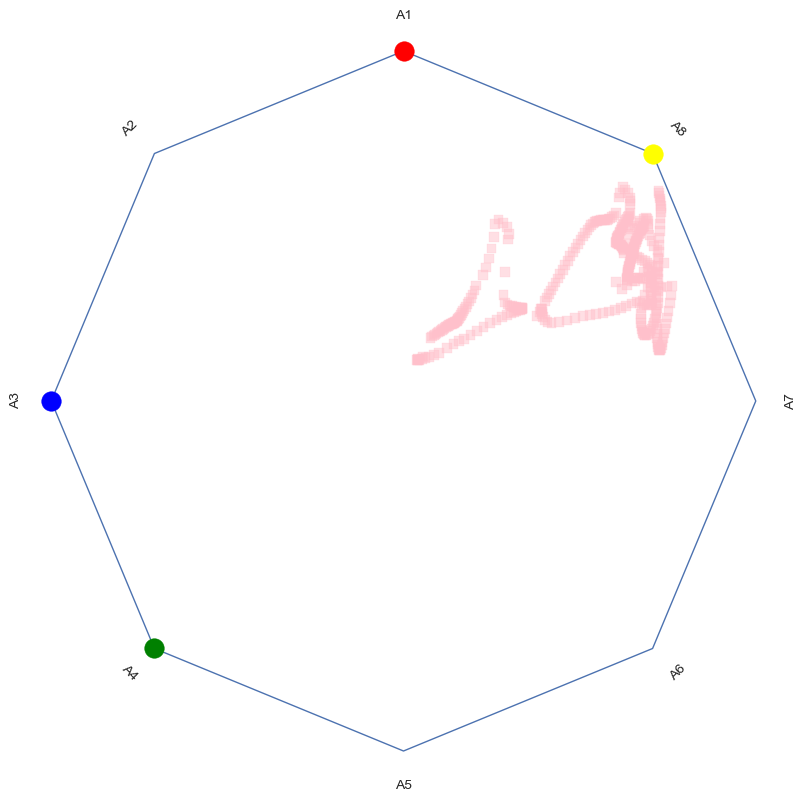

[[ 6.12323400e-17  1.00000000e+00]
 [-7.07106781e-01  7.07106781e-01]
 [-1.00000000e+00  1.22464680e-16]
 [-7.07106781e-01 -7.07106781e-01]
 [-1.83697020e-16 -1.00000000e+00]
 [ 7.07106781e-01 -7.07106781e-01]
 [ 1.00000000e+00 -2.44929360e-16]
 [ 7.07106781e-01  7.07106781e-01]]


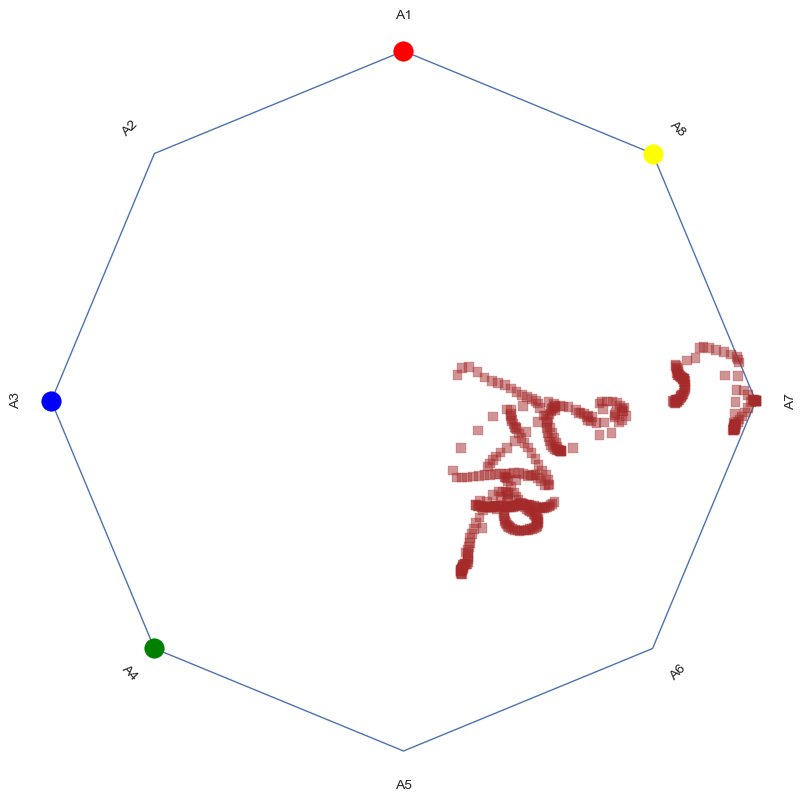

[[ 6.12323400e-17  1.00000000e+00]
 [-7.07106781e-01  7.07106781e-01]
 [-1.00000000e+00  1.22464680e-16]
 [-7.07106781e-01 -7.07106781e-01]
 [-1.83697020e-16 -1.00000000e+00]
 [ 7.07106781e-01 -7.07106781e-01]
 [ 1.00000000e+00 -2.44929360e-16]
 [ 7.07106781e-01  7.07106781e-01]]


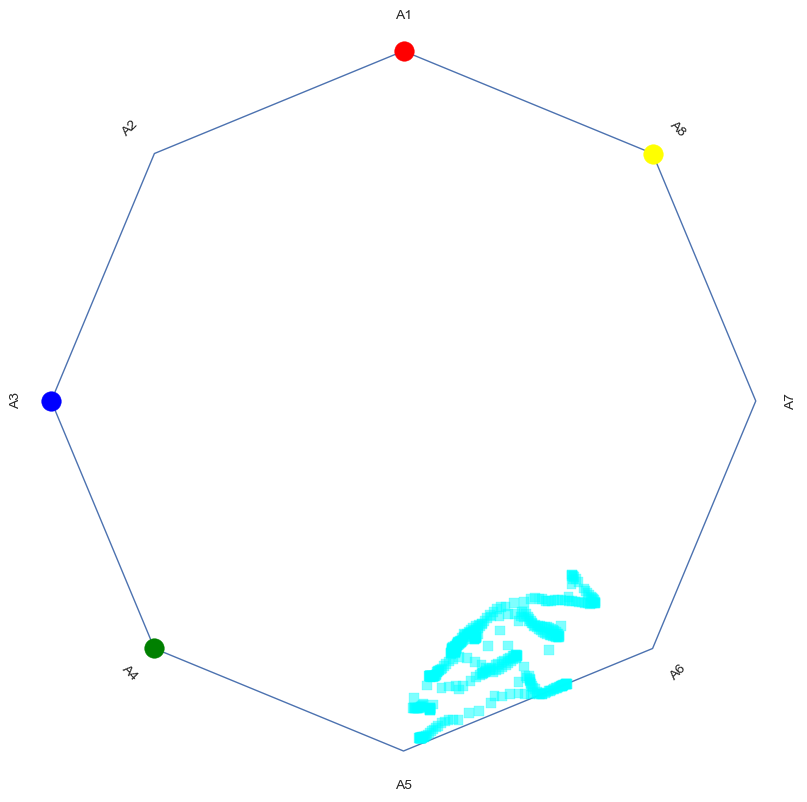

[[ 6.12323400e-17  1.00000000e+00]
 [-7.07106781e-01  7.07106781e-01]
 [-1.00000000e+00  1.22464680e-16]
 [-7.07106781e-01 -7.07106781e-01]
 [-1.83697020e-16 -1.00000000e+00]
 [ 7.07106781e-01 -7.07106781e-01]
 [ 1.00000000e+00 -2.44929360e-16]
 [ 7.07106781e-01  7.07106781e-01]]


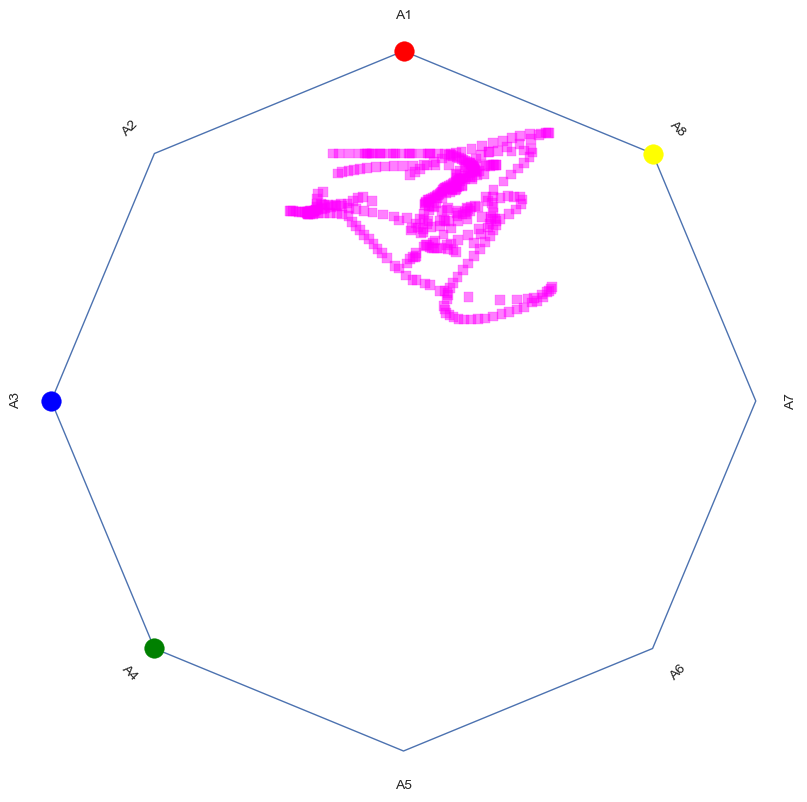

[[ 6.12323400e-17  1.00000000e+00]
 [-7.07106781e-01  7.07106781e-01]
 [-1.00000000e+00  1.22464680e-16]
 [-7.07106781e-01 -7.07106781e-01]
 [-1.83697020e-16 -1.00000000e+00]
 [ 7.07106781e-01 -7.07106781e-01]
 [ 1.00000000e+00 -2.44929360e-16]
 [ 7.07106781e-01  7.07106781e-01]]


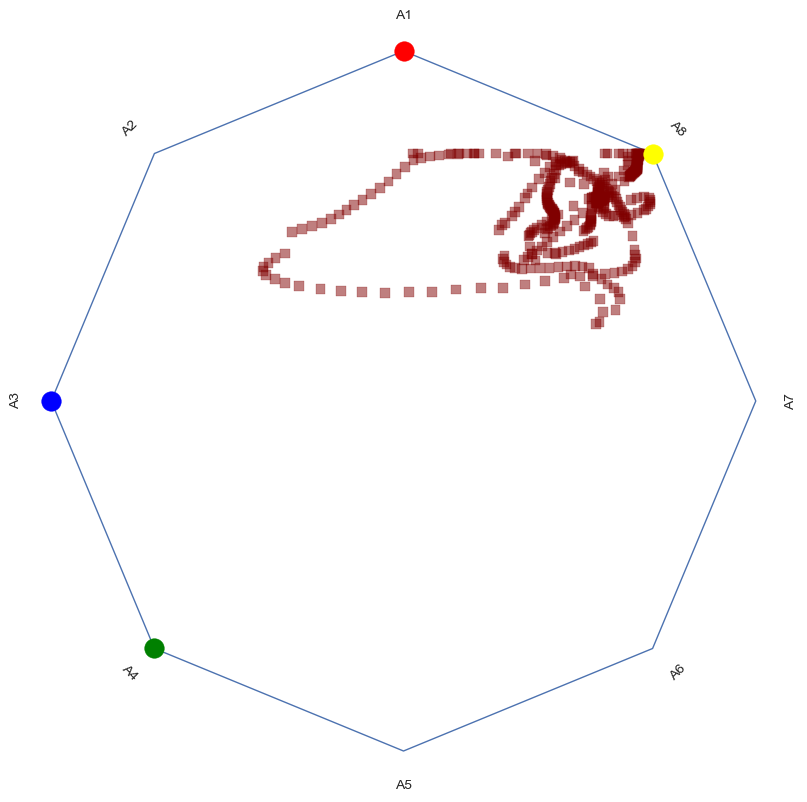

[[ 6.12323400e-17  1.00000000e+00]
 [-7.07106781e-01  7.07106781e-01]
 [-1.00000000e+00  1.22464680e-16]
 [-7.07106781e-01 -7.07106781e-01]
 [-1.83697020e-16 -1.00000000e+00]
 [ 7.07106781e-01 -7.07106781e-01]
 [ 1.00000000e+00 -2.44929360e-16]
 [ 7.07106781e-01  7.07106781e-01]]


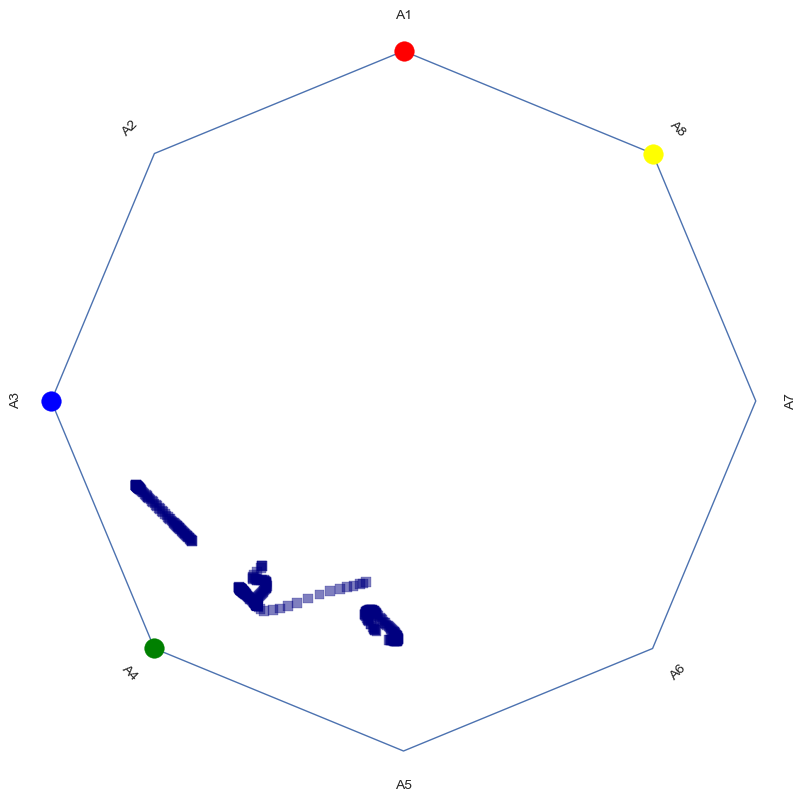

[[ 6.12323400e-17  1.00000000e+00]
 [-7.07106781e-01  7.07106781e-01]
 [-1.00000000e+00  1.22464680e-16]
 [-7.07106781e-01 -7.07106781e-01]
 [-1.83697020e-16 -1.00000000e+00]
 [ 7.07106781e-01 -7.07106781e-01]
 [ 1.00000000e+00 -2.44929360e-16]
 [ 7.07106781e-01  7.07106781e-01]]


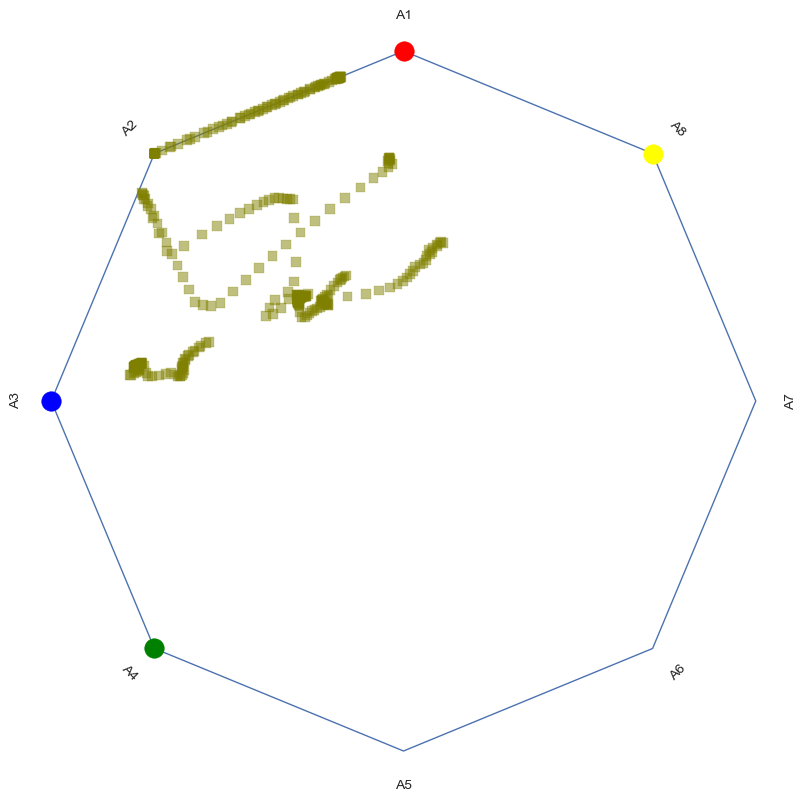

[[ 6.12323400e-17  1.00000000e+00]
 [-7.07106781e-01  7.07106781e-01]
 [-1.00000000e+00  1.22464680e-16]
 [-7.07106781e-01 -7.07106781e-01]
 [-1.83697020e-16 -1.00000000e+00]
 [ 7.07106781e-01 -7.07106781e-01]
 [ 1.00000000e+00 -2.44929360e-16]
 [ 7.07106781e-01  7.07106781e-01]]


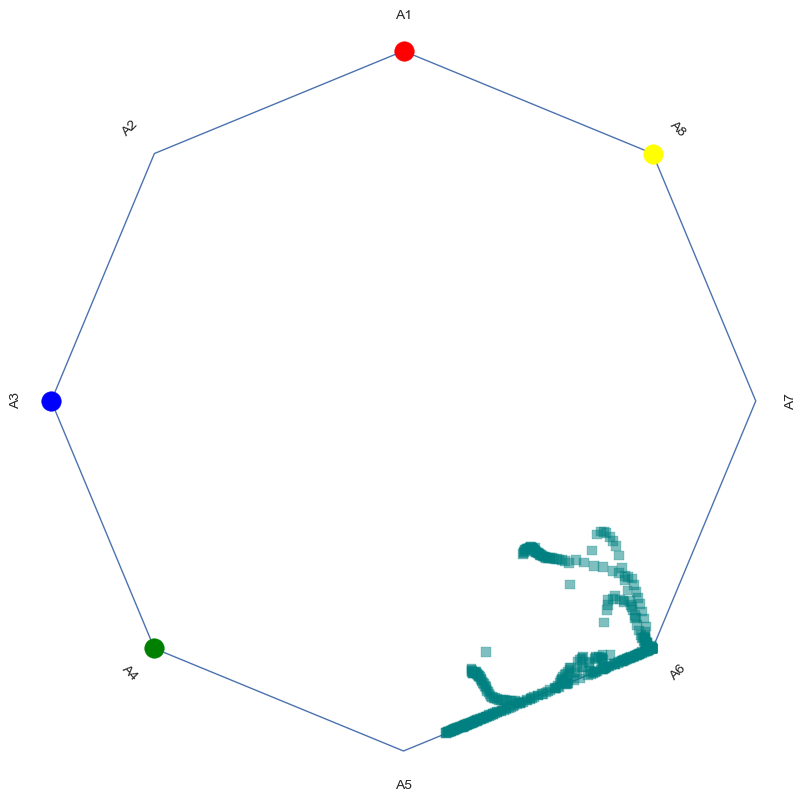

[[ 6.12323400e-17  1.00000000e+00]
 [-7.07106781e-01  7.07106781e-01]
 [-1.00000000e+00  1.22464680e-16]
 [-7.07106781e-01 -7.07106781e-01]
 [-1.83697020e-16 -1.00000000e+00]
 [ 7.07106781e-01 -7.07106781e-01]
 [ 1.00000000e+00 -2.44929360e-16]
 [ 7.07106781e-01  7.07106781e-01]]


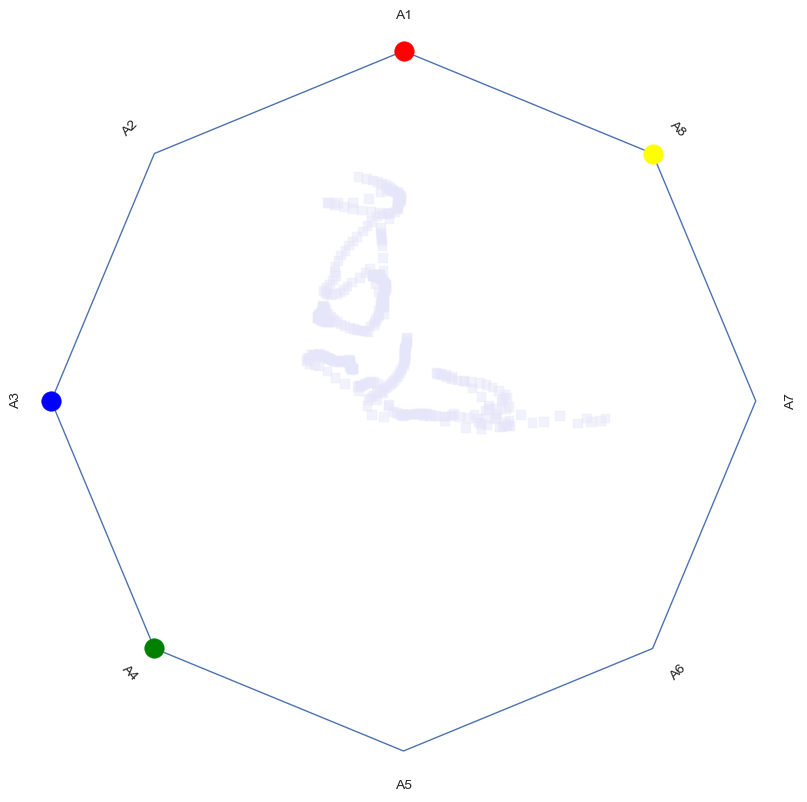

[[ 6.12323400e-17  1.00000000e+00]
 [-7.07106781e-01  7.07106781e-01]
 [-1.00000000e+00  1.22464680e-16]
 [-7.07106781e-01 -7.07106781e-01]
 [-1.83697020e-16 -1.00000000e+00]
 [ 7.07106781e-01 -7.07106781e-01]
 [ 1.00000000e+00 -2.44929360e-16]
 [ 7.07106781e-01  7.07106781e-01]]


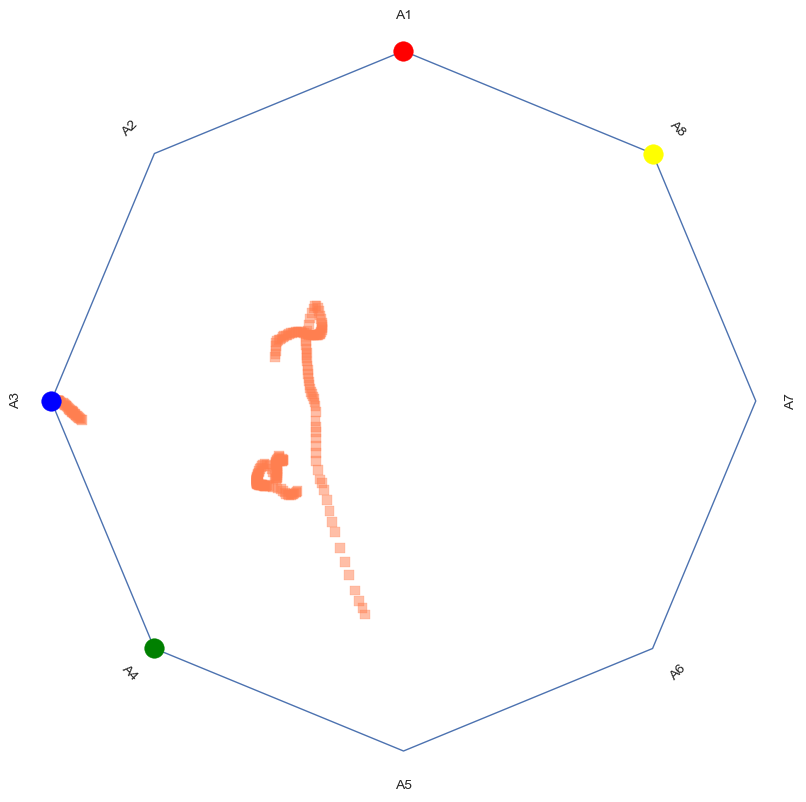

------------------


In [62]:
# lst_feat = ['C' + str(i) for i in range(1,291+1)]

# sc = StandardScaler()
# X = level1_df[lst_feat].values #Using level1_df here
# X_scaled = sc.fit_transform(X)

# AA_list_level1=[]
# lst_exp_var_level1 = []
# for i in range(3,9):
#     AA = ArchetypalAnalysis(n_archetypes = i, 
#                             tolerance = 0.001, 
#                             max_iter = 200, 
#                             random_state = 0, 
#                             C = 0.0001, 
#                             initialize = 'random',
#                             redundancy_try = 30)
#     AA.fit(X_scaled)
#     AA_list_level1.append(AA)
#     lst_exp_var_level1.append(AA.explained_variance_)
    
# #explained variance
# n_archs = list(range(3, 9))
# plt.style.use('seaborn')
# plt.plot(n_archs, lst_exp_var_level1, '-o')
# plt.xlabel('Number of Archetypes')
# plt.ylabel('Explained Variance')
# plt.show()

#coloring - Location
colors = ['Red', 'Blue', 'Green', 'Yellow', 'Orange', 'Purple', 'Pink', 'Brown', 'Cyan', 'Magenta', 'Maroon', 'Navy', 'Olive', 'Teal', 'Lavender', 'Coral']
df_args = level1_df[['location']].copy()
df_args['color'] = colors[0]
uniq_locations = df_args['location'].unique()
color_dict = {location: color for location, color in zip(uniq_locations, colors)}
df_args['color'] = df_args['location'].map(color_dict)
plot_args = {'color': df_args['color']}
color_dict = {location: color for location, color in zip(uniq_locations, colors)}

#simplex plots    
flag = True
arr1 = AA_list_level1[1].archetypes.T
color_indices = []
for AA in AA_list_level1:
    arr2 = AA.archetypes.T
    similarities = cosine_similarity(arr1, arr2)
    sorted_indices = np.argsort(similarities, axis=None)[::-1]
    max_indices = np.unravel_index(sorted_indices, similarities.shape)
    sorted_indices = sorted(zip(max_indices[0][:4], max_indices[1][:4]), key=lambda x: x[0])
    sorted_second_indices = [idx2 for _, idx2 in sorted_indices]
    if flag:
        flag = False
        for location in uniq_locations:
            
            
#             location_indices = level1_df[level1_df['location'] == location].index
            location_indices = [level1_df.index.get_loc(index) for index in level1_df[level1_df['location'] == location].index]

            # Convert indices to numpy array for efficient slicing
            location_indices = np.array(location_indices)

            # Get corresponding columns from alfa
            new_alfa = AA.alfa[:, location_indices]   
            
            plot_args = {'color': [color_dict[location]]*len(location_indices)}
            
            
            plot_simplex(AA.n_archetypes, new_alfa, color_vertex= sorted_second_indices, plot_args=plot_args, grid_on=True, legend_color = color_dict, label = True)
    else:
        for location in uniq_locations:
#             location_indices = level1_df[level1_df['location'] == location].index
            location_indices = [level1_df.index.get_loc(index) for index in level1_df[level1_df['location'] == location].index]

            # Convert indices to numpy array for efficient slicing
            location_indices = np.array(location_indices)

            # Get corresponding columns from alfa
            new_alfa = AA.alfa[:, location_indices]  
            
            plot_args = {'color': [color_dict[location]]*len(location_indices)}
#           
            plot_simplex(AA.n_archetypes, new_alfa, color_vertex= sorted_second_indices, plot_args=plot_args, grid_on=True, legend_color = color_dict, label = False)
    print('------------------')

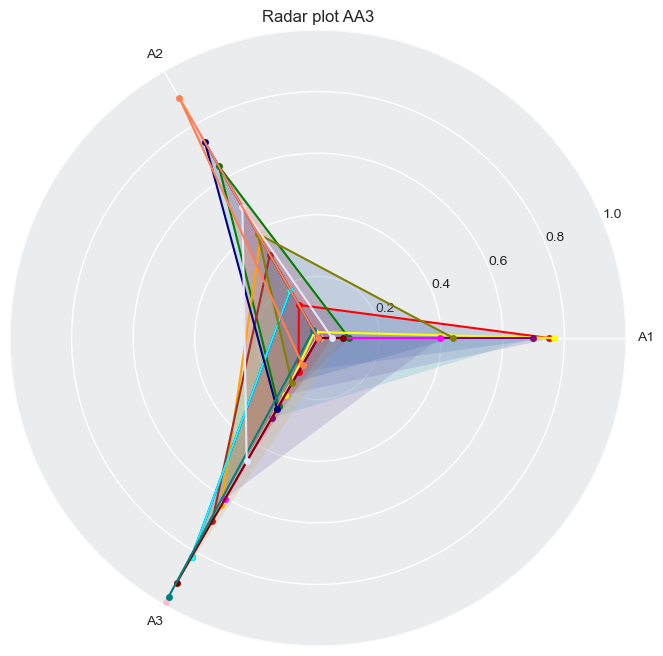

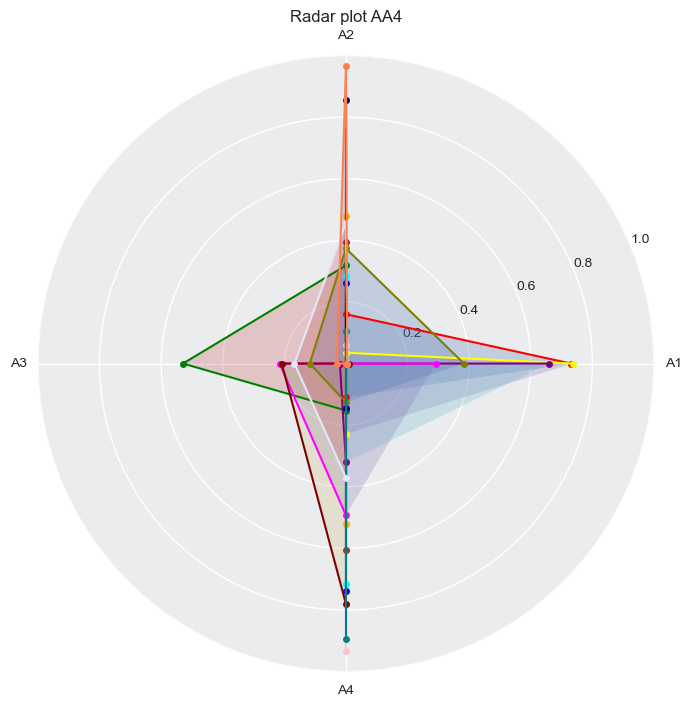

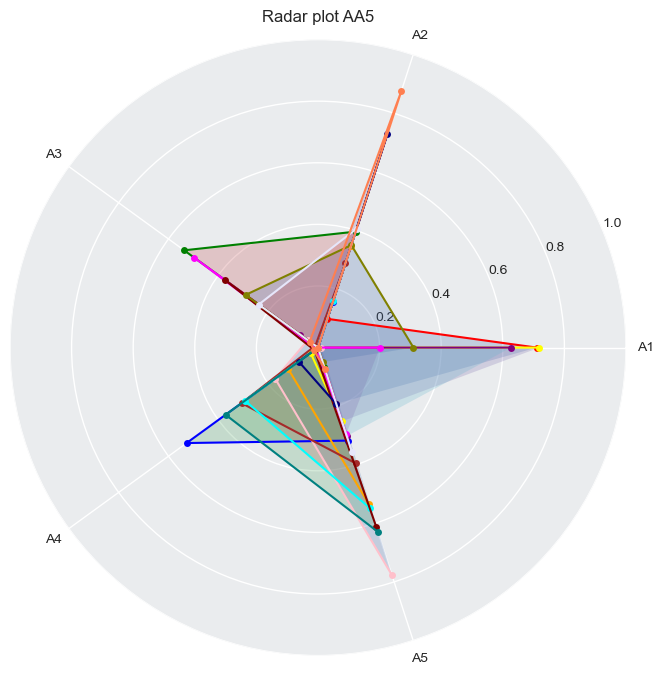

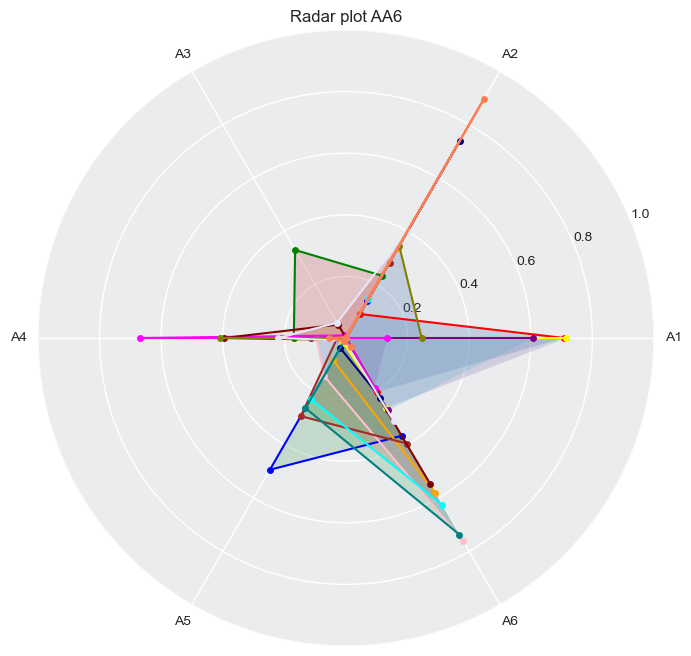

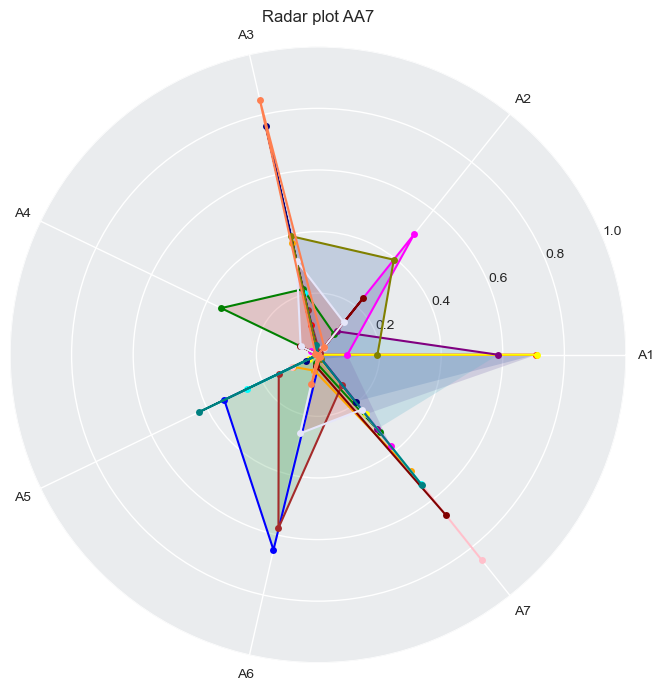

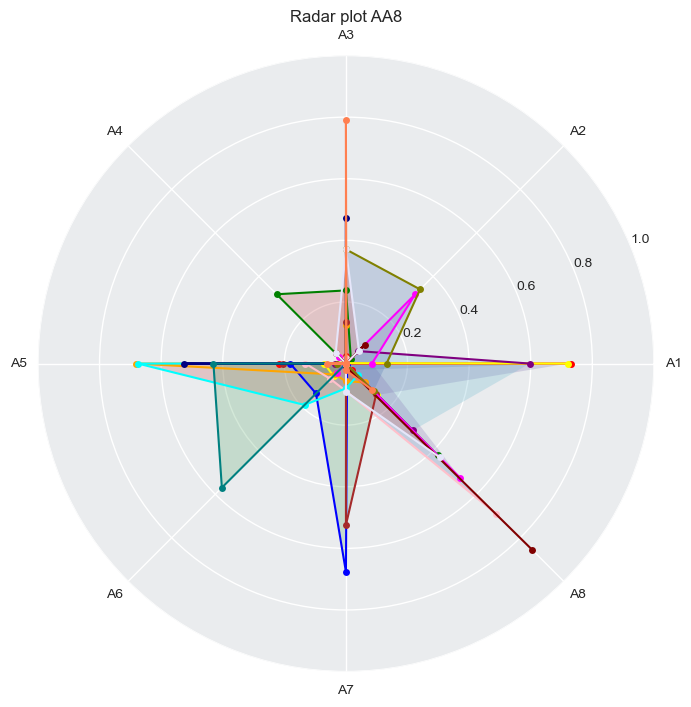

In [31]:
def category_mean(AA, df, column, target_columns, X_scaled):
    
    
    # Get unique categories in the specified column
    categories = df[column].unique()
    
    # Initialize an empty list to store data points
    data_points = {}
    
    # Calculate mean data point for each category
    for i, category in enumerate(categories):
        # Filter the DataFrame based on the category
        subset = df[df[column] == category]
        subset = subset[target_columns]
        indices = [level1_df.index.get_loc(index) for index in level1_df[level1_df[column] == category].index]

        X_scaled_new = X_scaled[indices,:]  
        
        # Calculate mean of the subset for target columns
        mean_values = X_scaled_new.mean(axis=0).reshape(1, -1)
        
        data_points[category] = mean_values
              
    return data_points

def plot_radar_datapoints(AA, X, ax=None, Title='Radar plot of datapoint', category=None):
    if ax is None:
        fig = plt.figure(figsize=(4, 4))
        ax = fig.add_subplot(111, polar=True)
    else:
        fig = ax.get_figure()

    _, alfa_X = AA.transform(X)
    
    labels = ['A' + str(i+1) for i in range(AA.n_archetypes)]
    angles = np.linspace(0, 2*np.pi, AA.n_archetypes, endpoint=False)
    if category:
        ax.plot(angles, alfa_X, 'o-', markersize=5, linewidth=1.5, color = location_color[category])#color='#273746')
    else:
        ax.plot(angles, alfa_X, 'o-', markersize=5, linewidth=1.5, color='#273746')
    ax.fill(angles, alfa_X, alpha=0.25)
    ax.set_thetagrids(np.array(angles) * 180.0/np.pi, labels)
    ax.set_title(Title)
    ax.grid(True)
    ax.set_rlim(0, 1)
    ax.set_facecolor('#EAECEE')
    
    return ax

# Example usage:
lst_feat = ['C' + str(i) for i in range(1,291+1)]
sc = StandardScaler()
X = level1_df[lst_feat].values #Using level1_df here
X_scaled = sc.fit_transform(X)
location_color = {location: color for location, color in zip(uniq_locations, colors)}

for AA in AA_list_level1:
    data_points = category_mean(AA, level1_df, 'location', ['C' + str(i) for i in range(1,291+1)], X_scaled)


    # Example usage:
    # Create the initial figure and axis
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, polar=True)

    for category, data_point in data_points.items():
        plot_radar_datapoints(AA, data_point, ax=ax, Title='Radar plot AA'+str(AA.n_archetypes), category = category)

    plt.show()

Ocean


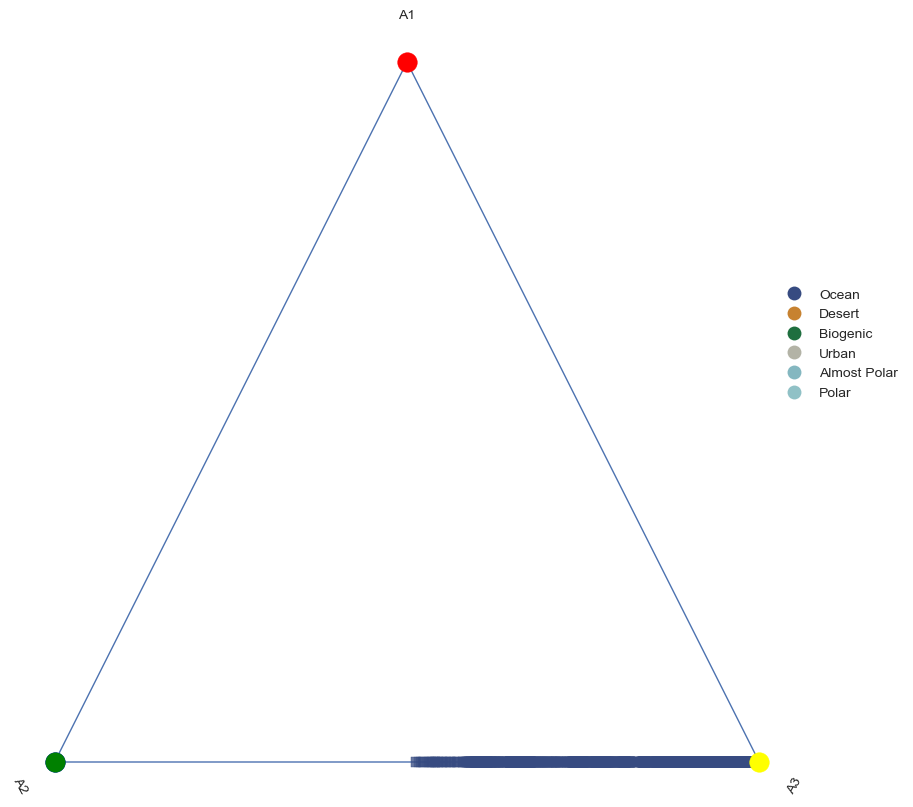

Desert


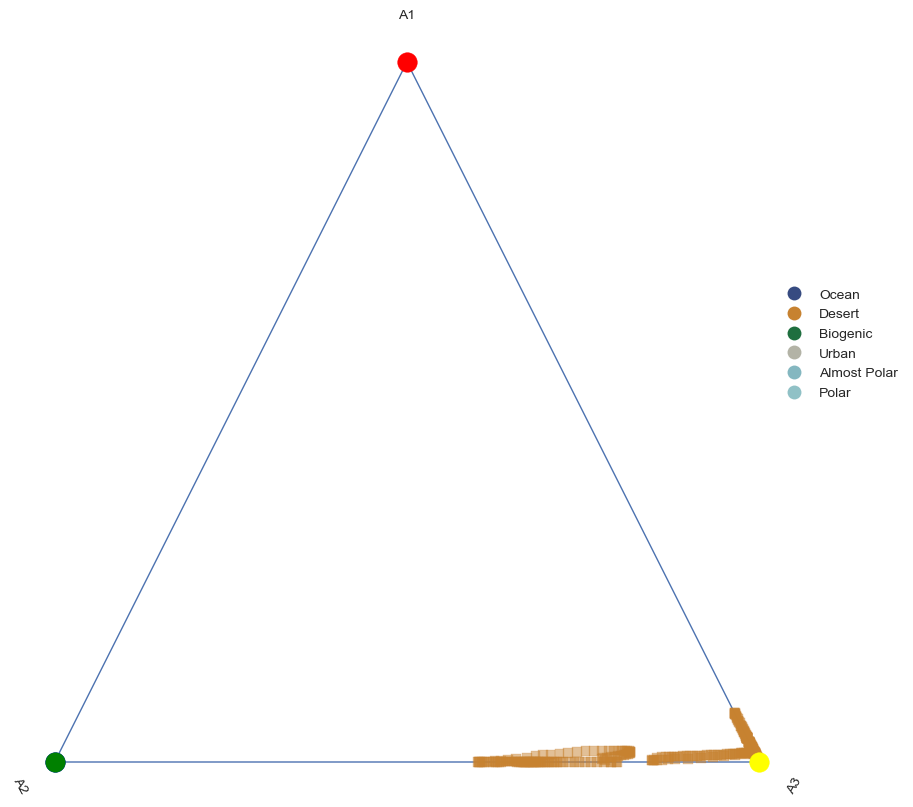

Biogenic


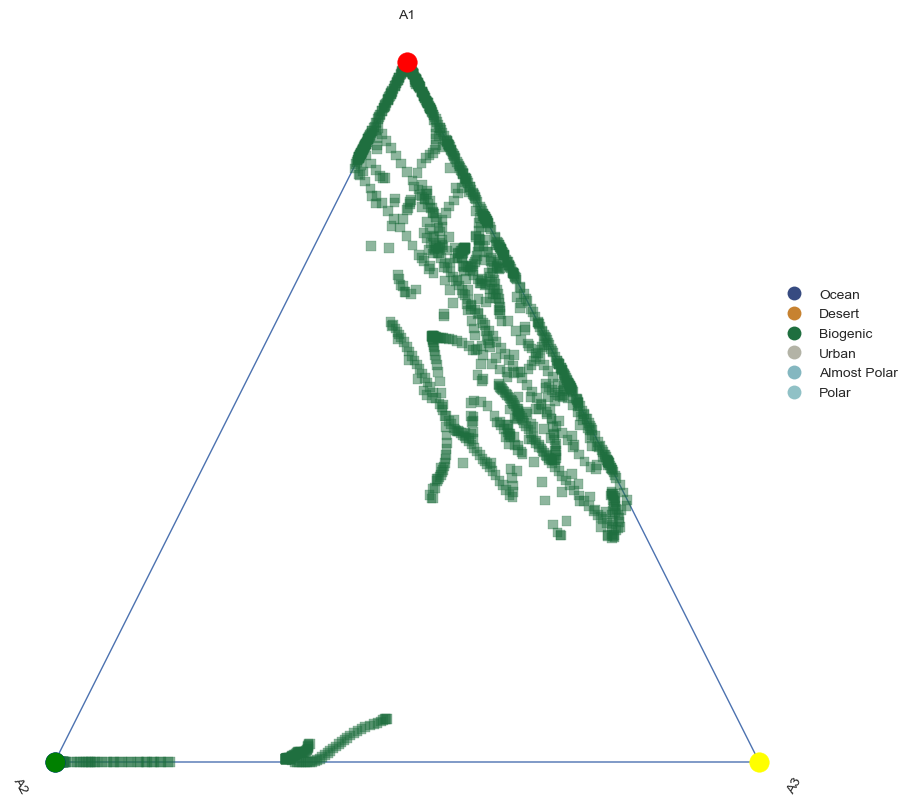

Urban


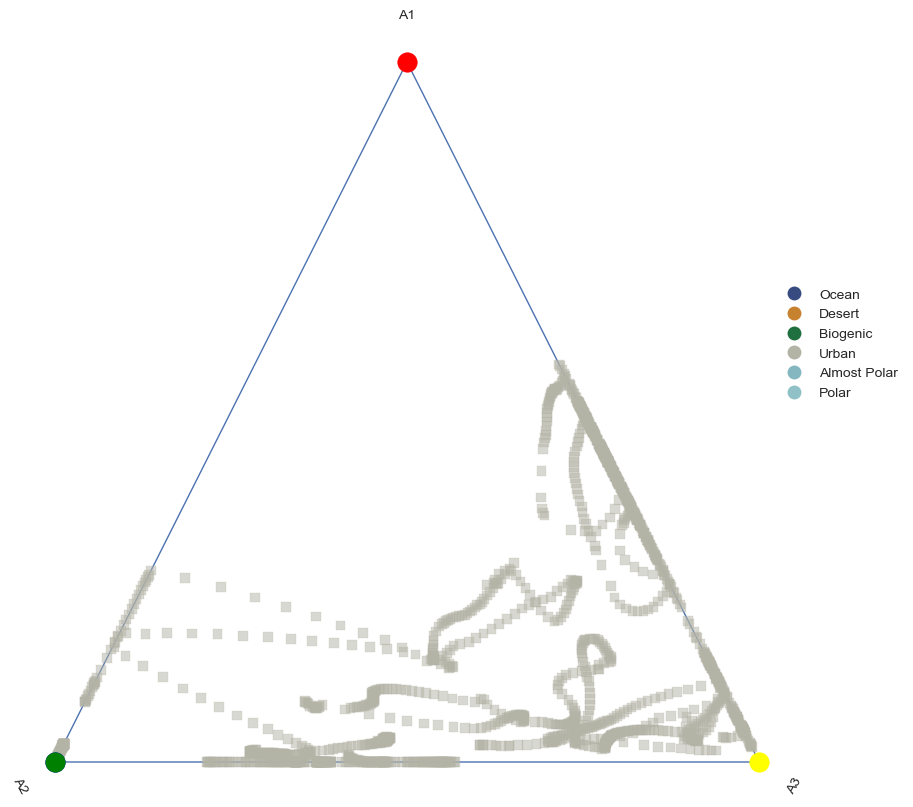

Almost Polar


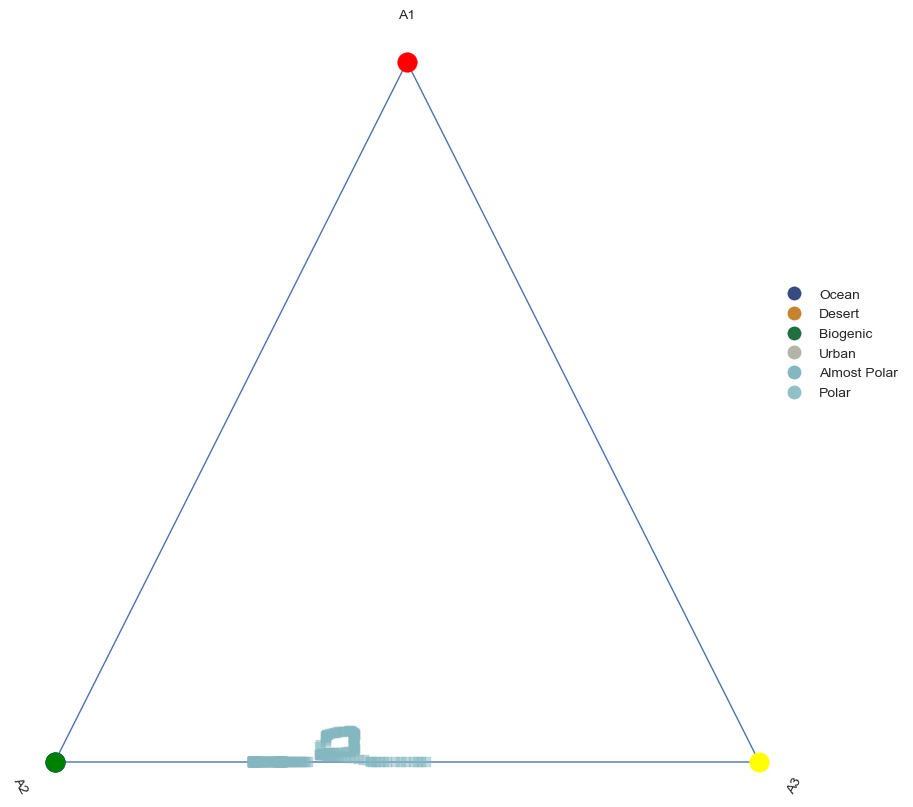

Polar


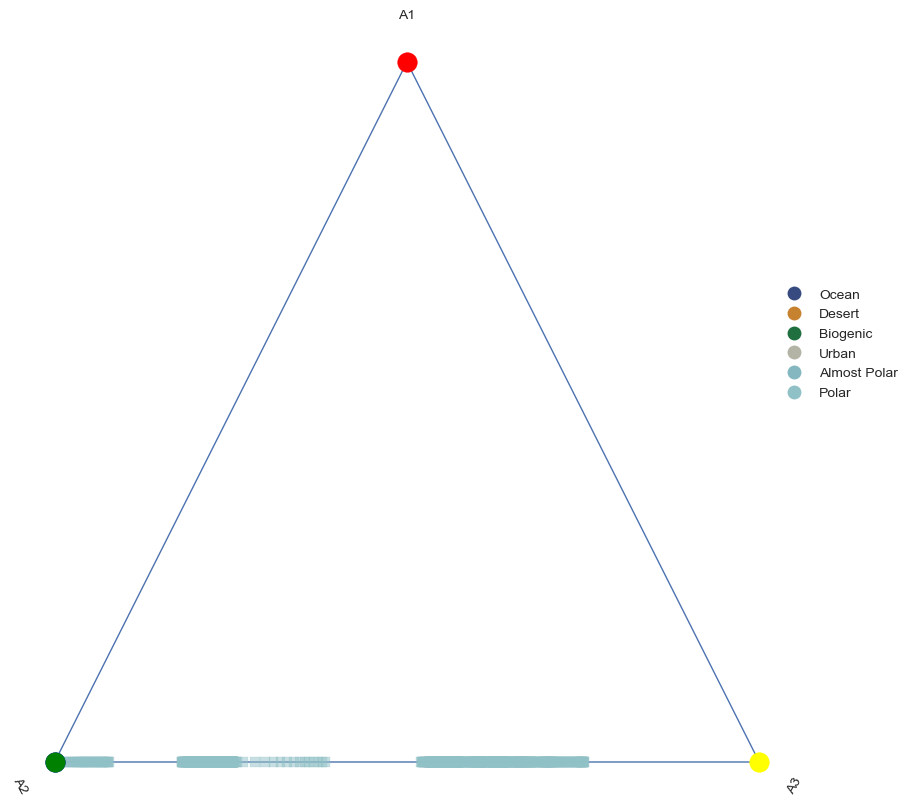

------------------
Ocean


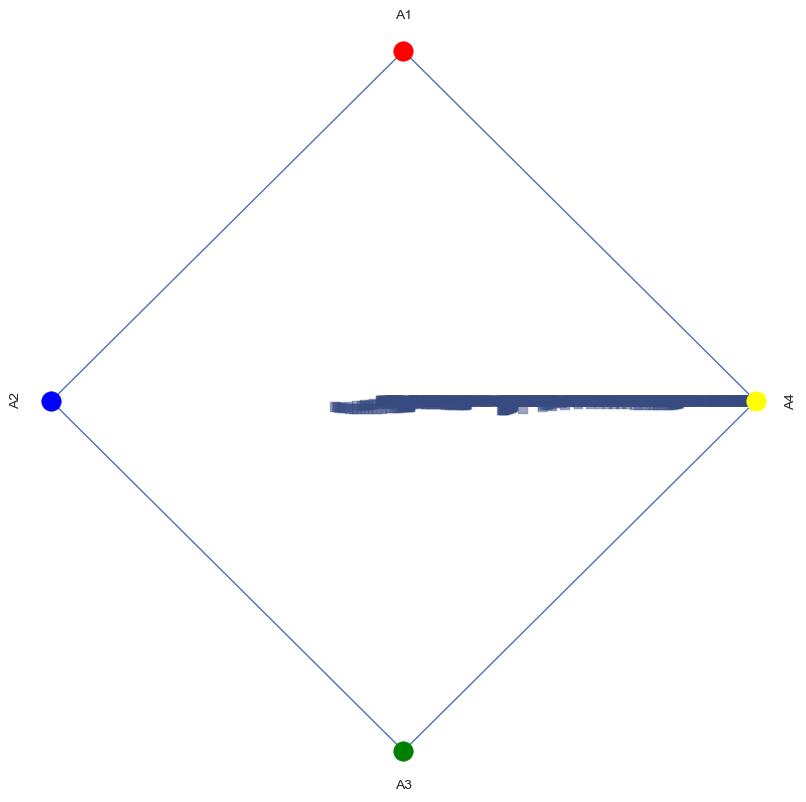

Desert


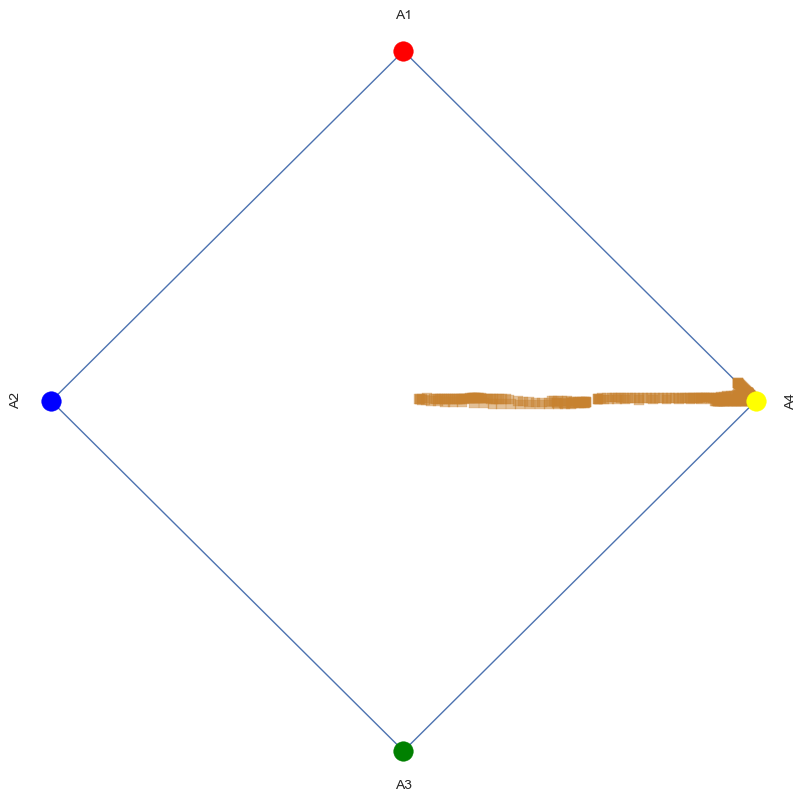

Biogenic


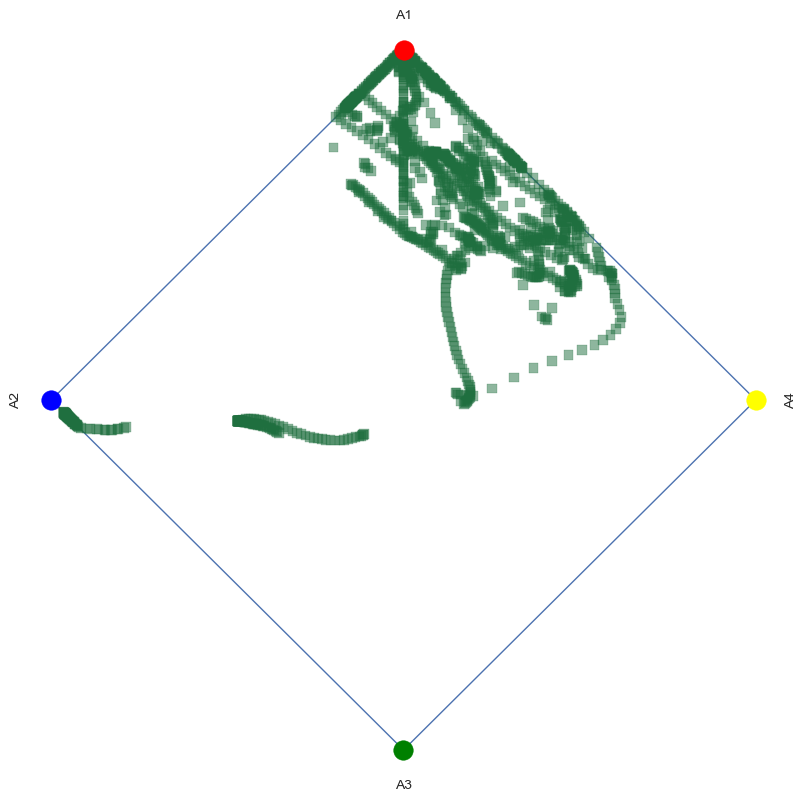

Urban


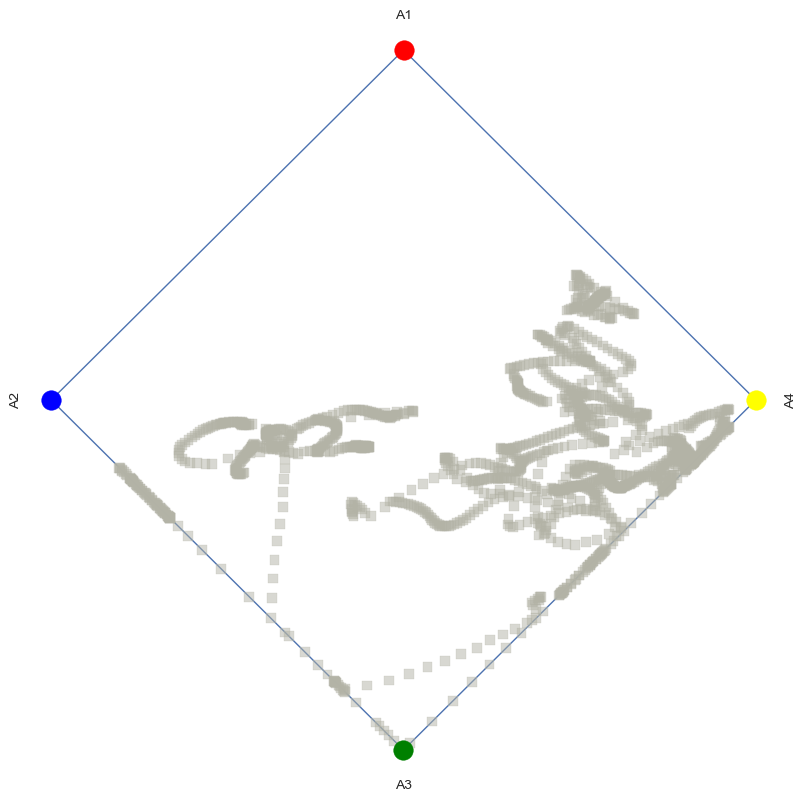

Almost Polar


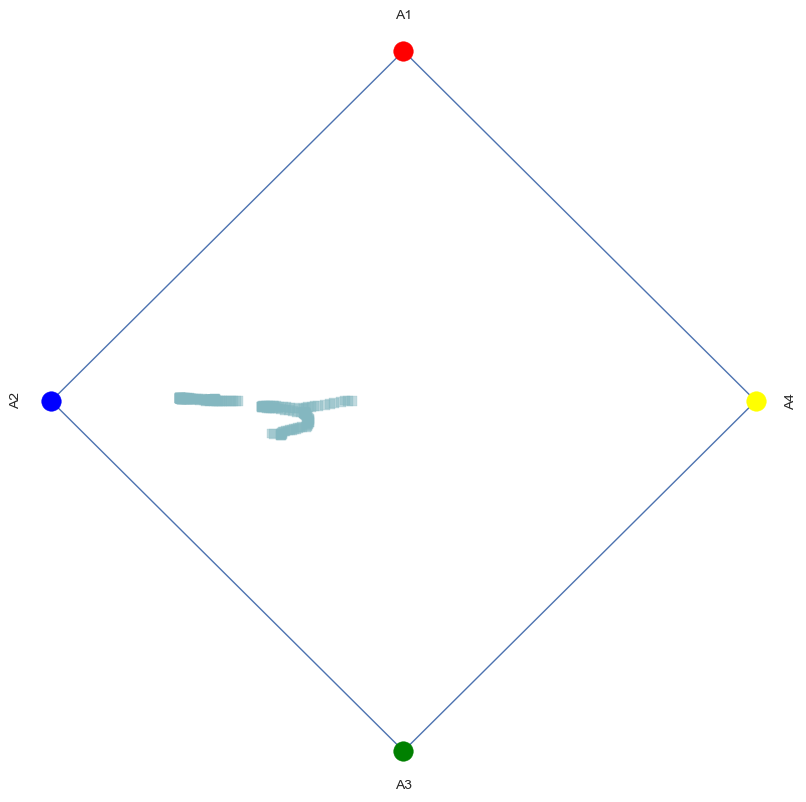

Polar


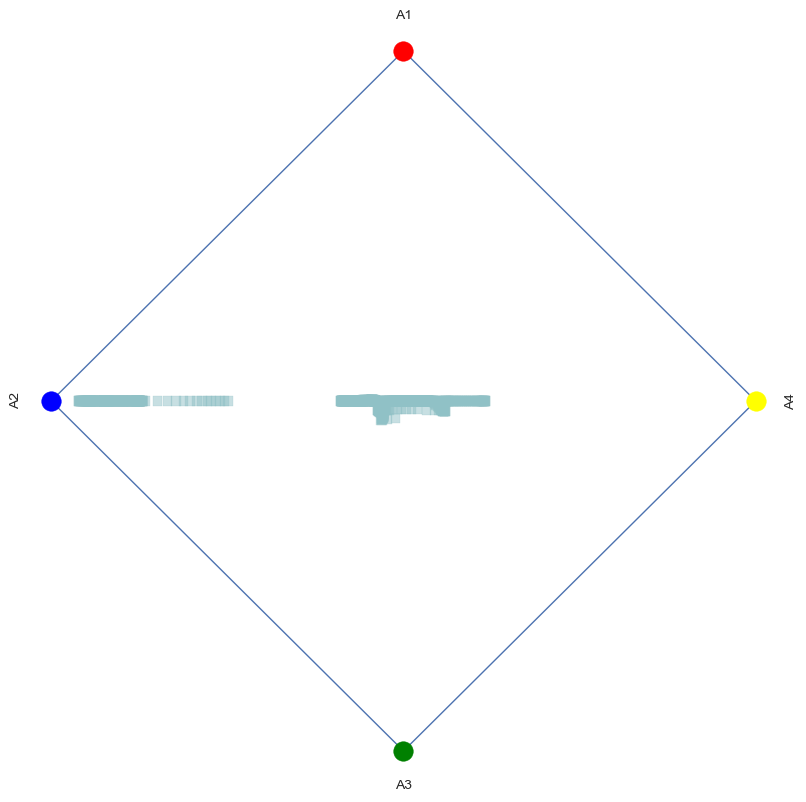

------------------
Ocean


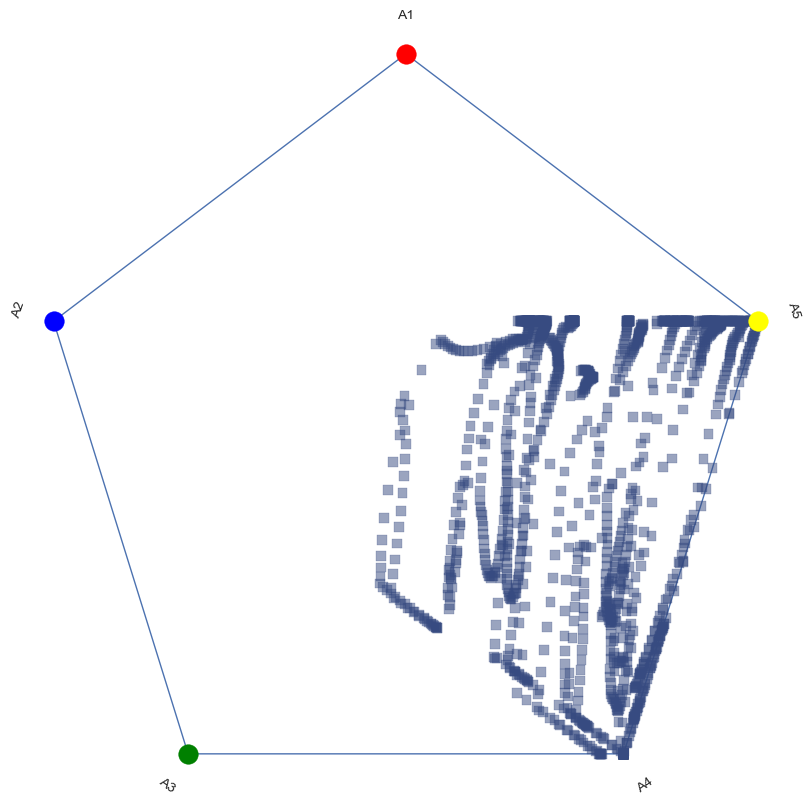

Desert


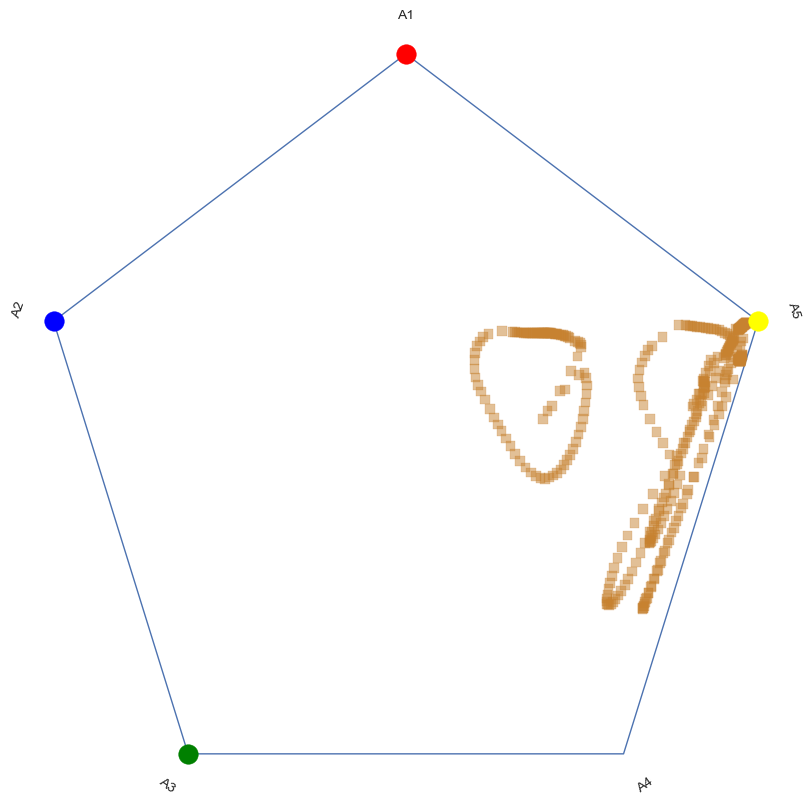

Biogenic


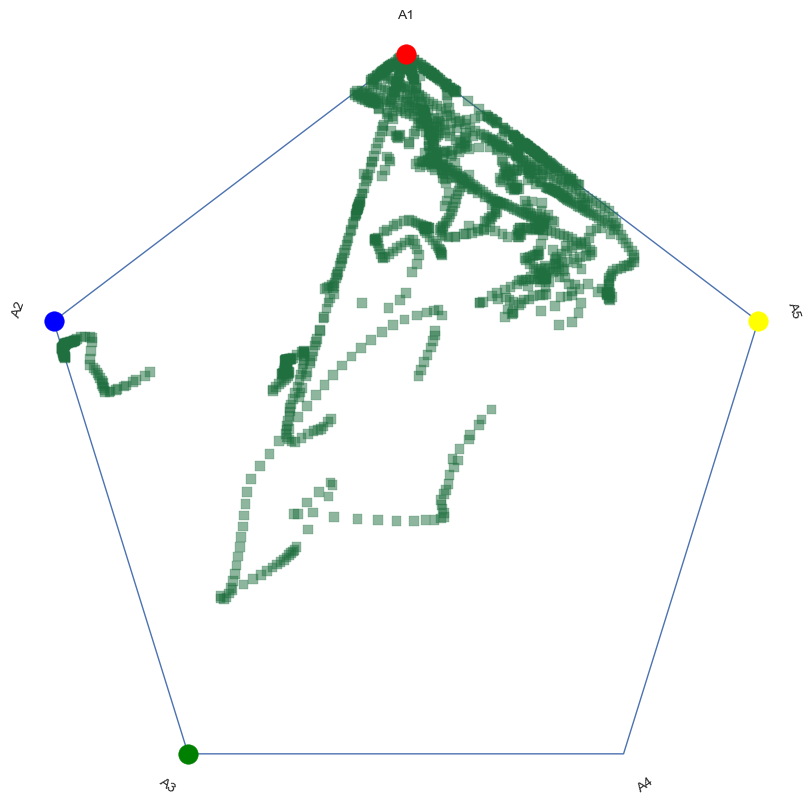

Urban


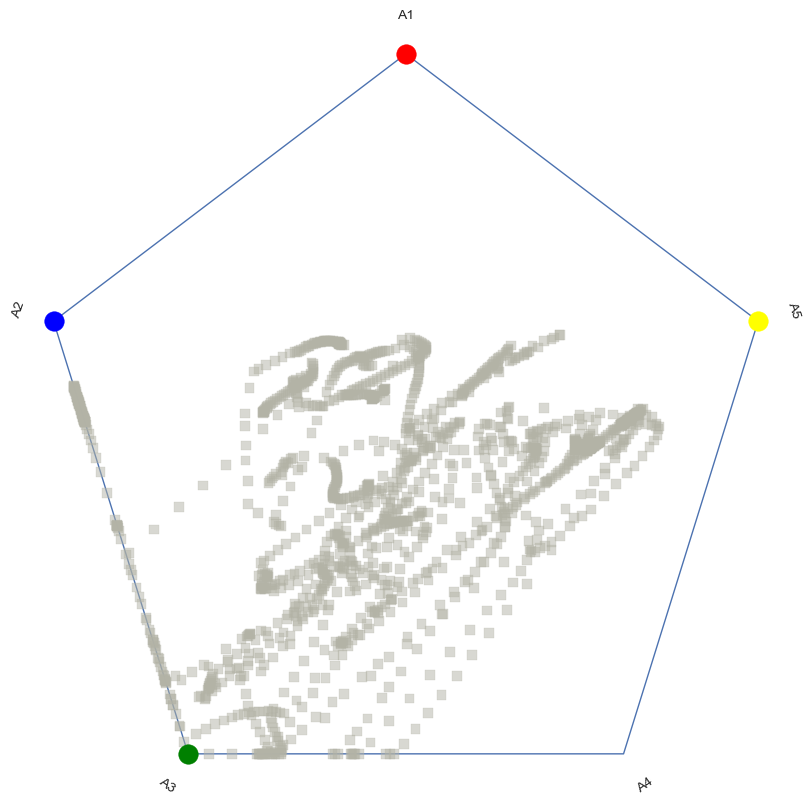

Almost Polar


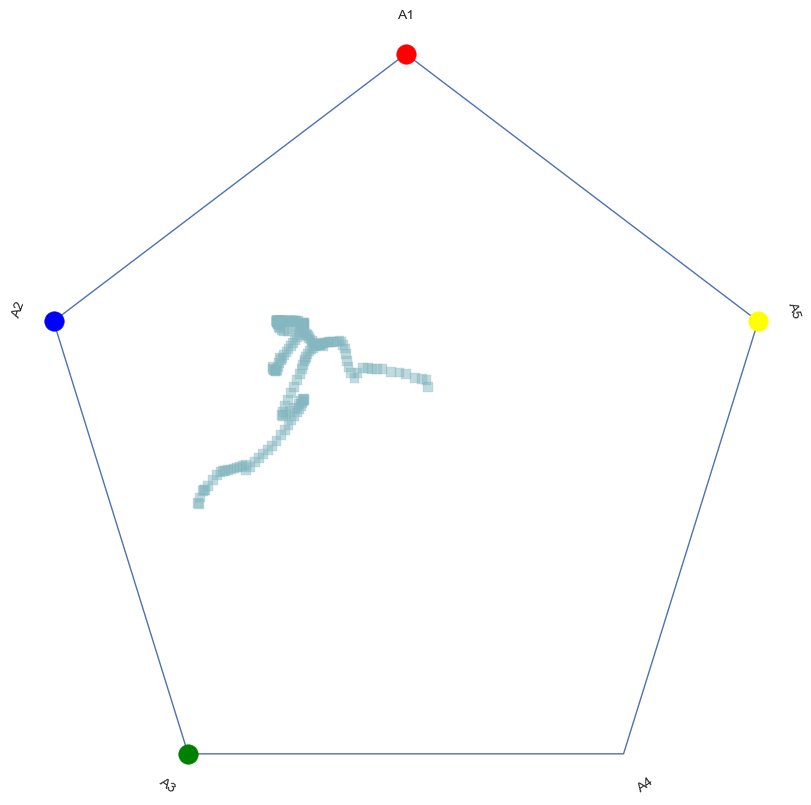

Polar


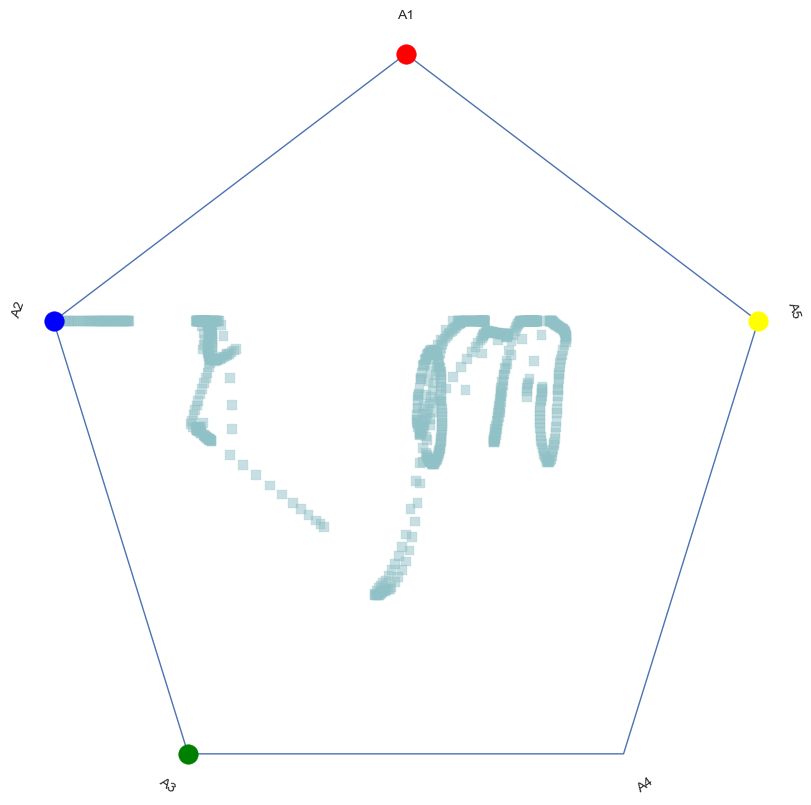

------------------
Ocean


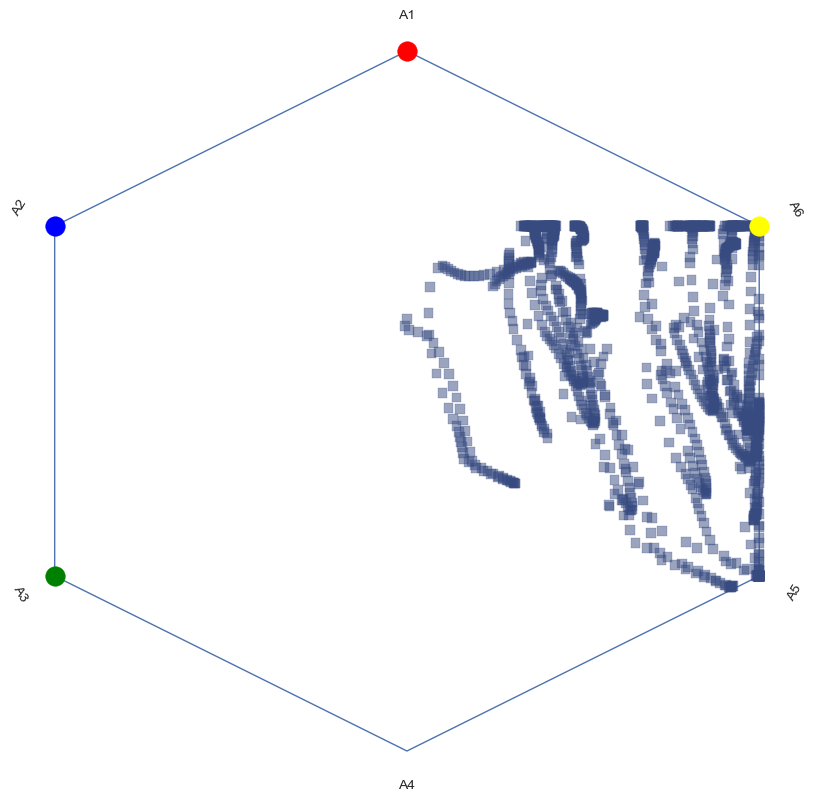

Desert


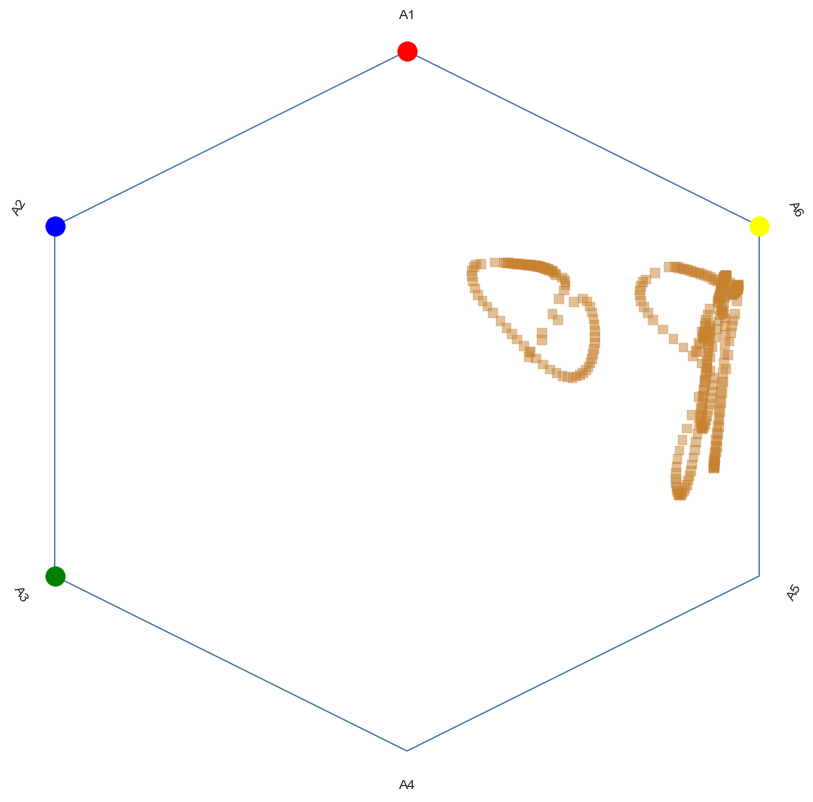

Biogenic


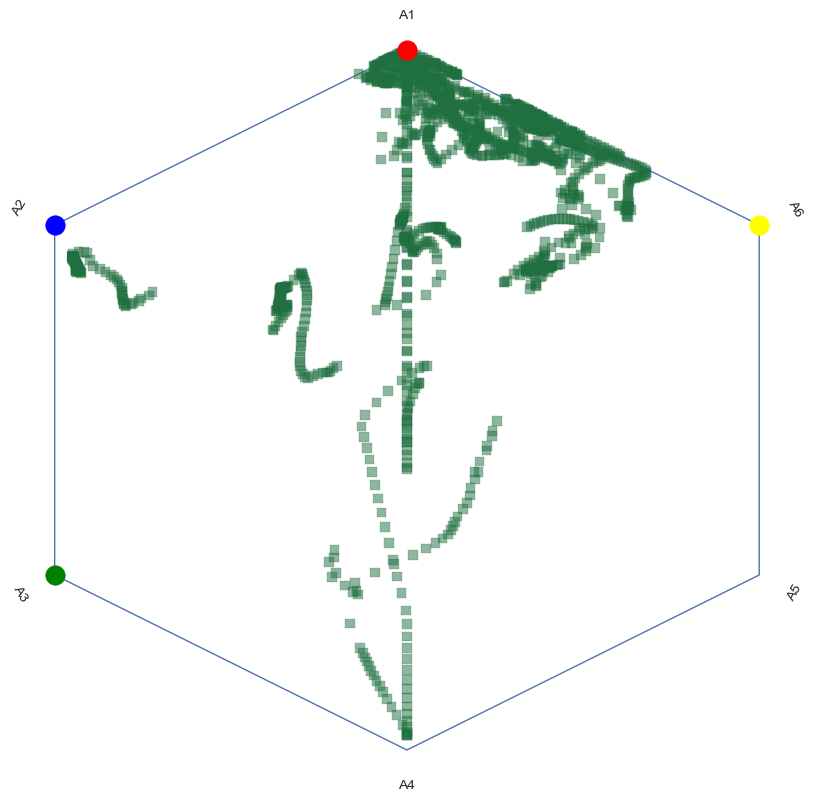

Urban


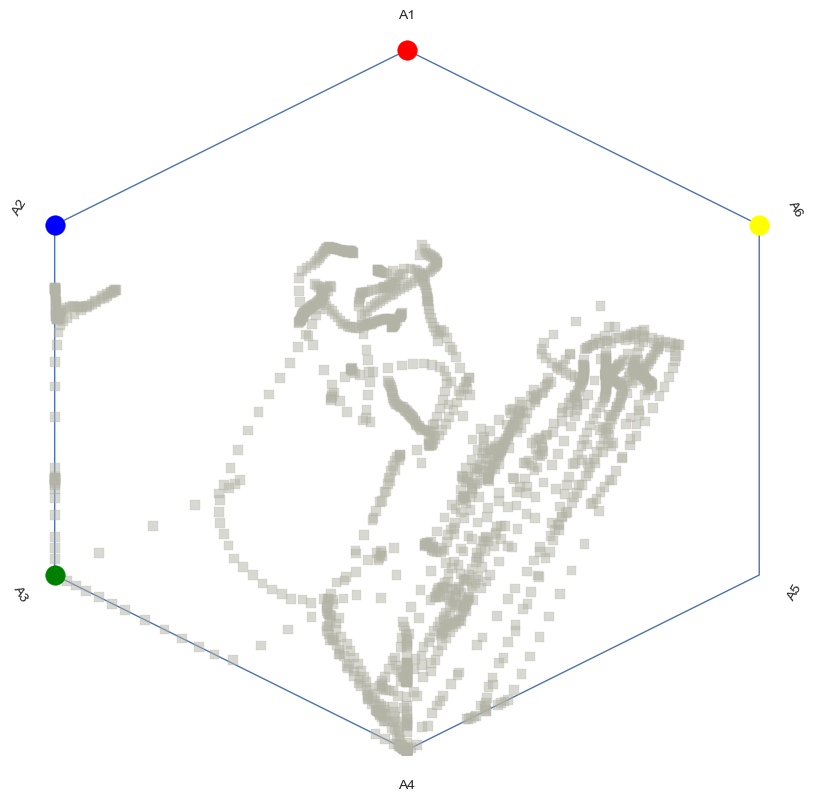

Almost Polar


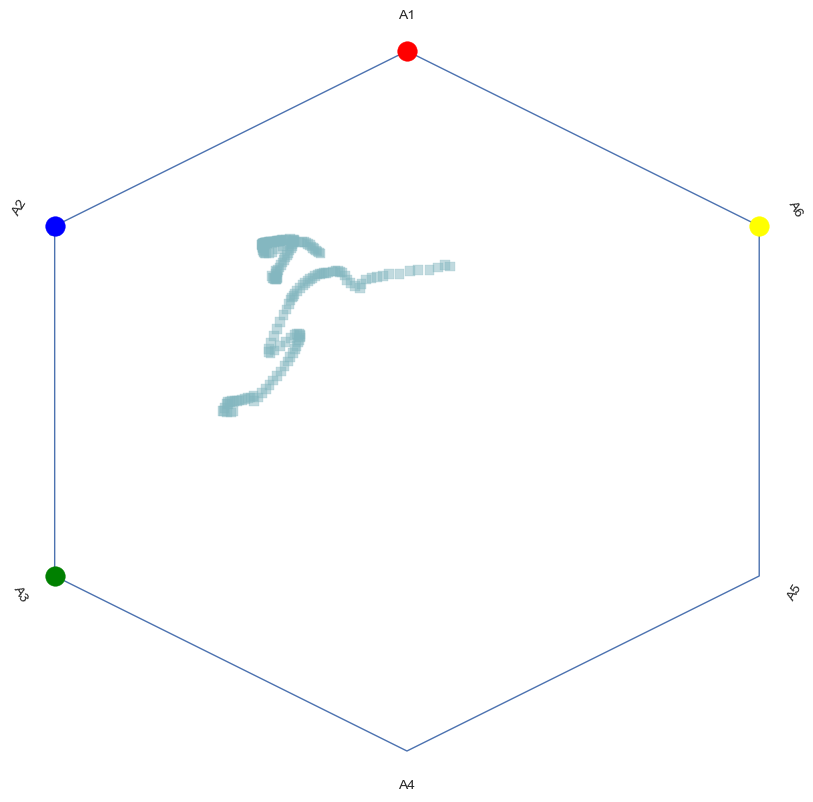

Polar


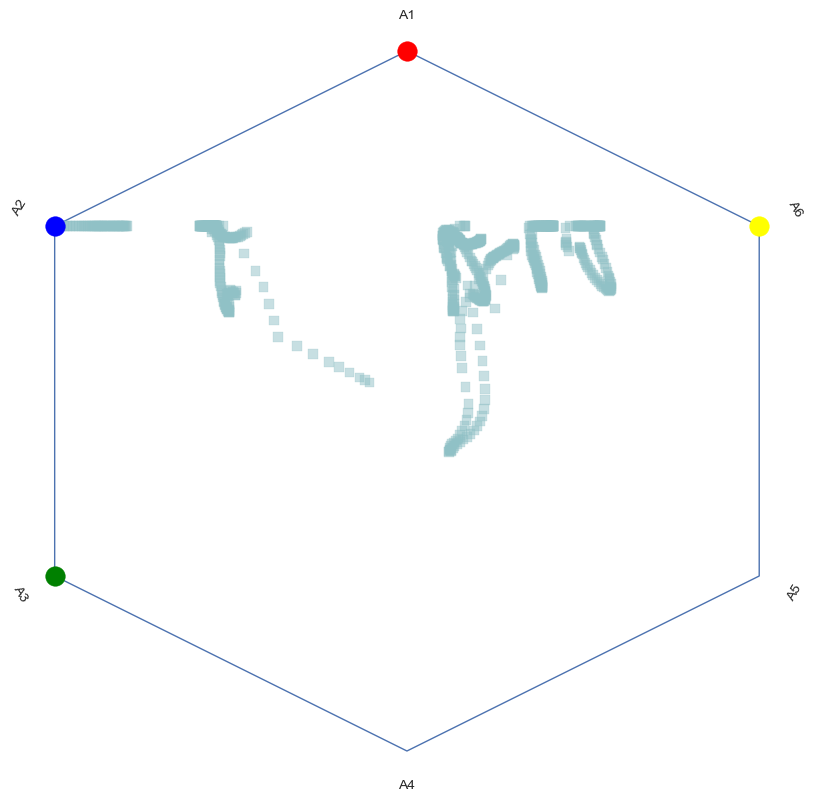

------------------
Ocean


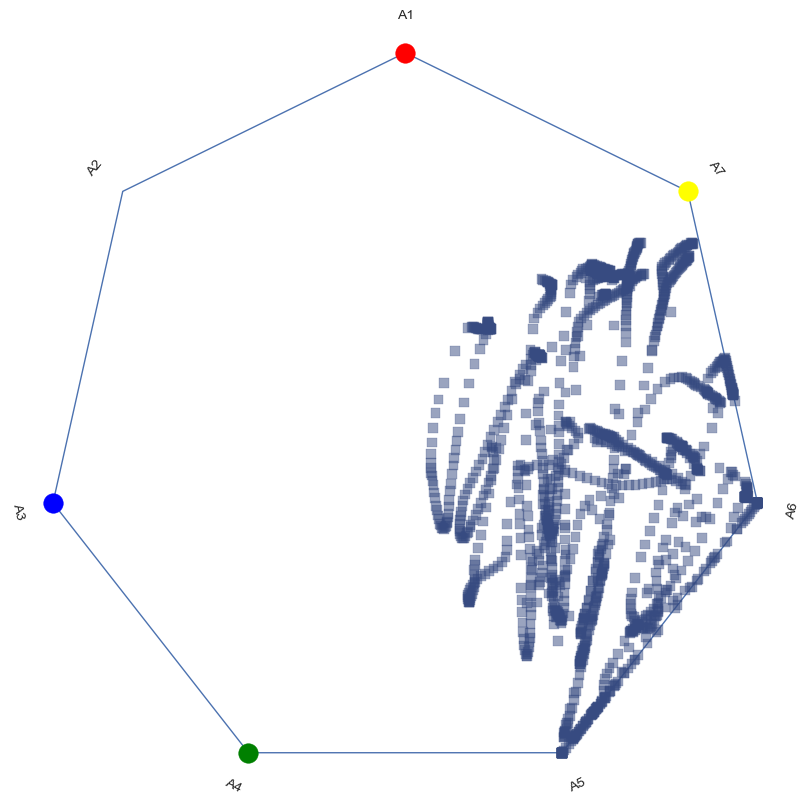

Desert


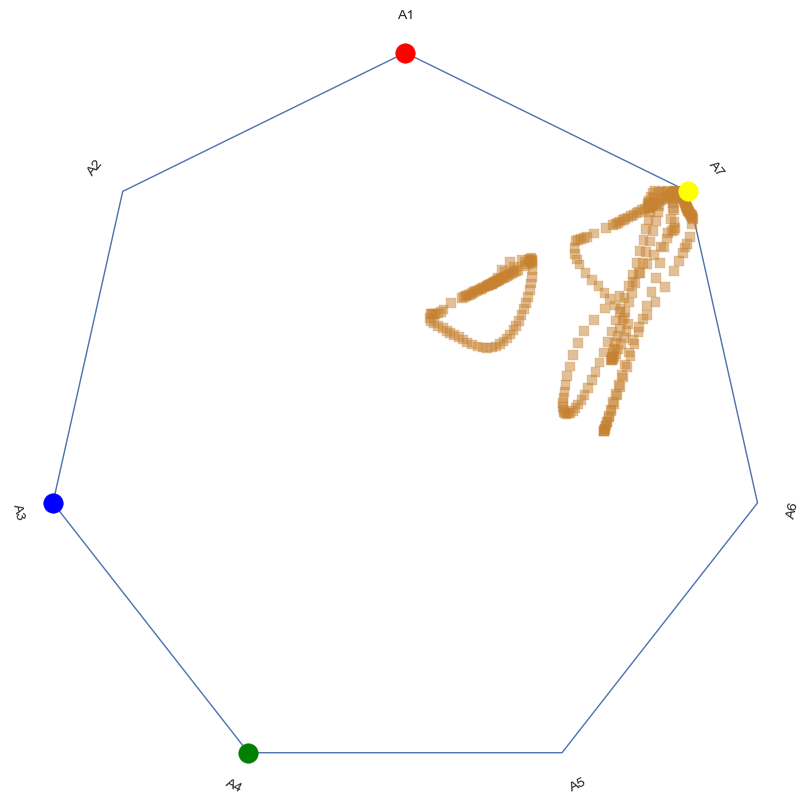

Biogenic


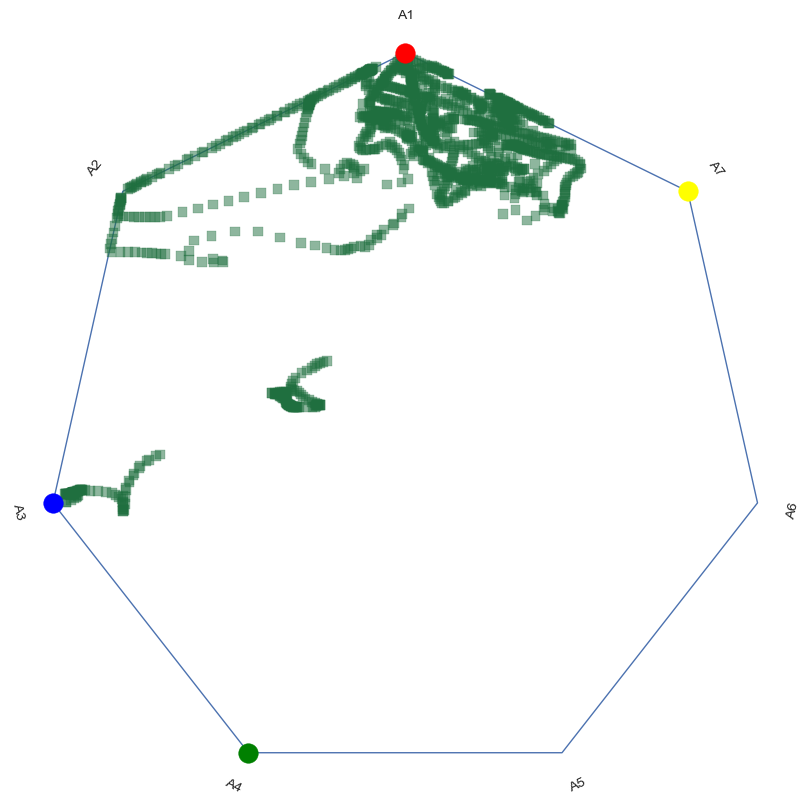

Urban


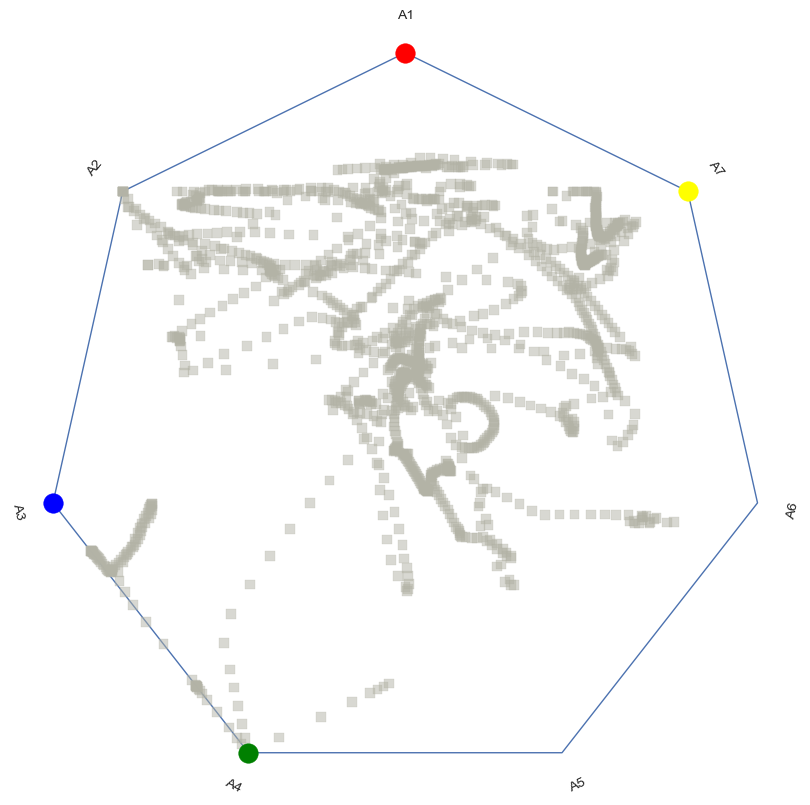

Almost Polar


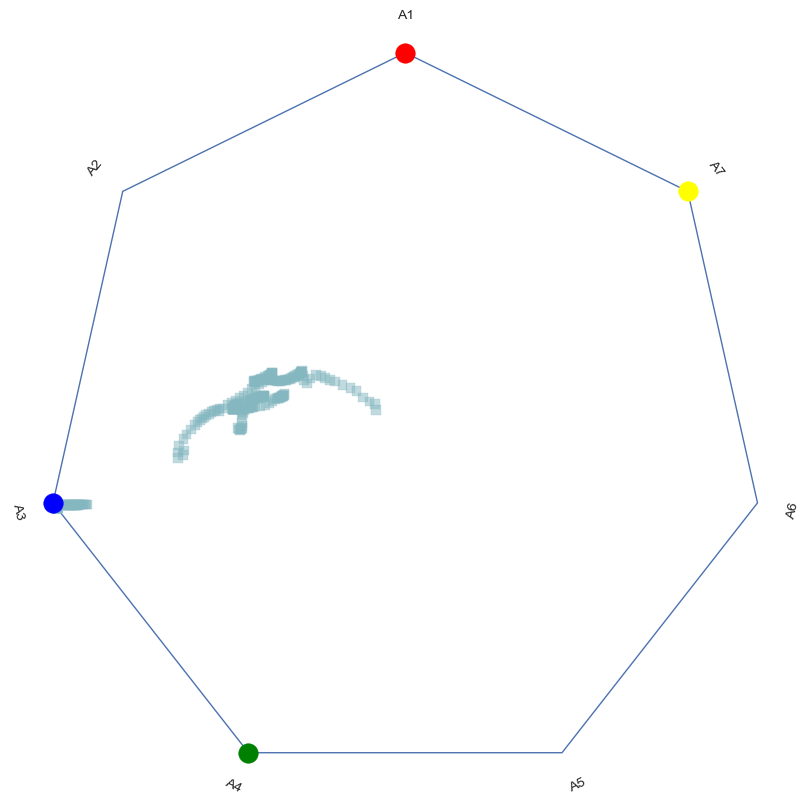

Polar


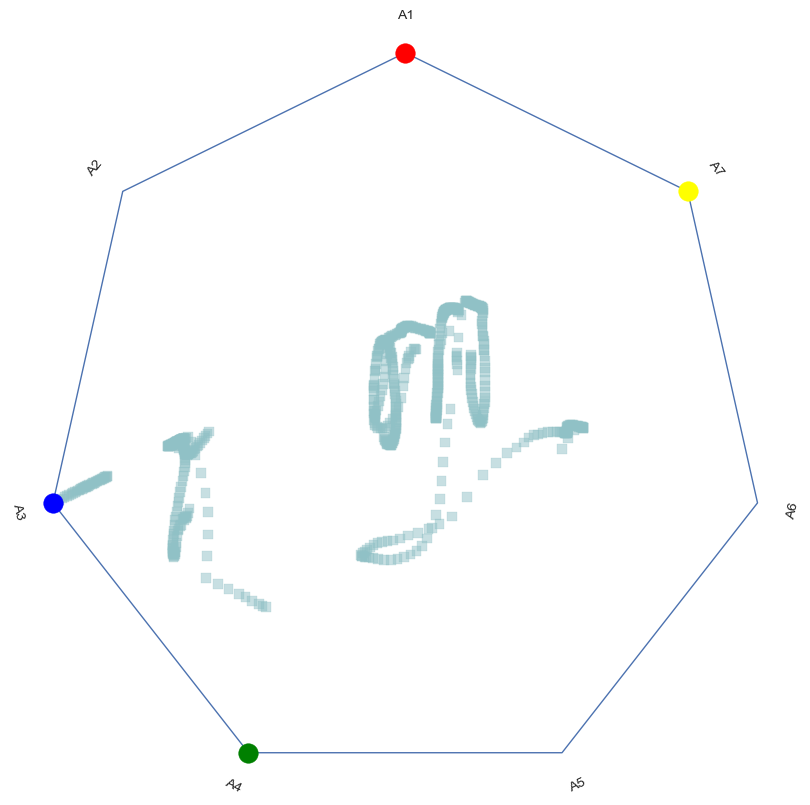

------------------
Ocean


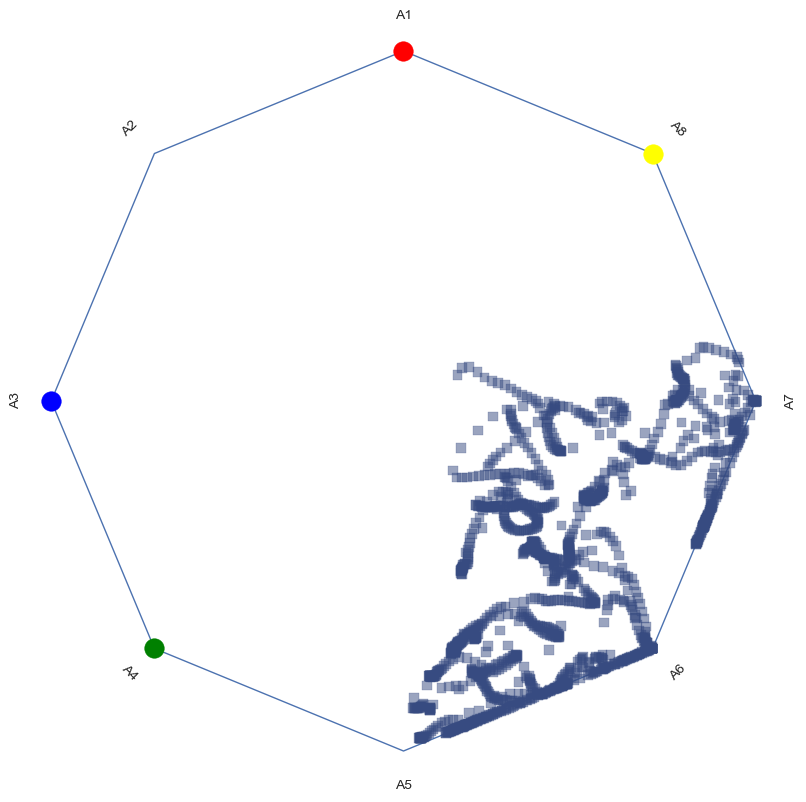

Desert


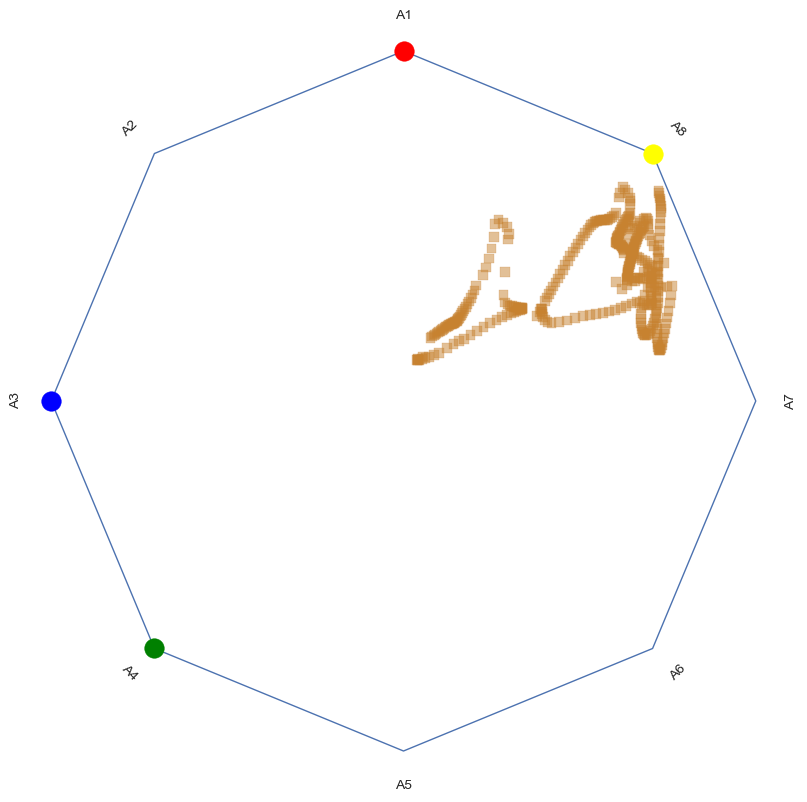

Biogenic


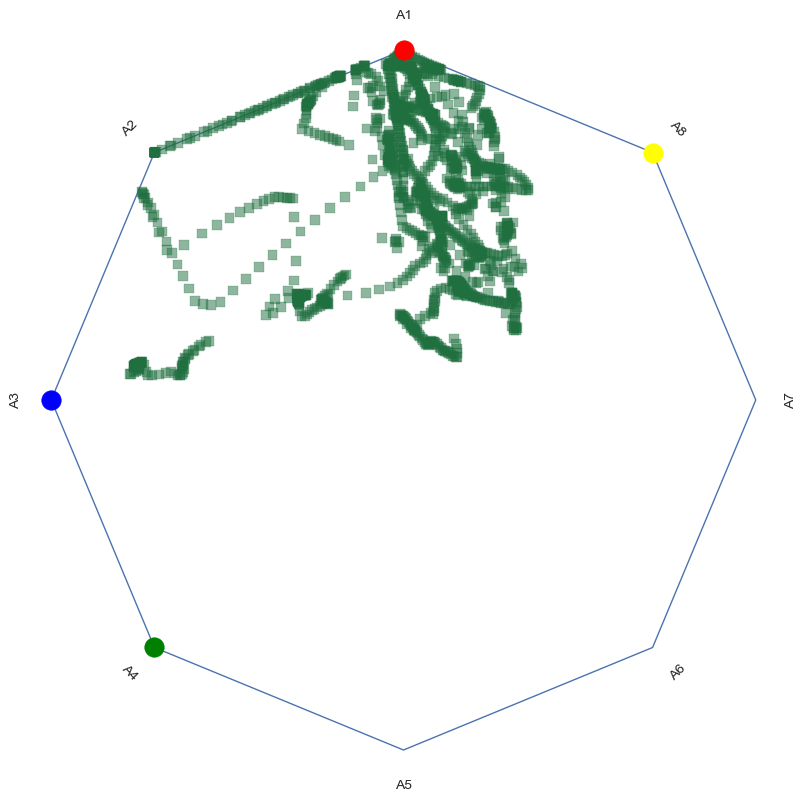

Urban


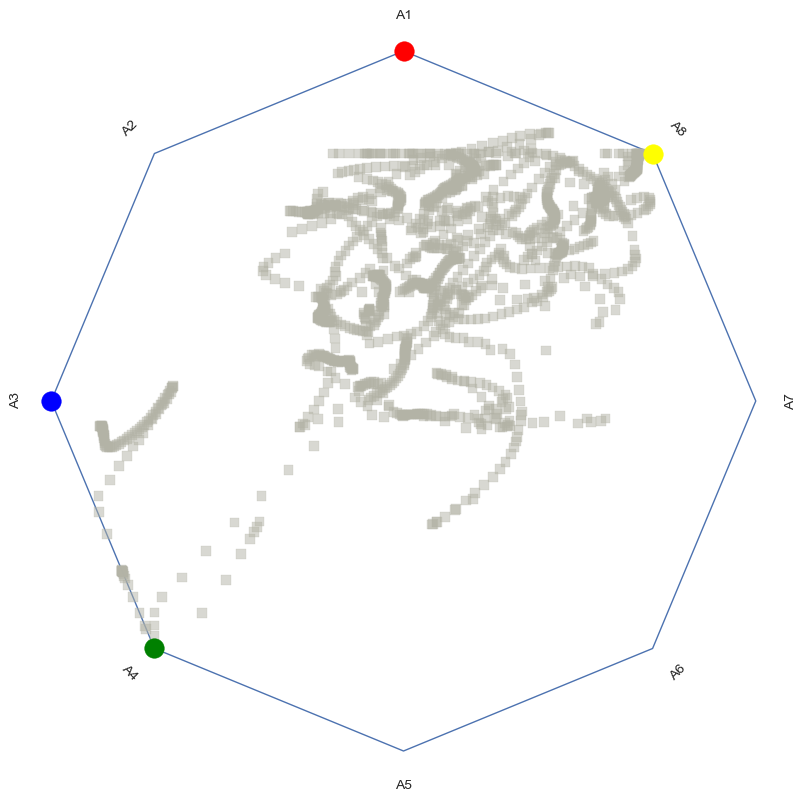

Almost Polar


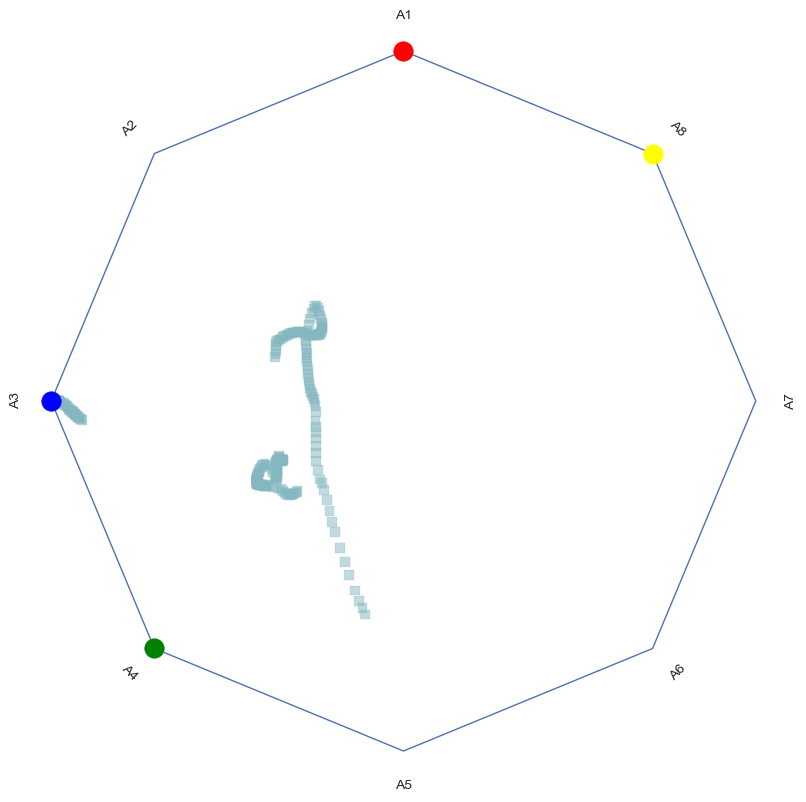

Polar


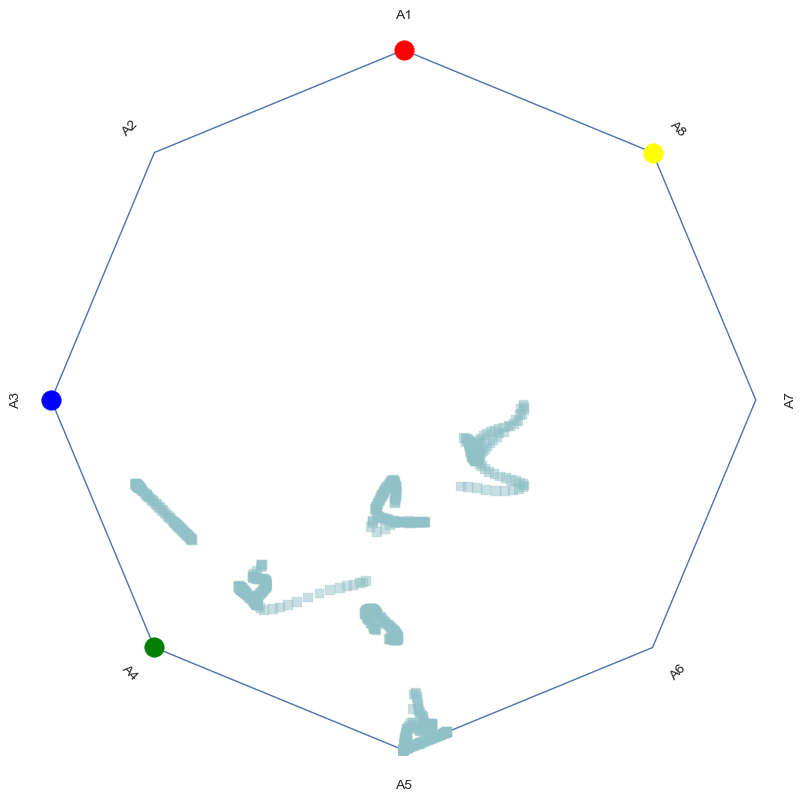

------------------


In [20]:
#coloring - Region
# colors = ['Red', 'Blue', 'Green', 'Yellow', 'Orange', 'Purple', 'Pink', 'Brown', 'Cyan', 'Magenta', 'Maroon', 'Navy', 'Olive', 'Teal', 'Lavender', 'Coral']
# df_args = level1_df[['location']].copy()
# df_args['color'] = colors[0]
# uniq_locations = df_args['location'].unique()
# color_dict = {location: color for location, color in zip(uniq_locations, colors)}
# df_args['color'] = df_args['location'].map(color_dict)
# plot_args = {'color': df_args['color']}
# color_dict = {location: color for location, color in zip(uniq_locations, colors)}

df_args = level1_df[['region']].copy()
df_args['color'] = df_args['region'].map(region_color)
plot_args = {'color': df_args['color']}
color_dict = region_color

#simplex plots    
flag = True
arr1 = AA_list_level1[1].archetypes.T
color_indices = []
for AA in AA_list_level1:
    arr2 = AA.archetypes.T
    similarities = cosine_similarity(arr1, arr2)
    sorted_indices = np.argsort(similarities, axis=None)[::-1]
    max_indices = np.unravel_index(sorted_indices, similarities.shape)
    sorted_indices = sorted(zip(max_indices[0][:4], max_indices[1][:4]), key=lambda x: x[0])
    sorted_second_indices = [idx2 for _, idx2 in sorted_indices]
    if flag:
        flag = False
        for region in region_color.keys():
            
            
#             location_indices = level1_df[level1_df['location'] == location].index
            location_indices = [level1_df.index.get_loc(index) for index in level1_df[level1_df['region'] == region].index]

            # Convert indices to numpy array for efficient slicing
            location_indices = np.array(location_indices)

            # Get corresponding columns from alfa
            new_alfa = AA.alfa[:, location_indices]   
            
            plot_args = {'color': [color_dict[region]]*len(location_indices)}
            
            print(region)
            plot_simplex(AA.n_archetypes, new_alfa, color_vertex= sorted_second_indices, plot_args=plot_args, grid_on=True, legend_color = color_dict, label = True)
    else:
        for region in region_color.keys():
#             location_indices = level1_df[level1_df['location'] == location].index
            location_indices = [level1_df.index.get_loc(index) for index in level1_df[level1_df['region'] == region].index]

            # Convert indices to numpy array for efficient slicing
            location_indices = np.array(location_indices)

            # Get corresponding columns from alfa
            new_alfa = AA.alfa[:, location_indices]  
            
            plot_args = {'color': [color_dict[region]]*len(location_indices)}
            print(region)
            plot_simplex(AA.n_archetypes, new_alfa, color_vertex= sorted_second_indices, plot_args=plot_args, grid_on=True, legend_color = color_dict, label = False)
    print('------------------')

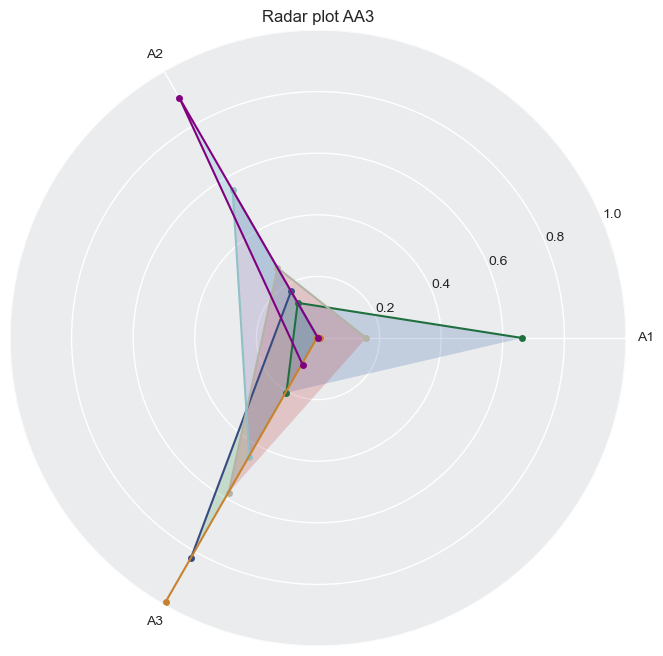

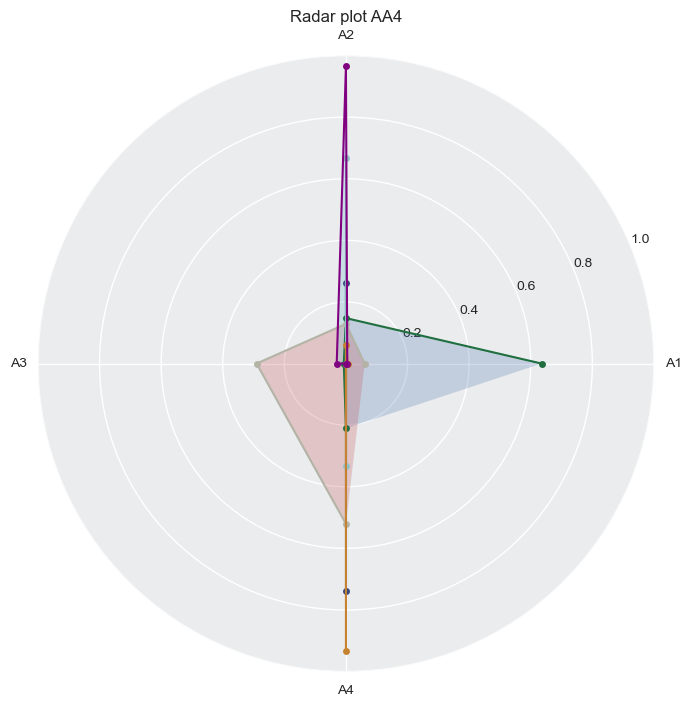

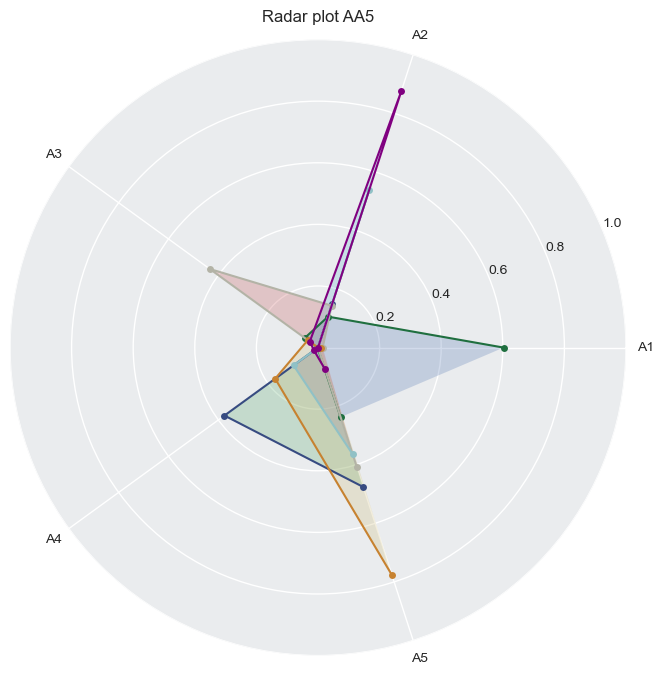

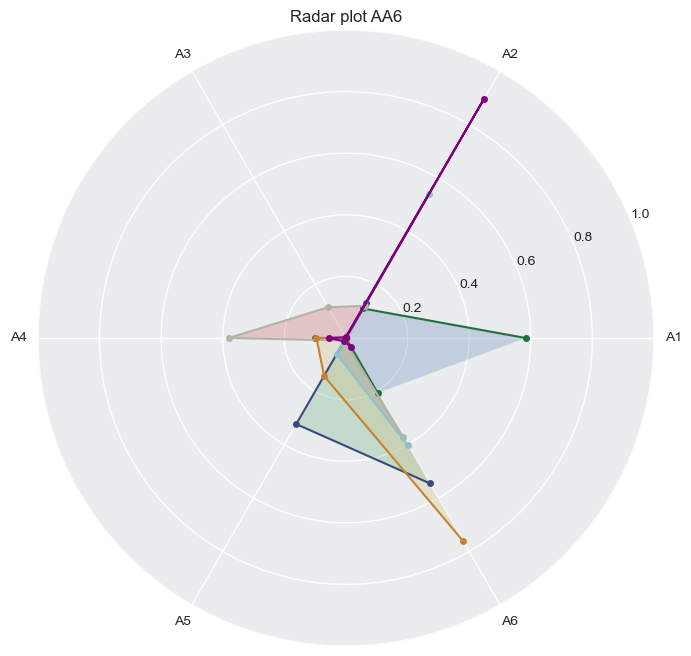

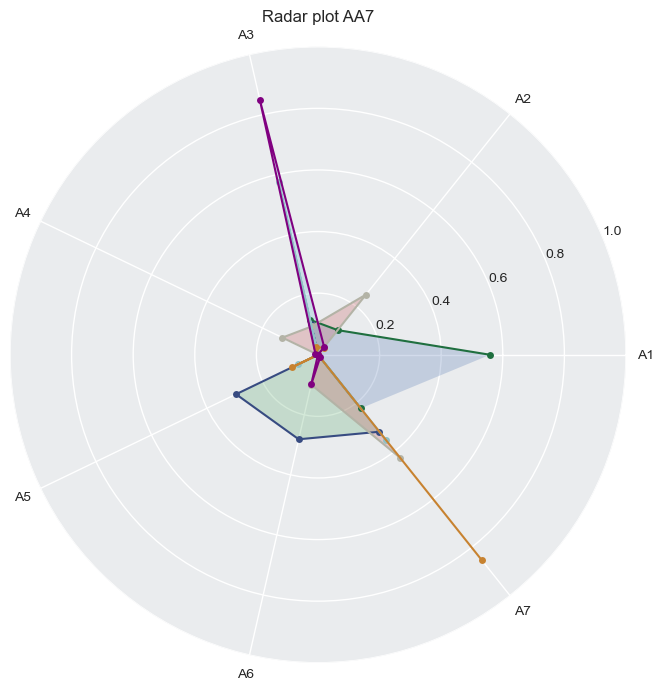

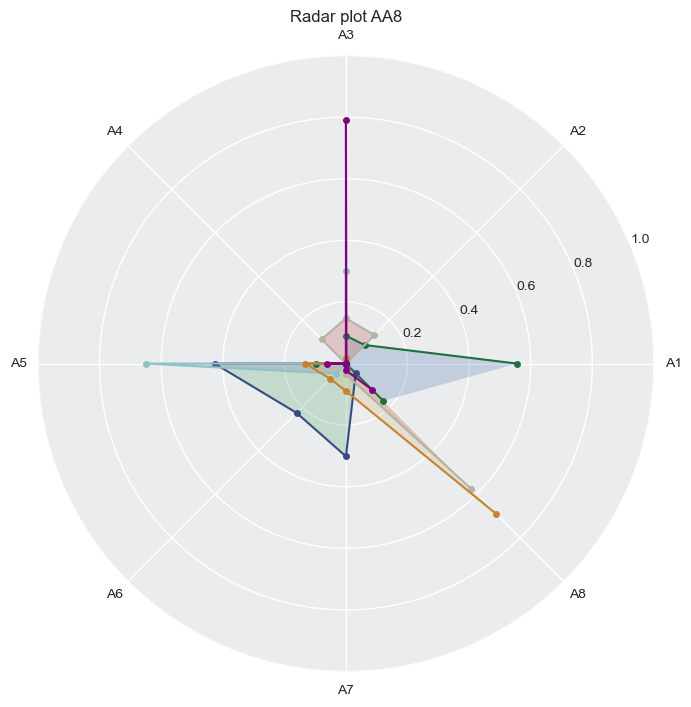

In [36]:
region_color1 = region_color.copy()
region_color1['Almost Polar'] = (128/255, 0/255, 128/255)

def category_mean(AA, df, column, target_columns, X_scaled):
    
    # Get unique categories in the specified column
    categories = df[column].unique()
    
    # Initialize an empty list to store data points
    data_points = {}
    
    # Calculate mean data point for each category
    for i, category in enumerate(categories):
        # Filter the DataFrame based on the category
        subset = df[df[column] == category]
        subset = subset[target_columns]
        indices = [level1_df.index.get_loc(index) for index in level1_df[level1_df[column] == category].index]

        X_scaled_new = X_scaled[indices,:]  
        
        # Calculate mean of the subset for target columns
        mean_values = X_scaled_new.mean(axis=0).reshape(1, -1)
        
        data_points[category] = mean_values
              
    return data_points

def plot_radar_datapoints(AA, X, ax=None, Title='Radar plot of datapoint', category=None):
    if ax is None:
        fig = plt.figure(figsize=(4, 4))
        ax = fig.add_subplot(111, polar=True)
    else:
        fig = ax.get_figure()

    _, alfa_X = AA.transform(X)
    
    labels = ['A' + str(i+1) for i in range(AA.n_archetypes)]
    angles = np.linspace(0, 2*np.pi, AA.n_archetypes, endpoint=False)
    if category:
        ax.plot(angles, alfa_X, 'o-', markersize=5, linewidth=1.5, color = region_color1[category])#color='#273746')
    else:
        ax.plot(angles, alfa_X, 'o-', markersize=5, linewidth=1.5, color='#273746')
    ax.fill(angles, alfa_X, alpha=0.25)
    ax.set_thetagrids(np.array(angles) * 180.0/np.pi, labels)
    ax.set_title(Title)
    ax.grid(True)
    ax.set_rlim(0, 1)
    ax.set_facecolor('#EAECEE')
    
    return ax



# Example usage:
lst_feat = ['C' + str(i) for i in range(1,291+1)]
sc = StandardScaler()
X = level1_df[lst_feat].values #Using level1_df here
X_scaled = sc.fit_transform(X)

for AA in AA_list_level1:
    data_points = category_mean(AA, level1_df, 'region', ['C' + str(i) for i in range(1,291+1)], X_scaled)


    # Example usage:
    # Create the initial figure and axis
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, polar=True)

    for category, data_point in data_points.items():
        plot_radar_datapoints(AA, data_point, ax=ax, Title='Radar plot AA'+str(AA.n_archetypes), category = category)

    plt.show()

# AA3

In [86]:
AA.archetypes

array([[-0.42431552, -0.02788675,  0.22876967],
       [-0.49922994,  0.09202546,  0.18081868],
       [-0.56552251,  0.15278765,  0.16942595],
       [ 0.61241878, -0.69436133,  0.36253322],
       [ 0.20803396,  0.10702753, -0.18016347],
       [ 0.        ,  0.        ,  0.        ],
       [ 1.75486077, -0.50169573, -0.34274177],
       [ 0.07036643, -0.63710434,  0.49459986],
       [-0.39114026, -0.46624552,  0.64467955],
       [ 0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ],
       [ 0.93468223, -0.43164215, -0.19748867],
       [ 0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ],
       [ 0.44835825, -0.33762925, -0.061

In [93]:
AA.n_archetypes

3

In [94]:
AA.alfa

array([[0.78887578, 0.70823254, 0.69843831, ..., 0.        , 0.        ,
        0.        ],
       [0.1050596 , 0.11362928, 0.11305618, ..., 0.64573631, 0.64289246,
        0.63957668],
       [0.10606461, 0.17813817, 0.1885055 , ..., 0.35426371, 0.35710756,
        0.36042334]])

In [105]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objects as go

# Given array
arr = AA.alfa  # Your array here

# Create 3D plot
# Create 3D scatter plot
fig = go.Figure(data=[go.Scatter3d(x=arr[0], y=arr[1], z=arr[2], mode='markers', marker=dict(size=5))])

# Set axis labels
fig.update_layout(scene=dict(xaxis_title='X', yaxis_title='Y', zaxis_title='Z'))

# Show plot
fig.show()

In [99]:
arr[0]

array([0.78887578, 0.70823254, 0.69843831, ..., 0.        , 0.        ,
       0.        ])